# Exploration of Daily Weather Data for the Burlington Area and Sea Surface Temperatures (AMO and NINO 3.4)

# Le' Sean Roberts

# CUNY New York City College of Technology Alumni (Graduate)

[Email](lesean.roberts85@gmail.com)

[GitHub](https://github.com/LeSeanRoberts)

[LinkedIn](https://www.linkedin.com/in/le-sean-roberts)

## Abstract

This project applies methodologies for analysing and predicting extreme weather events (both nomimal and extreme) through the combination of high-resolution daily meteorological observations, statistical modelling techniques, and large-scale climate indicators.

The study employs numerous feature engineering techniques to construct domain-informed extreme weather indicators, transforming raw meteorological data into meaningful signals of hazardous conditions. These engineered features are subsequently utilised within statistical analyses, classification and time series frameworks to estimate likelihoods and significances. 

To further uncover hidden structure in atmospheric processes, regime-switching methodologies—specifically Hidden Markov Models (HMM)—are applied to detect latent weather states and their relationship to varying levels of storm risk. This regime-based perspective provides deeper insight into the dynamic and non-linear nature of weather systems.

A central contribution of the project is the integration of local atmospheric data with large-scale oceanic variability through Sea Surface Temperature (SST) datasets and an Atlantic Multidecadal Oscillation (AMO)-type index. Constructing SST anomalies and residual-based indices.

Overall, this work demonstrates a comprehensive, multi-layered approach to extreme weather analysis, with potential applications in forecasting, risk management, and climate resilience. Future extensions may incorporate additional climate indices, spatial pattern recognition, causal inference techniques, and advanced machine learning models to further enhance predictive capability.

## Introduction

Extreme weather events pose significant challenges to societies, economies, and infrastructure, particularly as their frequency and intensity appear to be evolving in response to broader climatic changes. Traditional approaches to weather analysis often emphasize average conditions; however, such methods are insufficient for understanding the rare but high-impact events that drive risk. This project pursues models and analysis building by applying extreme event analysis, probabilistic modelling, statistical modelling and climate-scale interactions.

Data is applied in this project includes Burlington Vermont focused daily historical weather data, storm events and sea surface temperature data from the National Centers for Environmental Information (NCEI) and National Weather Service (NWS) under the National Oceanic and Atmospheric Administration (NOAA).

The study begins with the use of high-resolution daily weather observations focused on the Burlington Vermont region. These data provide a detailed representation of atmospheric conditions, enabling the application of Extreme Value Analysis (EVA) to rigorously model the statistical behavior of extremes. By concentrating on the tails of distributions rather than central tendencies, EVA offers a more appropriate lens for examining hazardous weather phenomena.

To translate raw meteorological variables into actionable insights, the project incorporates feature engineering techniques to construct extreme weather indicators. These indicators are derived using logical thresholds and domain knowledge, allowing for the identification of conditions associated with storms and other hazardous events. This step ensures that the modeling framework is grounded in physically meaningful representations of extreme weather.

Recognising that atmospheric processes are inherently dynamic and influenced by underlying regimes, the project further incorporates Hidden Markov Models (HMM). These models identify latent states within the data, offering insight into how transitions between different atmospheric regimes correspond to changes in storm risk. This regime-based approach captures the evolving nature of weather systems more effectively than static models.

Finally, the study extends beyond local atmospheric conditions by integrating large-scale oceanic variability through Sea Surface Temperature (SST) data and an AMO-type index. By constructing regional SST anomalies there's ability to the establish a connection between low-frequency climate signals and high-frequency weather dynamics. This possible multi-scale integration represents a key advancement in understanding the drivers of extreme weather.

The approach highlights the importance of integrating data across scales and methodologies towards interest in robust forecasting systems and improved climate risk assessment.

## Data Dictionary and Data Assimilation

Burlingtion, Vermont centered historical weather data is assimilated from Open-Meteo, an open-source weather API and offers free access for non-commercial use (Open-Meteo, n.d.) via a user-friendly JSON API. Open-Meteo partners with weather services and respected IGOs to produce open data with high resolution, ranging from 1 to 11 kilometres.

The main variables of interest are rainfall sum, snowfall sum and wind gusts. Such three variables are highly characteristic of extreme weather events with high potential of systematic disruptions.  

| Variables | Description | Units |
|-----------|-------------|-------|
| temperature_2m_max | Maximum daily air temperature at 2 meters above ground | $C^{\circ}$ ($F^{\circ}$) |
| temperature_2m_min | Minimum daily air temperature at 2 meters above ground | $C^{\circ}$ ($F^{\circ}$) |
| rain_sum | Sum of daily rain | mm |
| snowfall_sum | Sum of daily snowfall | cm |
| dew_point_2m_max | Daily maximum dew point temperature at 2 meters above ground | $C^{\circ}$ ($F^{\circ}$) |
| dew_point_2m_min | Daily miniimum dew point temperature at 2 meters above ground | $C^{\circ}$ ($F^{\circ}$) |
| wind_speed_10m_max | Maximum wind speed on a day at 10 meters above ground | km/h (mph, m/s, knots) |
| wind_speed_10m_min | Minimum wind speed on a day at 10 meters above ground | km/h (mph, m/s, knots) |
| pressure_msl_min | Minimum atmospheric air pressure reduced to mean sea level (msl) or pressure at surface | hPa | 
| pressure_msl_max | Maximum atmospheric air pressure reduced to mean sea level (msl) or pressure at surface | hPa | 
| soil_moisture_7_to_28cm_mean | Average soil water content as volumetric mixing ratio at 7-28 cm depth | cm |
| shortwave_radiation_sum | The sum of solar radiaion on a given day in Megajoules | $\frac{MJ}{m^2}$ |

**Weather Data Assimilation:**

In [1]:
import openmeteo_requests

import pandas as pd
import requests_cache
from retry_requests import retry

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
	"latitude": 44.48,
	"longitude": -73.21,
	"start_date": "1970-01-01",
	"end_date": "2026-04-08",
	"daily": ["temperature_2m_max", "temperature_2m_min", "rain_sum", "snowfall_sum",
              "dew_point_2m_max", "dew_point_2m_min", "pressure_msl_max",
              "pressure_msl_min", "soil_moisture_7_to_28cm_mean", "shortwave_radiation_sum",
              "wind_speed_10m_max", "wind_speed_10m_min"],
	"timezone": "auto",
}
responses = openmeteo.weather_api(url, params = params)

# Process first location. Add a for-loop for multiple locations or weather models
response = responses[0]
print(f"Coordinates: {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation: {response.Elevation()} m asl")
print(f"Timezone: {response.Timezone()}{response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0: {response.UtcOffsetSeconds()}s")

# Process daily data. The order of variables needs to be the same as requested.
daily = response.Daily()
daily_temperature_2m_max = daily.Variables(0).ValuesAsNumpy()
daily_temperature_2m_min = daily.Variables(1).ValuesAsNumpy()
daily_rain_sum = daily.Variables(2).ValuesAsNumpy()
daily_snowfall_sum = daily.Variables(3).ValuesAsNumpy()
daily_dew_point_2m_max = daily.Variables(4).ValuesAsNumpy()
daily_dew_point_2m_min = daily.Variables(5).ValuesAsNumpy()
daily_pressure_msl_max = daily.Variables(6).ValuesAsNumpy()
daily_pressure_msl_min = daily.Variables(7).ValuesAsNumpy()
daily_soil_moisture_7_to_28cm_mean = daily.Variables(8).ValuesAsNumpy()
daily_shortwave_radiation_sum = daily.Variables(9).ValuesAsNumpy()
daily_wind_speed_10m_max = daily.Variables(10).ValuesAsNumpy()
daily_wind_speed_10m_min = daily.Variables(11).ValuesAsNumpy()

daily_data = {"date": pd.date_range(
	start = pd.to_datetime(daily.Time() + response.UtcOffsetSeconds(), unit = "s", utc = True),
	end =  pd.to_datetime(daily.TimeEnd() + response.UtcOffsetSeconds(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = daily.Interval()),
	inclusive = "left"
)}

daily_data["temperature_2m_max"] = daily_temperature_2m_max
daily_data["temperature_2m_min"] = daily_temperature_2m_min
daily_data["rain_sum"] = daily_rain_sum
daily_data["snowfall_sum"] = daily_snowfall_sum
daily_data["dew_point_2m_max"] = daily_dew_point_2m_max
daily_data["dew_point_2m_min"] = daily_dew_point_2m_min
daily_data["pressure_msl_max"] = daily_pressure_msl_max
daily_data["pressure_msl_min"] = daily_pressure_msl_min
daily_data["soil_moisture_7_to_28cm_mean"] = daily_soil_moisture_7_to_28cm_mean
daily_data["shortwave_radiation_sum"] = daily_shortwave_radiation_sum
daily_data["wind_speed_10m_max"] = daily_wind_speed_10m_max
daily_data["wind_speed_10m_min"] = daily_wind_speed_10m_min

daily_dataframe = pd.DataFrame(data = daily_data)
print("\nDaily data\n", daily_dataframe)


Coordinates: 44.46397018432617°N -73.15951538085938°E
Elevation: 76.0 m asl
Timezone: b'America/New_York'b'GMT-4'
Timezone difference to GMT+0: -14400s

Daily data
                            date  temperature_2m_max  temperature_2m_min  \
0     1970-01-01 00:00:00+00:00          -11.647500          -18.597500   
1     1970-01-02 00:00:00+00:00          -10.097500          -16.897499   
2     1970-01-03 00:00:00+00:00           -9.997499          -19.297501   
3     1970-01-04 00:00:00+00:00          -14.097500          -18.597500   
4     1970-01-05 00:00:00+00:00           -7.847500          -19.647499   
...                         ...                 ...                 ...   
20547 2026-04-04 00:00:00+00:00           11.050000            1.800000   
20548 2026-04-05 00:00:00+00:00            9.300000            4.950000   
20549 2026-04-06 00:00:00+00:00            4.050000           -0.750000   
20550 2026-04-07 00:00:00+00:00            1.200000           -3.050000   
20551 2026

In [2]:
# Checking for data data characteristics and missing values
daily_dataframe.info()
daily_dataframe.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   date                          20552 non-null  datetime64[ns, UTC]
 1   temperature_2m_max            20552 non-null  float32            
 2   temperature_2m_min            20552 non-null  float32            
 3   rain_sum                      20552 non-null  float32            
 4   snowfall_sum                  20552 non-null  float32            
 5   dew_point_2m_max              20552 non-null  float32            
 6   dew_point_2m_min              20552 non-null  float32            
 7   pressure_msl_max              20552 non-null  float32            
 8   pressure_msl_min              20552 non-null  float32            
 9   soil_moisture_7_to_28cm_mean  20552 non-null  float32            
 10  shortwave_radiation_sum       2055

date                            0
temperature_2m_max              0
temperature_2m_min              0
rain_sum                        0
snowfall_sum                    0
dew_point_2m_max                0
dew_point_2m_min                0
pressure_msl_max                0
pressure_msl_min                0
soil_moisture_7_to_28cm_mean    0
shortwave_radiation_sum         0
wind_speed_10m_max              0
wind_speed_10m_min              0
dtype: int64

## Preliminary Exploratory Data Analysis 

Will begin by probing the nature of the daily weather variables via summary statistics, other statistical measures and visualisations.

#### Descriptive Statistics, Skewness, and Kurtosis

Descriptive statistics provide a foundational summary of a dataset by characterising its central tendency, dispersion, and shape. Measures such as the mean, median, and mode describe typical values, while variance, standard deviation, range, and interquartile range quantify variability. Together, these metrics offer an initial understanding of the structure and reliability of observed data before any modeling or inference is performed.

**Skewness** measures the asymmetry of a distribution around its central value. A positive (right) skew indicates a longer or heavier right tail, often associated with infrequent but extreme high values, whereas a negative (left) skew reflects a longer left tail. Skewness is particularly important in identifying departures from normality, understanding bias in the mean relative to the median, and diagnosing whether transformations or non-Gaussian models may be appropriate.

$$Skewness = \frac{E[(X - \mu)^3}{\sigma^3}$$


**Kurtosis** describes the tailedness and peakedness of a distribution relative to a normal distribution. High kurtosis (leptokurtic) signals heavy tails and a higher probability of extreme events, while low kurtosis (platykurtic) indicates lighter tails and fewer extremes. In applied settings—such as finance, climatology, or risk analysis—kurtosis is critical for assessing tail risk and the likelihood of rare but impactful outcomes. With Python, for the case of using the pandas package the Fisher’s kurtosis (excess kurtosis) is applied — not the raw (Pearson) fourth central moment ratio.

$$Excess\,\,Kurtosis = \frac{E[(X - \mu)^4}{\sigma^4}- 3$$

Collectively, descriptive statistics, skewness, and kurtosis form a diagnostic toolkit for understanding data behavior, detecting anomalies, guiding distributional assumptions, and informing subsequent analytical and modeling choices.

Will now explore the **raw** daily measures before aggregrations or declustering of the data (**max values for rianfall in particular**). 


**Descriptive Statistics:**

In [3]:
# Summary Statistics
no_date_cols = daily_dataframe.drop(columns=['date'])
print(no_date_cols.describe())

       temperature_2m_max  temperature_2m_min      rain_sum  snowfall_sum  \
count        20552.000000        20552.000000  20552.000000  20552.000000   
mean            11.542063            3.659964      2.242045      0.397871   
std             11.158312           11.027195      5.309424      1.589770   
min            -25.447500          -32.897499      0.000000      0.000000   
25%              2.752500           -3.747500      0.000000      0.000000   
50%             11.802500            4.200000      0.000000      0.000000   
75%             21.302500           13.152500      1.800000      0.000000   
max             36.352501           24.900000    109.299995     36.539997   

       dew_point_2m_max  dew_point_2m_min  pressure_msl_max  pressure_msl_min  \
count      20552.000000      20552.000000      20552.000000      20552.000000   
mean           6.018529         -0.120017       1019.613647       1011.798340   
std           10.489981         11.502160          7.689703    

**Skew and Kurtosis:**

In [4]:
print("Skewness for Burlington, VT Daily Data_1970_to April_8_2026:")
display(no_date_cols.skew())

print("\nKurtosis for Burlington, VT Daily Data_1970_to April_8_2026:")
display(no_date_cols.kurt())

Skewness for Burlington, VT Daily Data_1970_to April_8_2026:


temperature_2m_max             -0.210931
temperature_2m_min             -0.417188
rain_sum                        4.658450
snowfall_sum                    7.524541
dew_point_2m_max               -0.400211
dew_point_2m_min               -0.365869
pressure_msl_max                0.191155
pressure_msl_min               -0.329582
soil_moisture_7_to_28cm_mean   -0.990188
shortwave_radiation_sum         0.364755
wind_speed_10m_max              0.661518
wind_speed_10m_min              1.241047
dtype: float32


Kurtosis for Burlington, VT Daily Data_1970_to April_8_2026:


temperature_2m_max              -0.864573
temperature_2m_min              -0.610357
rain_sum                        36.593327
snowfall_sum                    77.938843
dew_point_2m_max                -0.621120
dew_point_2m_min                -0.696138
pressure_msl_max                 0.297040
pressure_msl_min                 0.752949
soil_moisture_7_to_28cm_mean     2.315263
shortwave_radiation_sum         -1.016918
wind_speed_10m_max               0.604995
wind_speed_10m_min               1.690488
dtype: float32

#### Histograms + Kernels Densities and Quantile-Quantile Plots

**Histograms** are a fundamental graphical tool for visualizing the empirical distribution of a variable. By grouping observations into bins, histograms reveal key features such as central tendency, spread, skewness, multimodality, and the presence of outliers. They provide an intuitive, nonparametric view of data structure and are especially useful for identifying departures from symmetry, heavy tails, or regime mixtures that may not be evident from summary statistics alone. The choice of bin width influences interpretation, making histograms most effective as an exploratory diagnostic rather than a precise inferential tool.

A **Quantile-Quantile (Q-Q) plot** is a graphical tool used to assess if a dataset follows a specific theoretical distribution (most commonly a normal distribution) or if two datasets come from the same population. It works by plotting the quantiles (percentiles) of one dataset against the quantiles of another or against a theoretical distribution.

1. **Sorted Data:** The sample data is ordered from smallest to largest (these are the sample quantiles).

2. **Theoretical Quantiles:** The expected values of the data if it perfectly followed a chosen distribution (e.g., a normal distribution with the same mean and standard deviation).

3. **Pairs:** Each point on the plot is a pair (sample quantile, theoretical quantile).

4. **Straight Line:** If the points lie approximately along a straight 45-degree diagonal line, the dataset follows the assumed distribution (e.g., it is normally distributed).

5. **S-Shape:** An S-shaped curve indicates that the data has "heavier" or "lighter" tails than the theoretical distribution (more or fewer extreme values).

6. **Curves/Bending ("Bananas"):** If the points bend away from the line (concave or convex), it indicates that the data is skewed.

7. **Isolated Points:** Points that are far from the line, especially at the ends, indicate outliers.

Together, histograms and Q–Q graphs complement numerical descriptive statistics by providing visual diagnostics of distributional form. Histograms offer a broad, intuitive overview of data shape, while Q–Q graphs provide a precise assessment of how empirical distributions differ from theoretical expectations. Used jointly, they guide appropriate choices of transformations, distributional assumptions, and modeling strategies in applied analysis.

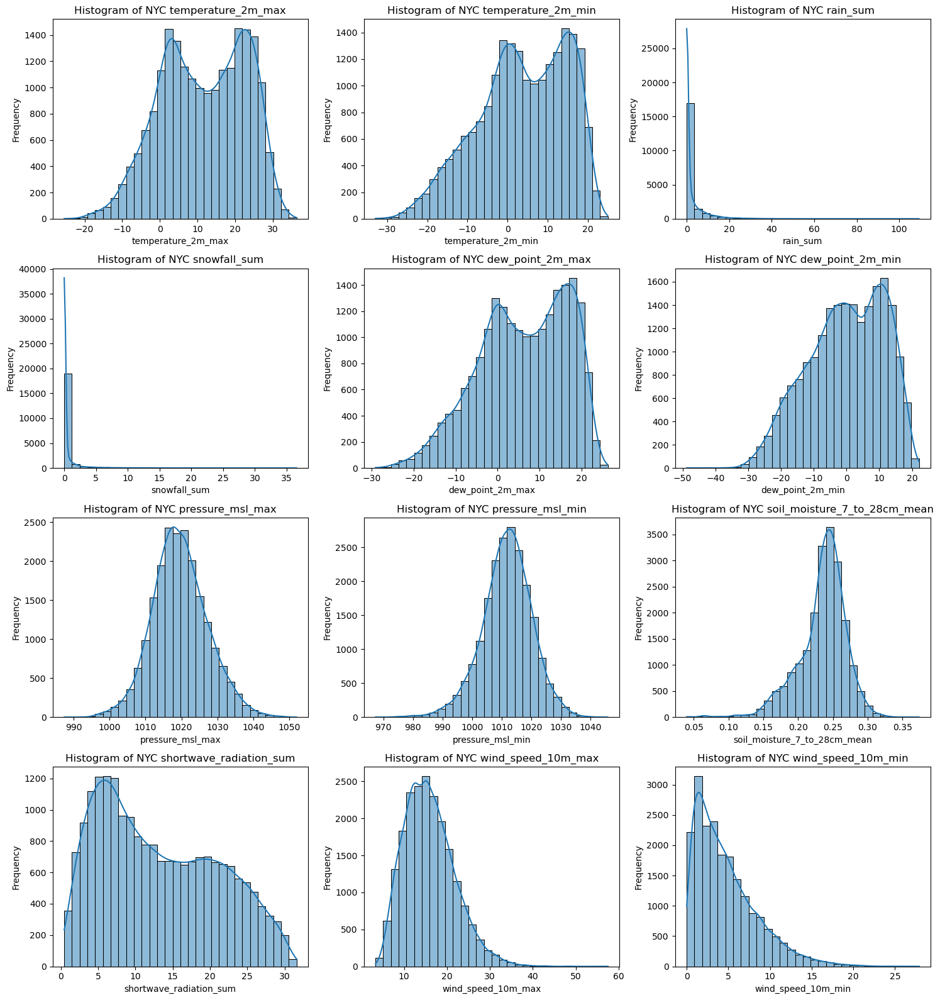

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get numerical columns, excluding 'date'
numeric_cols = daily_dataframe.drop(columns=['date']).columns

# Determine grid size for subplots
n_cols = 3  # Number of columns in the subplot grid
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols # Calculate rows needed

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(daily_dataframe[col], kde=True, bins=30)
    plt.title(f'Histogram of NYC {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

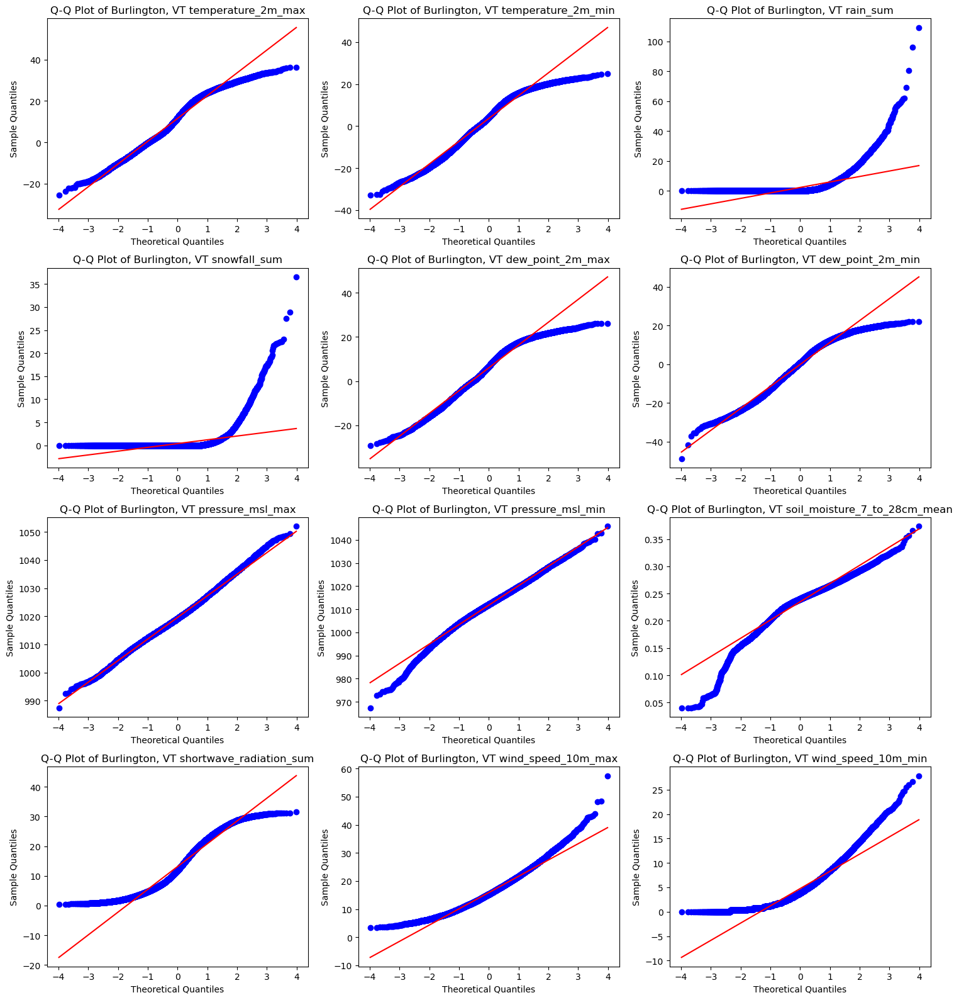

In [6]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Get numerical columns, excluding 'date'
numeric_cols = daily_dataframe.drop(columns=['date']).columns

# Determine grid size for subplots
n_cols = 3  # Number of columns in the subplot grid
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols # Calculate rows needed

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    stats.probplot(daily_dataframe[col], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of Burlington, VT {col}')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')

plt.tight_layout()
plt.show()


Based on the kurtosis measures, and visual results of both histograms and QQ plots, tools such as T-tests and ANOVA aren't robust for the variable collective since normality isn't prevalent.

#### Spearman Rank Correlaion

Aside form daily dates, all variables considered are continuous. However, again, **normality is not prevalent**. 

**Spearman’s Rank Correlation** ($r_s$ or $\rho$) is a non-parametric measure of the strength and direction of the association between two ranked variables. Unlike the Pearson correlation, which assesses linear relationships and requires data to follow a normal distribution, Spearman evaluates monotonic relationships. A monotonic relationship is one where the variables tend to change together, but not necessarily at a constant rate. Since it relies on the relative ranks of data points rather than their raw values, Spearman is significantly more robust against outliers and is ideal for ordinal data or non-linear continuous data.

The calculation involves ranking the observations for each variable from smallest to largest and then applying the correlation formula to these ranks. If two variables are perfectly monotonically related—meaning that as one increases, the other always increases or always decreases—the Spearman coefficient will be $+1$ or $-1$, respectively. A coefficient of $0$ indicates no monotonic trend. This makes it particularly useful in fields like biology or psychology, where researchers often encounter variables that grow together in a non-linear fashion, such as the relationship between a person's age and their reaction time.One of the primary advantages of using Spearman over Pearson is its flexibility with distribution assumptions. It does not require the "bell curve" of normality, making it a "distribution-free" test. However, it is important to remember that Spearman only detects trends; it cannot distinguish between a straight line and a curve, provided the curve is always moving in the same direction. When the data contains many "tied" ranks (multiple observations with the same value), a slightly adjusted version of the formula is used to ensure the correlation remains an accurate reflection of the relationship’s strength.

**The Standard Formula**

If there are no tied ranks (or very few), the most common version is:

$$\rho = 1 - \frac{6 \sum d_i^2}{n(n^2 - 1)}$$

Where:

$d_i$ = The difference between the two ranks of each observation ($rank(x_i) - rank(y_i)$).

$n$ = The total number of observations.

**Step-by-Step Calculation**

1. Rank the data: Assign a rank to every value in variable $X$ and variable $Y$ independently (usually $1$ for the smallest value).

2. Find the difference ($d$): For each pair of data points, subtract the rank of $Y$ from the rank of $X$.

3. Square the differences ($d^2$): This ensures all values are positive and emphasizes larger discrepancies in rank.

4. Sum them ($\sum d^2$): Add all the squared differences together.

5. Plug into the formula: Multiply the sum by $6$, then divide by the total number of observations multiplied by the square of that number minus one.

**Formula for Tied Ranks**

When many data points have the same value (tied ranks), the formula above becomes less accurate. In those cases, we use the same formula as the Pearson Correlation, but applied specifically to the ranks rather than the raw numbers:

$$\rho = \frac{\text{cov}(R(X), R(Y))}{\sigma_{R(X)} \sigma_{R(Y)}}$$

Where:

$R(X)$ and $R(Y)$ are the ranks of the variables.

$\text{cov}$ is the covariance of the ranks.

$\sigma$ represents the standard deviation of the ranks.

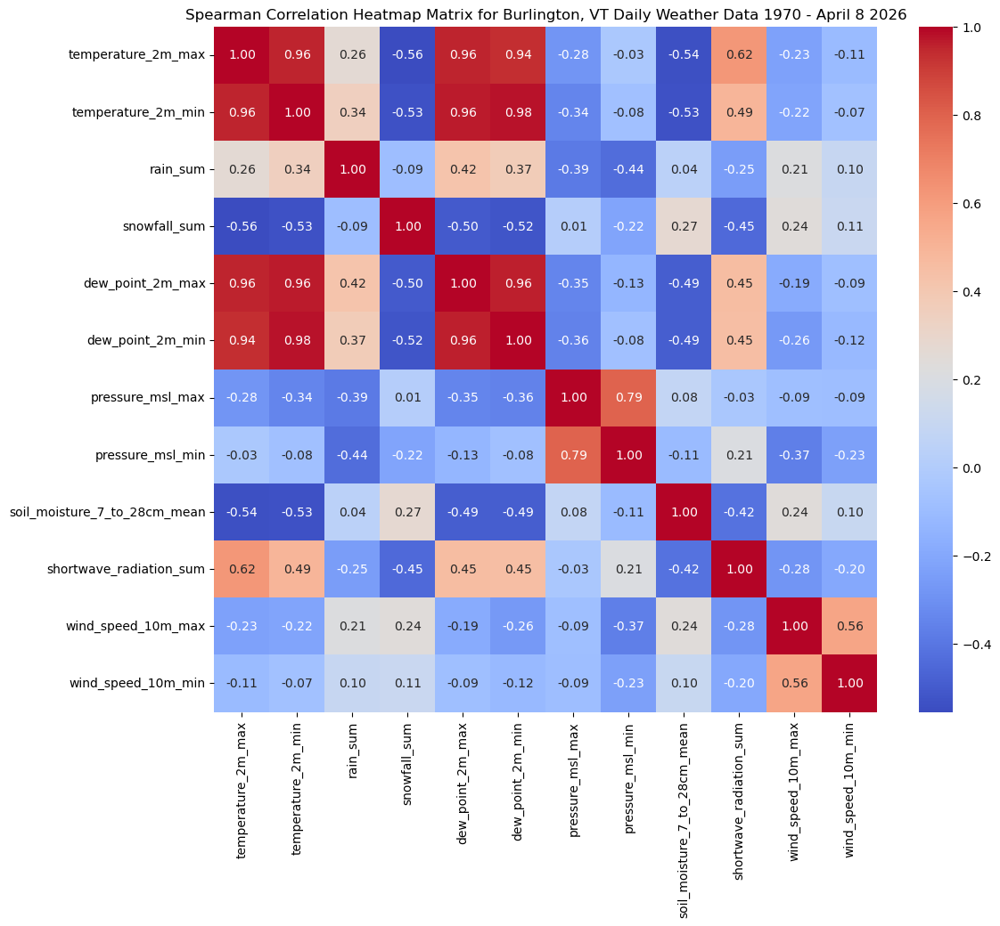

In [7]:
# Calculate the Spearman correlation matrix, excluding the non-numeric 'date' column
correlation_matrix = no_date_cols.corr(method='spearman')

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Spearman Correlation Heatmap Matrix for Burlington, VT Daily Weather Data 1970 - April 8 2026')
plt.show()

**NOTE:** naturally, data pairs don't need to have a linear relationship in general.

#### Scatter Plots

Scatter plots are a primary graphical tool for examining the relationship between two quantitative variables. By plotting paired observations in two-dimensional space, scatter plots reveal the direction, strength, and form of association between variables, providing immediate insight into whether relationships are linear, nonlinear, or absent.

Beyond correlation, scatter plots are especially valuable for diagnosing structural features in data, such as clusters, regimes, heteroskedasticity, and outliers. Patterns like curvature, fan-shaped dispersion, or distinct groupings often indicate that simple linear models may be inadequate and that transformations, stratification, or nonlinear approaches are warranted.

In applied analysis, scatter plots serve as a critical complement to numerical measures such as Pearson correlation. While correlation summarizes linear co-movement with a single statistic, scatter plots expose context and complexity that summary measures can obscure. In fields such as meteorology and climatology, scatter plots help identify coupled processes (e.g., radiation–temperature or wind–pressure relationships), regime dependence, and physically meaningful constraints, making them an essential diagnostic step prior to formal modeling.

**AGAIN:** naturally, data pairs don't need to have a linear relationship in general.

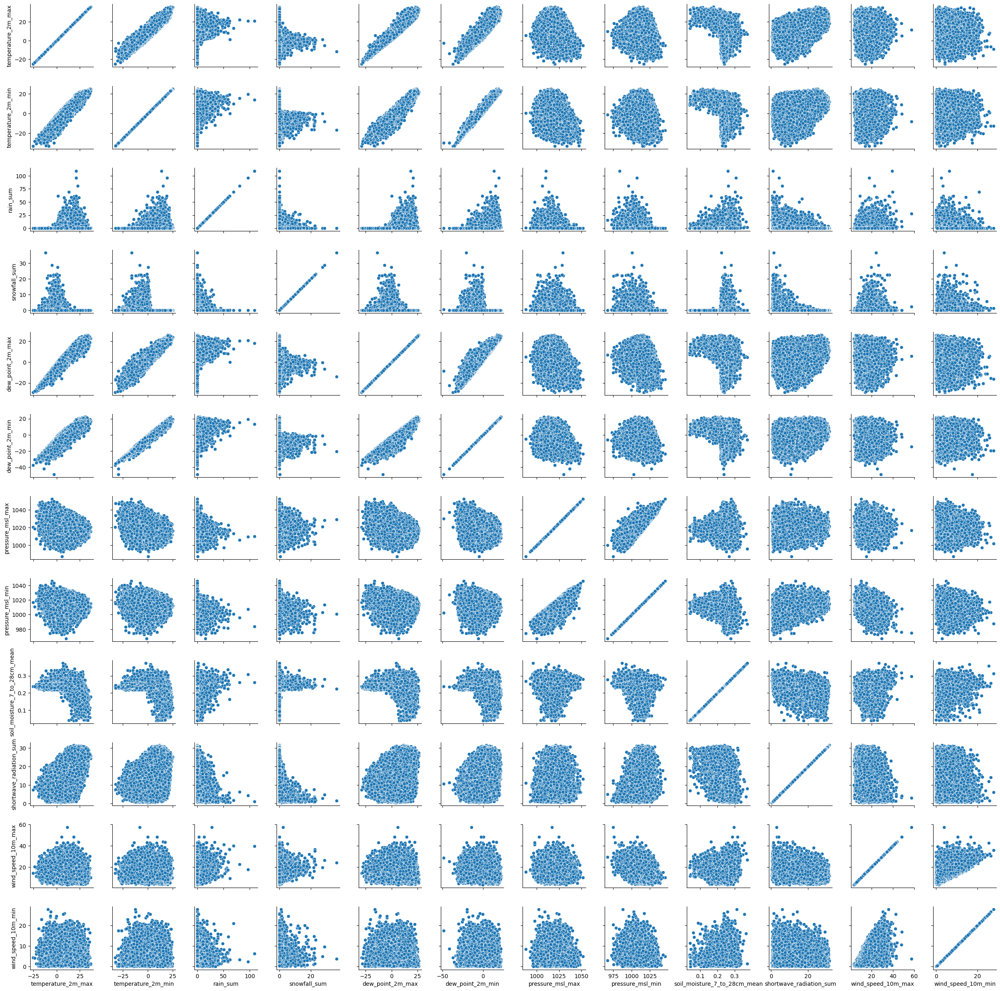

In [8]:
# Creating PairGrid with three columns
g = sns.PairGrid(no_date_cols)
# Mapping scatterplots
g.map(sns.scatterplot)

# Adjusting columns specification
plt.subplots_adjust(left = 0.1, right = 0.9, top = 0.9, bottom = 0.1, wspace = 0.3, hspace = 0.3)
# Showing plot
plt.show()


## A Basic Introduction for Extreme Value Analysis (General Case)

**Extreme Value analysis (EVA) or Extreme Value Theory (EVT)** is essential in climate science to study rare and extreme climate events, such as heatwaves, cold spells, floods, droughts, or storms. These events have significant impacts, and EVA provides a foundation to quantify their frequency, magnitude, and associated risks. Daily data is standard for climate extremes. The applied daily data has variables that exemplify such.

The role of EVT is to describe the random behaviour of the $k-$th largest or smallest values of a sample under the most general conditions possible; later on those results can be applied in concrete decision or design problems (Coles, 2001).

### Selecting an Extreme Value Model

The **GENERALIZED EXTREME VALUE (GEV)** distribution is a key concept in extreme value theory (EVT), which deals with the statistical modelling of extreme deviations from the median of probability distributions. The GEV distribution is used to model the behavior of the maximum (or minimum) of a large number of random variables, and it arises naturally when considering the limiting distribution of block maxima.

The GEV distribution combines three different types of distributions that arise in extreme value theory:

1. Gumbel distribution (Type I) – Models light-tailed extremes (e.g., normal or exponential distributions).

2. Fréchet distribution (Type II) – Models heavy-tailed extremes (e.g., power-law behavior like Pareto distributions).

3. Weibull distribution (Type III) – Models bounded upper extremes (e.g., distributions that have an upper limit).

These three distributions are unified under the GEV through a shape parameter, $\xi$, which determines the type:

1. $\xi$ = 0 (Gumbel)

2. $\xi$ > 0 (Fréchet)

3. $\xi$ < 0 (Weibull)

The GEV distribution is parameterised by three values:

1. $\mu$ (location parameter): Determines where the distribution is centered.

2. $\sigma$ (scale parameter): Controls the spread or scale of the distribution.

3. $\xi$ (shape parameter): Determines the tail behavior, distinguishing between Gumbel, Fréchet, and Weibull types.

The cumulative distribution function (CDF) of the GEV is given by:

$$F(x; \mu, \sigma, \xi) = \exp\left\{ -\left[ 1 + \xi \left( \frac{x-\mu}{\sigma} \right) \right]^{-\frac{1}{\xi}} \right\}, \quad \text{for } 1 + \xi \left( \frac{x-\mu}{\sigma} \right) > 0$$

Fits the Generalized Extreme Value (GEV) distribution to the block maxima. GEV combines three families of extreme value distributions: Gumbel, Frechet, and Weibull. Tthe resulting probability distribution function (PDF) for two category of shape parameter (i.e., whether it is equal to zero or not) is

$$\frac{1}{\sigma}t(x)^{x + 1}e^{-t(x)}$$

Where,

$$
t(x) = 
\begin{cases} 
\left( 1 + \xi \frac{x-\mu}{\sigma} \right)^{-1/\xi}, & \text{if } \xi \neq 0 \\
e^{-(x-\mu)/\sigma}, & \text{if } \xi = 0 
\end{cases}
 $$

Python code to plot the three types of GEV densities:

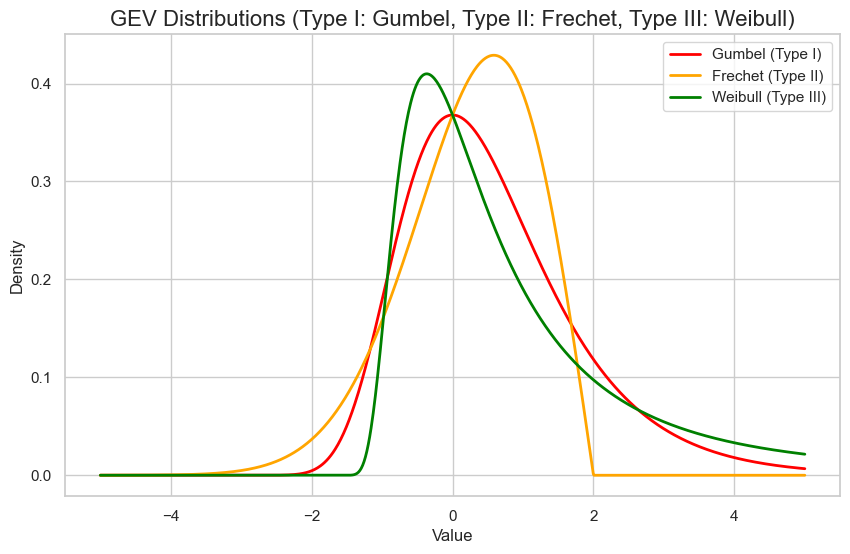

In [9]:
from scipy.stats import genextreme as gev
import numpy as np

# Set Seaborn style for pretty plots
sns.set(style="whitegrid")

# Define parameters for the three types of GEV distributions
params = {
    "Gumbel (Type I)": {'shape': 0, 'loc': 0, 'scale': 1},
    "Frechet (Type II)": {'shape': 0.5, 'loc': 0, 'scale': 1},
    "Weibull (Type III)": {'shape': -0.5, 'loc': 0, 'scale': 1}
}

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot GEV densities for each type
x = np.linspace(-5, 5, 1000)  # Common range for all GEV types
colors = ['red', 'orange', 'green']

for i, (label, param) in enumerate(params.items()):
    # Extract shape, loc, and scale
    shape = param['shape']
    loc = param['loc']
    scale = param['scale']

    # Generate GEV PDF
    pdf = gev.pdf(x, shape, loc=loc, scale=scale)

    # Plot the PDF
    ax.plot(x, pdf, label=f'{label}', color=colors[i], lw=2)

# Add labels and title
ax.set_title("GEV Distributions (Type I: Gumbel, Type II: Frechet, Type III: Weibull)", fontsize=16)
ax.set_xlabel("Value", fontsize=12)
ax.set_ylabel("Density", fontsize=12)

# Add legend
ax.legend(loc='upper right')

# Show the plot
plt.show()

#### The Two Main Approaches to Extreme Value Modelling

There are two main approaches to extreme value modeling:

1. **Block Maxima Approach --** Break the data into blocks (e.g., yearly or monthly) and only take the maximum (or minimum) value from each block.

2. **Peak Over Threshold (POT) Approach --** Defining a threshold (high quantile) and analyze values exceeding this threshold. Fits the Generalized Pareto Distribution (GPD) to exceedances over the threshold. The choice of threshold is critical; it should be high enough to capture extremes without being too high to leave out too many data points.The probability density function (PDF) of the Generalized Pareto Distribution (GPD) is given by:

$$
f(x) = \begin{cases} 
\frac{1}{\sigma} \left( 1 + \xi \frac{x - \mu}{\sigma} \right)^{-\left( \frac{1}{\xi} + 1 \right)}, & \text{if } \xi \neq 0 \\ 
\frac{1}{\sigma} e^{-(x - \mu) / \sigma}, & \text{if } \xi = 0 
\end{cases}
 $$

 The Generalized Pareto Distribution (GPD) is a flexible distribution often used to model extreme value phenomena. Its probability density function (PDF) is characterised by three parameters: $\mu$, $\sigma$, and $\xi$.

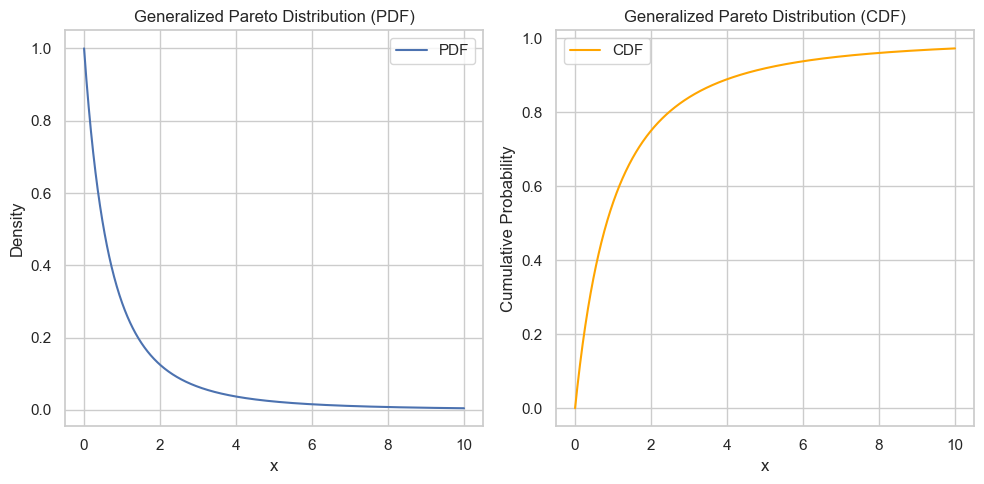

In [10]:
from scipy.stats import genpareto

# Parameters for the Generalized Pareto Distribution
shape_param = 0.5  # ξ (shape parameter)
scale_param = 1.0  # σ (scale parameter)
loc_param = 0.0    # μ (location parameter)

# Generate x values
x = np.linspace(0, 10, 1000)

# PDF and CDF using scipy's genpareto
pdf_values = genpareto.pdf(x, c=shape_param, loc=loc_param, scale=scale_param)
cdf_values = genpareto.cdf(x, c=shape_param, loc=loc_param, scale=scale_param)

# Plotting the PDF
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(x, pdf_values, label='PDF')
plt.title('Generalized Pareto Distribution (PDF)')
plt.xlabel('x')
plt.ylabel('Density')
plt.grid(True)
plt.legend()

# Plotting the CDF
plt.subplot(1, 2, 2)
plt.plot(x, cdf_values, label='CDF', color='orange')
plt.title('Generalized Pareto Distribution (CDF)')
plt.xlabel('x')
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

#### Distribution Fitting

The functions of the parameters both in GEV and GPD have the same function. Fit the Distribution GEV (Generalized Extreme Value) Distribution:

1. In the block maxima method, you can fit the GEV distribution using Maximum Likelihood Estimation (MLE). The GEV distribution has three parameters -–

   Location ($\mu$): Determines the center of the distribution.

   Scale ($\sigma$): Determines the spread.

   Shape ($\xi$): Governs the tail behavior (whether it is heavy, light, or bounded).

2. GPD (Generalized Pareto Distribution). In the POT approach, fit the GPD to the excesses above the chosen threshold. The GPD distribution also has shape, scale, and threshold parameters. The return level is the value that is expected to be exceeded once on average every T years. This is crucial for risk assessment:

   Return Level: For the GEV distribution, the $T$-year return level $z_T$ is computed by --

$$z_T = \mu + \frac{\sigma}{\xi} \left[ \left( -\ln\left(1 - \frac{1}{T}\right) \right)^{-\xi} - 1 \right]$$


For the GPD distribution, return levels are computed based on the scale and shape parameters for exceedances.

Diagnostics and Model Checking After fitting the model, it’s important to check the fit:

    Quantile-Quantile (Q-Q) Plots -- Check whether the fitted distribution matches the observed extremes.

    Return Level Plot -- Plot return levels against the return periods. This helps validate that your model accurately predicts extreme events for longer return periods.

    Residual Analysis -- Analyze residuals to see if they show any patterns (residuals should be randomly distributed).

Interpreting the Results:

    Return Period -- The expected number of years between extreme events of a certain magnitude. For example, the "100-year event" refers to an event that has a 1% chance of occurring in any given year.

    Probability of Exceedance -- The likelihood that an extreme event will exceed a given threshold in a particular year.

For the following, there's computing the temperature level that is expected to occur, on avaregage, once evey 100 years. The return period $T$ represents the average number of years you would expected between events that exceed a particular extreme value.

The return level, return_level ($T$) function computes the quantile associated with $1 - \frac{1}{T}$ for A GEV distribution:

$$\text{return level} = \text{GEV}_{\mathbf{\dot{}}}\,ppf(1 - \frac{1}{T}\,,\text{shape}\,,\text{location}\,,\text{scale})$$

When $T = 100$ the, this quantile corresponds to $1 - \frac{1}{100}\,=\,0.99$, conveying that there's a 99% probability that this extreme this extreme value will not be reached in any given year; equivalently, a 1% probability it will. By setting $T=100$, there's observation of the 
$99-$ percentile of extreme values (whether daily, monthly or yearly, depending on the applied block size). This percentile imples a 1% probability of occurence in any given year, being consistent with a 100-year event threshold.

### EVA Statistical Modelling with GEV Distribution Fitting for 100 Year Event

Since this development is working with **at least** a $55-$ year window (well over 20,400 days), daily data provides a sufficient sample size.

Developing a Generalised Extreme Value (GEV) distribution analysis for various meteorological variables. Observing the distribution fit is a preliminary step before acquiring future extreme estimates. The GEV  model is then applied to predict the magnitude of extreme weather events that occur very rarely (heat extremes, cold extremes, flooding, or wind pressures, etc.).

Here is an analysis of the statistical parameters and what they reveal about the local climate risks.
Note that in a 45-year dataset, a 100-year return level is an **extrapolation**—the GEV shape parameter ($\xi$) becomes the most critical factor in determining how "heavy" that unobserved tail is.

**GEV Distribution Fitting (Block Maxima)**

First, to fit the GEV using Maximum Likelihood Estimation (MLE). In scipy, the shape parameter c is defined as $-\xi$.

Why use a "Year" (Annual Block Maxima)?

1. The reason for resampling by Year ('YE') is to satisfy the Asymptotic Justification of Extreme Value Theory.

2. The Fisher-Tippett-Gnedenko Theorem (Fisher and Tippett, 1928; Gnedenko, 1943): This theorem states that if you take the maximum of a "large enough" block of independent observations, those maximums will converge to a Generalized Extreme Value (GEV) distribution.

3. Independence: Daily data is often "auto-correlated" (if it rains hard today, it’s more likely to rain tomorrow). By taking the maximum over a full year, you ensure each data point is independent of the next.

4. Seasonality: Since NYC has distinct seasons (Snow only in winter, Hurricanes mostly in summer/fall), taking a year-long block ensures you capture the "True Extreme" for that cycle, rather than just a seasonal spike.

In [11]:
from scipy.stats import genextreme

# 1. Prepare the dataframe with a DatetimeIndex
df_gev = daily_dataframe.copy()
df_gev.set_index('date', inplace=True)

# 2. Initialize results storage
gev_results = {}
T = 100  # Return Period for the 100-year event

# 3. Loop through numeric variables only
# We exclude non-numeric columns to avoid errors during fitting
numeric_cols = df_gev.select_dtypes(include=[np.number]).columns

for col in numeric_cols:
    # Extract Annual Maxima (Block Maxima)
    # 'YE' stands for Year End; it finds the max value in each calendar year
    annual_max = df_gev[col].resample('YE').max().dropna()
    
    # Check for sufficient data (need at least a few years to fit a curve)
    if len(annual_max) < 5:
        print(f"Skipping {col}: Only {len(annual_max)} years of data found.")
        continue

    try:
        # Fit GEV distribution using Maximum Likelihood Estimation
        # c is the shape, loc is location (mu), scale is scale (sigma)
        c, loc, scale = genextreme.fit(annual_max)
        
        # Calculate 100-Year Return Level
        # This is the 99th percentile of the GEV distribution
        return_lvl = genextreme.ppf(1 - 1/T, c, loc, scale)
        
        # Store results (Converting c to xi where xi = -c)
        gev_results[col] = {
            'Variable': col,
            'Shape_xi': -c,
            'Location_mu': loc,
            'Scale_sigma': scale,
            '100yr_Return_Level': return_lvl
        }
    except Exception as e:
        print(f"Error fitting {col}: {e}")

# 4. Final Results Dataframe for your Fiscal Scenario Matrix
results_df = pd.DataFrame(gev_results).T.reset_index(drop=True)
print(results_df)

                        Variable  Shape_xi  Location_mu Scale_sigma  \
0             temperature_2m_max -0.510745    31.253485    2.724475   
1             temperature_2m_min -0.662419    21.366896    2.381782   
2                       rain_sum  0.028326    34.964348   12.343588   
3                   snowfall_sum -0.033186    13.671003    4.646426   
4               dew_point_2m_max -0.615838    23.143746    1.947783   
5               dew_point_2m_min -0.818582    19.390145    2.234021   
6               pressure_msl_max -0.215919  1041.264996    3.527985   
7               pressure_msl_min  -0.07829  1033.268614      3.2052   
8   soil_moisture_7_to_28cm_mean  0.134282     0.302001    0.010329   
9        shortwave_radiation_sum -0.698883    30.279301    0.926712   
10            wind_speed_10m_max   0.28892    31.793525    2.931856   
11            wind_speed_10m_min  0.148527    18.624966    1.850798   

   100yr_Return_Level  
0           36.078818  
1            24.79172  
2   

Extreme Value Analysis (EVA) is a branch of statistics dealing with the extreme deviations from the median of probability distributions. In your dataset, the **Generalized Extreme Value (GEV)** distribution is used to model the "block maxima" (the maximum value observed in a specific period, like a year) for various meteorological variables.

**The GEV Distribution Parameters**

The GEV distribution is defined by three primary parameters:

1. Shape ($\xi$), Location ($\mu$), and Scale ($\sigma$).

2. Location ($\mu$): This represents the center of the distribution. It is roughly the value around which the annual maximums typically cluster. For example, ythetemperature_2m_max has a $\mu$ of $31.25^\circ C$, meaning a typical yearly maximum is around that temperature.

3. Scale ($\sigma$): This represents the spread or variability of the extremes. A higher scale means the annual maximums vary significantly from year to year. The rain_sum has a high $\sigma$ ($12.34$), indicating that peak rainfall amounts are highly variable.

4. Shape ($\xi$): This is the most critical parameter in EVA as it determines the behavior of the "tail" (the likelihood of extremely rare events).

**The Three Sub-types of GEV:**

Depending on the value of $\xi$, the distribution takes one of three forms:

1. $\xi < 0$ (Weibull type): The tail is bounded. There is a theoretical "ceiling" that the variable is unlikely to exceed. In the data: temperature_2m_max ($\xi \approx -0.51$) and shortwave_radiation_sum ($\xi \approx -0.70$). This makes sense physically; temperatures and solar radiation have physical limits and cannot increase indefinitely.

2. $\xi > 0$ (Fréchet type): The tail is "heavy" or "fat." Extreme events are more likely to occur than in other distributions. In the data: wind_speed_10m_max ($\xi \approx 0.29$) and rain_sum ($\xi \approx 0.03$). These variables can produce "outliers" that are much higher than the average annual maximum.

3. $\xi \to 0$ (Gumbel type): The tail decays exponentially. It is the intermediate case between the bounded and heavy-tailed versions. In the data: snowfall_sum ($\xi \approx -0.03$) is very close to a Gumbel distribution.

**The 100-Year Event (Return Level)**

A "100-year event" **does not mean** the event happens once every 100 years. Rather, it means that in any given year, there is a 1% probability ($1/100$) of that value being equaled or exceeded.The Return Level ($z_T$) for a return period $T = 100$ is calculated using the GEV parameters:

$$z_{100} = \mu - \frac{\sigma}{\xi} \left[ 1 - \{-\ln(1 - 1/100)\}^{-\xi} \right]$$


**Interpreting Your Results**

Based on the results, there's ability to observe how the shape parameter drastically affects the 100-year forecast:

1. Wind Speed (Heavy Tail): The location $\mu$ is $31.79$, but the 100-year level jumps all the way to $59.98$. Because the shape parameter is positive ($\xi = 0.288$), the model predicts that "super-storms" significantly higher than the average yearly maximum are statistically probable over long time scales.

2. Temperature (Bounded Tail): The location $\mu$ is $31.25$, and the 100-year level is only $36.08$. Because $\xi$ is strongly negative ($-0.51$), the distribution "curves down," suggesting that even in a 100-year scenario, the temperature is unlikely to soar infinitely higher than the usual maximums.

3. Rainfall: With a near-zero shape parameter ($0.028$), rainfall follows a distribution where the 100-year event ($95.61\text{ mm}$) is about $2.7$ times the typical annual maximum ($\mu = 34.96\text{ mm}$).

| Variable                     | Shape_xi  | Tail Type         | 100yr vs. Location (%) | Interpretation                                                                         |
| ---------------------------- | --------- | ----------------- | ---------------------- | -------------------------------------------------------------------------------------- |
| temperature_2m_max           | -0.510745 | Bounded (Weibull) | 15.4%                  | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| temperature_2m_min           | -0.662419 | Bounded (Weibull) | 16.0%                  | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| rain_sum                     | 0.028326  | Neutral (Gumbel)  | 173.5%                 | Standard extreme behavior; tail decays exponentially.                                  |
| snowfall_sum                 | -0.033186 | Neutral (Gumbel)  | 145.0%                 | Standard extreme behavior; tail decays exponentially.                                  |
| dew_point_2m_max             | -0.615838 | Bounded (Weibull) | 12.9%                  | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| dew_point_2m_min             | -0.818582 | Bounded (Weibull) | 13.8%                  | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| pressure_msl_max             | -0.215919 | Bounded (Weibull) | 1.0%                   | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| pressure_msl_min             | -0.07829  | Bounded (Weibull) | 1.2%                   | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| soil_moisture_7_to_28cm_mean | 0.134282  | Heavy (Fréchet)   | 21.8%                  | High risk of outliers; the 100yr event is significantly above average.                 |
| shortwave_radiation_sum      | -0.698883 | Bounded (Weibull) | 4.2%                   | Extremes are physically constrained; rare events aren't much higher than typical ones. |
| wind_speed_10m_max           | 0.28892   | Heavy (Fréchet)   | 88.6%                  | High risk of outliers; the 100yr event is significantly above average.                 |
| wind_speed_10m_min           | 0.148527  | Heavy (Fréchet)   | 65.6%                  | High risk of outliers; the 100yr event is significantly above average.                 |

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America.


### Visual Exhibitions of EVA Statistical Modelling with GEV Distribution Fitting for 100 Year Event

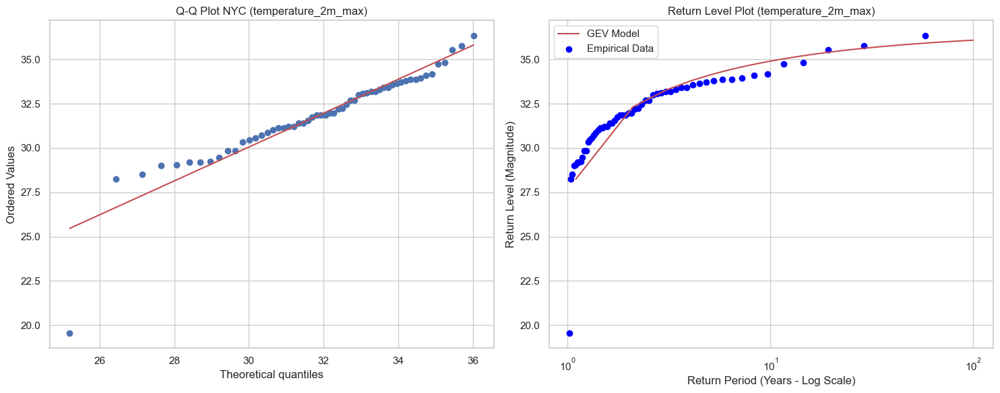

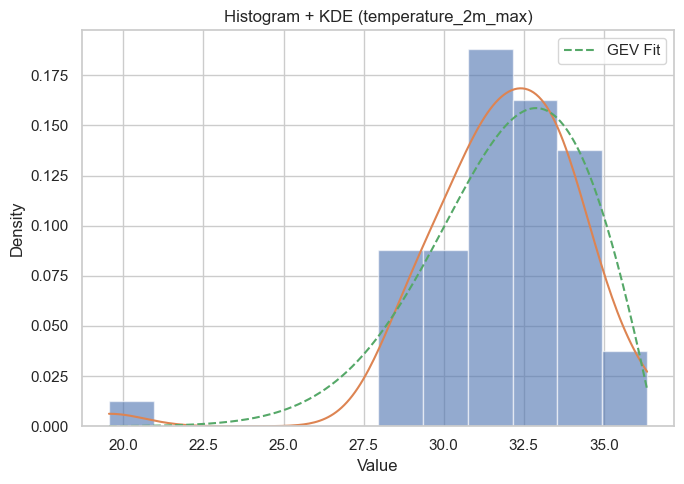

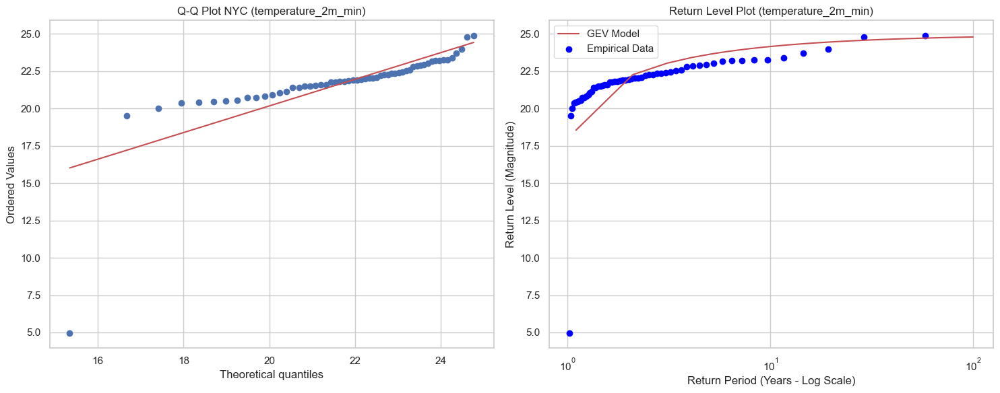

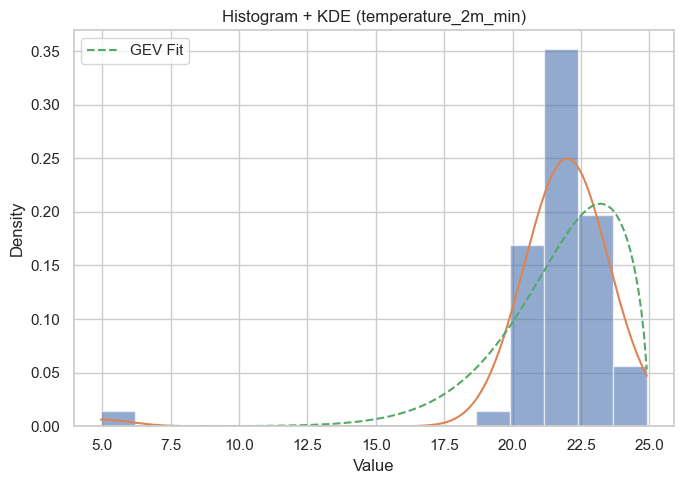

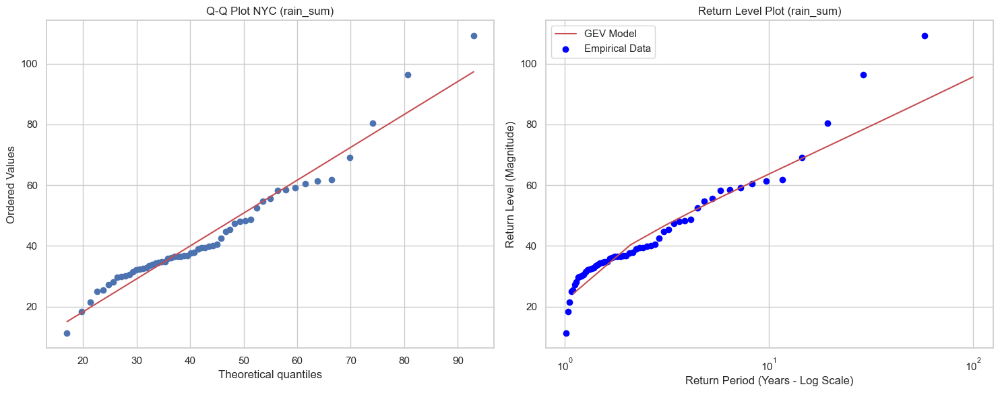

...

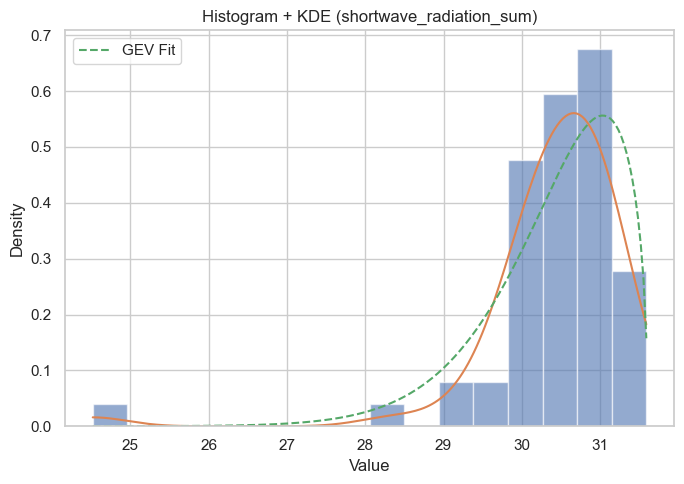

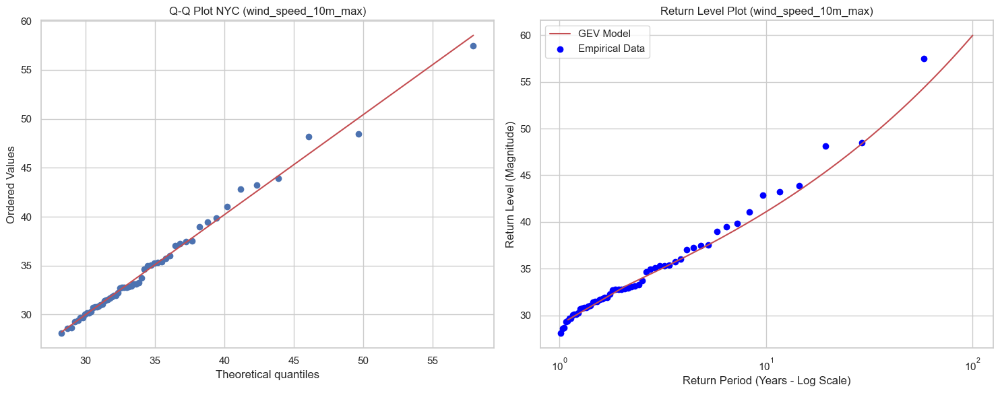

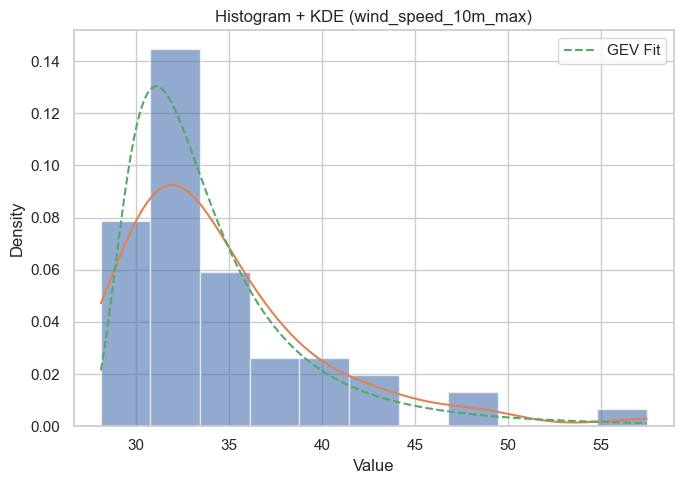

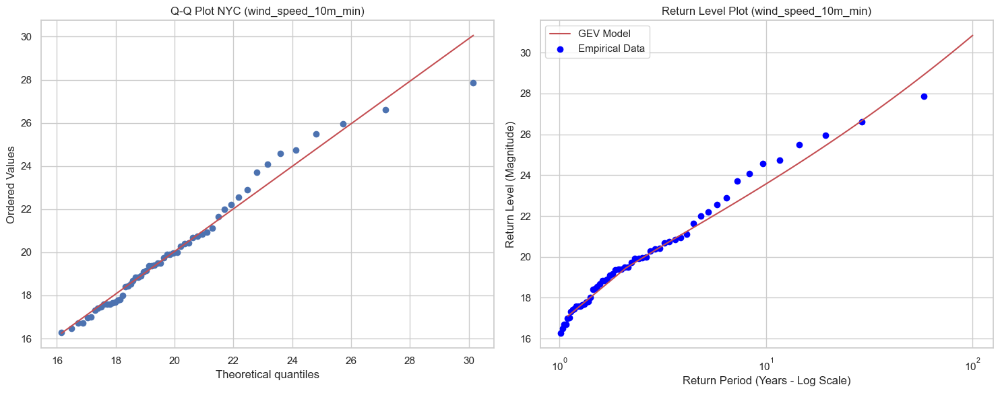

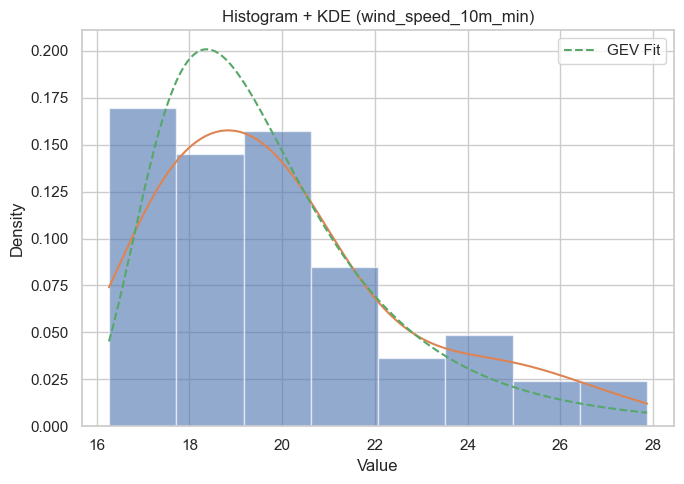

                        Variable  Shape_xi  Location_mu Scale_sigma  \
0             temperature_2m_max -0.510745    31.253485    2.724475   
1             temperature_2m_min -0.662419    21.366896    2.381782   
2                       rain_sum  0.028326    34.964348   12.343588   
3                   snowfall_sum -0.033186    13.671003    4.646426   
4               dew_point_2m_max -0.615838    23.143746    1.947783   
5               dew_point_2m_min -0.818582    19.390145    2.234021   
6               pressure_msl_max -0.215919  1041.264996    3.527985   
7               pressure_msl_min  -0.07829  1033.268614      3.2052   
8   soil_moisture_7_to_28cm_mean  0.134282     0.302001    0.010329   
9        shortwave_radiation_sum -0.698883    30.279301    0.926712   
10            wind_speed_10m_max   0.28892    31.793525    2.931856   
11            wind_speed_10m_min  0.148527    18.624966    1.850798   

   100yr_Return_Level  
0           36.078818  
1            24.79172  
2   

In [12]:
from scipy import stats

# Optional: store figures if needed
figures = {}

for col in numeric_cols:
    annual_max = df_gev[col].resample('YE').max().dropna()
    
    if len(annual_max) < 5:
        print(f"Skipping {col}: Only {len(annual_max)} years of data found.")
        continue

    try:
        # Fit GEV
        c, loc, scale = genextreme.fit(annual_max)

        # Return level
        return_lvl = genextreme.ppf(1 - 1/T, c, loc, scale)

        gev_results[col] = {
            'Variable': col,
            'Shape_xi': -c,
            'Location_mu': loc,
            'Scale_sigma': scale,
            '100yr_Return_Level': return_lvl
        }

        # -----------------------------
        # Diagnostic Plots PER VARIABLE
        # -----------------------------
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # --- Q-Q Plot ---
        stats.probplot(
            annual_max,
            dist=genextreme,
            sparams=(c, loc, scale),
            plot=ax1
        )
        ax1.set_title(f"Q-Q Plot NYC ({col})")

        # --- Return Level Plot ---
        periods = np.linspace(1.1, 100, 100)
        levels = genextreme.ppf(1 - 1/periods, c, loc, scale)

        ax2.semilogx(periods, levels, 'r-', label='GEV Model')

        # Empirical return levels
        sorted_data = np.sort(annual_max)
        n = len(sorted_data)
        empirical_periods = [(n + 1) / (n - i + 1) for i in range(1, n + 1)]

        ax2.scatter(empirical_periods, sorted_data, color='blue', label='Empirical Data')

        ax2.set_xlabel("Return Period (Years - Log Scale)")
        ax2.set_ylabel("Return Level (Magnitude)")
        ax2.set_title(f"Return Level Plot ({col})")
        ax2.legend()

        plt.tight_layout()
        plt.show()

        # Optional: store figure
        figures[col] = fig

        # --- Histogram + KDE Plot ---
        fig, ax = plt.subplots(figsize=(7, 5))

        # Histogram (density normalized)
        ax.hist(annual_max, bins='auto', density=True, alpha=0.6)

        # KDE using scipy
        kde = stats.gaussian_kde(annual_max)
        x_vals = np.linspace(annual_max.min(), annual_max.max(), 200)
        ax.plot(x_vals, kde(x_vals))

        # Optional: overlay fitted GEV PDF
        gev_pdf = genextreme.pdf(x_vals, c, loc, scale)
        ax.plot(x_vals, gev_pdf, linestyle='--', label='GEV Fit')

        ax.set_title(f"Histogram + KDE ({col})")
        ax.set_xlabel("Value")
        ax.set_ylabel("Density")
        ax.legend()

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fitting {col}: {e}")

# Final results
results_df = pd.DataFrame(gev_results).T.reset_index(drop=True)
print(results_df)

**Summary Table of the GEV parameters for All Variables**

| Variable                     | Shape_xi (ξ) | Location_mu (μ) | Scale_sigma (σ) | 100yr_Return_Level |
| ---------------------------- | ------------ | --------------- | --------------- | ------------------ |
| temperature_2m_max           | -0.510745    | 31.253485       | 2.724475        | 36.078818          |
| temperature_2m_min           | -0.662419    | 21.366896       | 2.381782        | 24.791720          |
| rain_sum                     | 0.028326     | 34.964348       | 12.343588       | 95.612270          |
| snowfall_sum                 | -0.033186    | 13.671003       | 4.646426        | 33.493721          |
| dew_point_2m_max             | -0.615838    | 23.143746       | 1.947783        | 26.120465          |
| dew_point_2m_min             | -0.818582    | 19.390145       | 2.234021        | 22.056090          |
| pressure_msl_max             | -0.215919    | 1041.264996     | 3.527985        | 1051.552804        |
| pressure_msl_min             | -0.078290    | 1033.268614     | 3.205200        | 1045.649926        |
| soil_moisture_7_to_28cm_mean | 0.134282     | 0.302001        | 0.010329        | 0.367742           |
| shortwave_radiation_sum      | -0.698883    | 30.279301       | 0.926712        | 31.552042          |
| wind_speed_10m_max           | 0.288920     | 31.793525       | 2.931856        | 59.979092          |
| wind_speed_10m_min           | 0.148527     | 18.624966       | 1.850798        | 30.840446          |


**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America.

### Probability of Any of these Variables Exceeding a Specific Threshold (e.g., the chance of rain hitting 100mm in a given year)

Using the Generalized Extreme Value (GEV) parameters you provided, we can calculate the Annual Exceedance Probability (AEP)—the likelihood that a specific value will be met or exceeded in any given year.

**Calculating the Custom Threshold:**

If there's a specific value ($x$) to check, then to apply the GEV formula for exceedance:

$$P(X > x) = 1 - \exp\left( - \left[ 1 + \xi \left( \frac{x - \mu}{\sigma} \right) \right]^{-1/\xi} \right)$$

**Case example, plugging in the "Rain" Numbers:**

Applying the rain variable from the results outpute:

   $\mu = 34.964348$ (the "centre" of the extreme values)
   
   $\sigma = 12.343588$ (the "spread" or volatility)
   
   $\xi = 0.028326$ (the "heaviness" of the tale)
   
   Target $x = 100$ (the threshold you want to check)

Now it's just simple plugging in values into the above **custom threshold model**, and get the probability output of exceeding the threshold.

**Step-by-Step Arithmetic**

1. Step 1: Calculate the distance from the location parameter to your threshold.

$$x - \mu = 100 - 34.964348 = 65.035652$$

2. Step 2: Normalize the distance by the scale (spread).

$$\frac{x - \mu}{\sigma} = \frac{65.035652}{12.343588} \approx 5.268780$$

3. Step 3: Factor in the shape (tail heaviness).

$$\xi \times \left( \text{Step 2 result} \right) = 0.028326 \times 5.268780 \approx 0.149243$$

4. Step 4: Calculate the base for the exponentiation.

$$1 + 0.149243 = 1.149243$$

5. Step 5: Determine the exponent (negative reciprocal of shape).

$$-1 / \xi = -1 / 0.028326 \approx -35.303255$$

6. Step 6: Raise the base (Step 4) to the power of the exponent (Step 5).

$$(1.149243)^{-35.303255} \approx 0.007366$$

7. Step 7: Calculate the final probability using the exponential function.

$$P(X > 100) = 1 - \exp(-0.007366)$$

Using $\exp(-0.007366) \approx 0.992661$:

$$1 - 0.992661 = 0.007339$$


**Summary Table (AEP at x = 100)**


| Variable                     | μ        | σ      | ξ       | Threshold (x) | AEP (P(X > 100)) | Interpretation                      |
| ---------------------------- | -------- | ------ | ------- | ------------- | ---------------- | ----------------------------------- |
| temperature_2m_max           | 31.253   | 2.724  | -0.5107 | 100           | ~0.0000          | Impossible (bounded upper tail)     |
| temperature_2m_min           | 21.367   | 2.382  | -0.6624 | 100           | ~0.0000          | Impossible (bounded upper tail)     |
| rain_sum                     | 34.964   | 12.344 | 0.0283  | 100           | 0.0073           | Rare (~137-year event)              |
| snowfall_sum                 | 13.671   | 4.646  | -0.0332 | 100           | ~0.0000          | Extremely unlikely                  |
| dew_point_2m_max             | 23.144   | 1.948  | -0.6158 | 100           | ~0.0000          | Impossible                          |
| dew_point_2m_min             | 19.390   | 2.234  | -0.8186 | 100           | ~0.0000          | Impossible                          |
| pressure_msl_max             | 1041.265 | 3.528  | -0.2159 | 100           | ~1.0000          | Always exceeded                     |
| pressure_msl_min             | 1033.269 | 3.205  | -0.0783 | 100           | ~1.0000          | Always exceeded                     |
| soil_moisture_7_to_28cm_mean | 0.302    | 0.0103 | 0.1343  | 100           | ~0.0000          | Impossible                          |
| shortwave_radiation_sum      | 30.279   | 0.927  | -0.6989 | 100           | ~0.0000          | Impossible                          |
| wind_speed_10m_max           | 31.794   | 2.932  | 0.2889  | 100           | ~0.0000          | Extremely rare (heavy tail but far) |
| wind_speed_10m_min           | 18.625   | 1.851  | 0.1485  | 100           | ~0.0000          | Extremely rare                      |

**NOTE:** the above table is for personal verification. 

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America.


### Understanding the Acquisition of the $N-$ Year Return Level:

To understand how the 100-year Return Level ($95.612270\text{ mm}$ for rain) arises, the Quantile Function of the GEV distribution is applied. This is essentially the "reverse" of the probability formula exhibited earlier.

Instead of asking "What is the probability of $100\text{ mm}$?", we ask "What value has only a $1\%$ chance of being exceeded?"

**The Math Behind the "100-Year" Value**

The formula for the Return Level ($z_p$) for a given probability ($p$) is:

$$z_p = \mu + \frac{\sigma}{\xi} \left[ \left( -\ln(1-p) \right)^{-\xi} - 1 \right]$$

For a 100-year event, the probability $p$ is $0.01$ (or $1/100$). Plugging in the numbers for the rain variable row.


## Seasonal Analysis of Weather Extremes Based on Quantiles (1970 - April 8 2026) 

This new endeavour aims to investigate how weather extremes have evolved over a 56-year period by analysing daily weather observations aggregated into meteorological seasons. Using quantile-based thresholds, the study identifies extreme events—such as unusually high temperatures, heavy rainfall, and strong winds—and evaluates their frequency, intensity, and distribution across Winter, Spring, Summer, and Fall.

The key tasks include defining seasonal structures, constructing extreme event indicators using upper and lower quantiles, and aggregating these events by season and year. Analytical methods focus on detecting long-term trends, shifts in distributions, and changes in the frequency and persistence of extremes. Visualizations such as time series plots, heatmaps, and distribution comparisons are used to highlight seasonal patterns and climate signals.

Overall, this endeavour seeks to provide a clear, data-driven understanding of how seasonal weather extremes have changed over time, offering insights into variability, trends, and potential impacts of climate change.

**Meteorological Season Definition (Burlington Vermont)**

Meteorological seasons are fixed 3-month blocks commonly used in climatology to ensure consistency in seasonal comparisons (NOAA NCEI, n.d.):

Winter: December (12), January (1), February (2)

Spring: March (3), April (4), May (5)

Summer: June (6), July (7), August (8)

Fall (Autumn): September (9), October (10), November (11)

Seasonal periods will be identified by the months. Will extract both month and year attributes out of the datetime format to label seasons and for the ability to develop time series. 

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America.

In [13]:
# Meteorological seasons definition
data_for_extreme_vars = daily_dataframe.copy()

data_for_extreme_vars['year'] = data_for_extreme_vars['date'].dt.year
data_for_extreme_vars['month'] = data_for_extreme_vars['date'].dt.month
data_for_extreme_vars['month'] = data_for_extreme_vars['date'].dt.month

def get_meteorological_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

data_for_extreme_vars['season'] = data_for_extreme_vars['month'].apply(get_meteorological_season)

data_for_extreme_vars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   date                          20552 non-null  datetime64[ns, UTC]
 1   temperature_2m_max            20552 non-null  float32            
 2   temperature_2m_min            20552 non-null  float32            
 3   rain_sum                      20552 non-null  float32            
 4   snowfall_sum                  20552 non-null  float32            
 5   dew_point_2m_max              20552 non-null  float32            
 6   dew_point_2m_min              20552 non-null  float32            
 7   pressure_msl_max              20552 non-null  float32            
 8   pressure_msl_min              20552 non-null  float32            
 9   soil_moisture_7_to_28cm_mean  20552 non-null  float32            
 10  shortwave_radiation_sum       2055

### Defining Extremes via Quantiles

Systematic interuptions stemming from weather activity generally concerns measures or events that exceed a particular threshold for disruptions to occur within a specified time frame. Transportation and infrastructure both have limits in function with respect to weather activity. Accumulation or magnitude type dynamics in weather are generally physical or spatial in nature. Hence, disruptions or hindrances in the ambiance are inevitable. 

In weather analysis, using quantiles, **specifically the 95th and 5th percentiles**, is a decent way to define "extreme" events relative to a specific location's typical climate. Instead of using a fixed number (like "35°C is hot"), to apply the data to tell you what "hot" means for that specific area.


**Fixed Threshold Issues --** Thresholds for extremes are not fixed. A contrary stance yeilds the following issues:

1. Non-stationarity, or the realistic setting

         Climate / seasonal effects → wind distributions shift over time

         A fixed 60 Km/h may:

               be too low in storm seasons (too many exceedances)

               too high in calm periods (too few exceedances)

2. Bias in tail estimation consequence from 1

         Too many points: violates asymptotic GPD assumption

         Too few: unstable/unreliable parameter estimates

3. Not transferable

       Different locations / variables have different scales. A fixed value is generally not a model. An example, different units and scales for speed: m/s, Km/h, mph, knots, etc. There's similar issue for precipitation accumulation.


**Quantile-Based Threshold (Static) --** Attributes of quantile-based thresholds:

1. Always uses top 5% extremes

2. Ensures enough data for fitting regardless of the nature of respectivr season. 

4. Standard in EVT literature


**Rolling Threshold (Adaptive) --** When practical:

1. Strong seasonality (e.g., hurricanes vs dry season). In a temperate climate (which NYC resides in) temperature and preciptation behaviours often overlap, say, winter $\rightarrow$ spring $\rightarrow$  summer $\rightarrow$ autumn $\rightarrow$ winter. In tropical climates, hurricane seasons are significant from calm periods, and dry seasons are significant from wet seasons; ecological activity, agricultural activity and property damage are strong evidence. 

2. Non-stationary climate trends. Non-stationary climate trends refer to shifts in climate data—such as temperature and rainfall—where statistical properties like mean, variance, and frequency change over time, rendering traditional historical averages obsolete. Driven by climate change, this phenomenon makes extreme events harder to predict and necessitates new modeling techniques for environmental planning. Time-varying parameters and moving window analysis, are necessary for accurately assessing climate risks or climate regimes. 

3. High-frequency data (hourly wind, rainfall). Rolling schemes act like a "filter" or "smoother" for moisy hourly or electromagnetic sensing data.

To identify unusual or "extreme" observations for a respective month throughout each year for the entire considered time span. Creating extreme indicator attributes:

In [14]:
# Define a dictionary of columns and their respective quantile directions
# (1 = high is extreme, 0 = low is extreme)
config = {
    'temperature_2m_max': (0.95, 'extreme_heat'),
    'temperature_2m_min': (0.05, 'extreme_cold'),
    'rain_sum': (0.95, 'extreme_rain'),
    'snowfall_sum': (0.95, 'extreme_snow'),
    'dew_point_2m_max': (0.95, 'extreme_high_dew_point'),
    'dew_point_2m_min': (0.05, 'extreme_low_dew_point'),
    'pressure_msl_max': (0.95, 'extreme_high_press_msl'),
    'pressure_msl_min': (0.05, 'extreme_low_press_msl'),
    'soil_moisture_7_to_28cm_mean': (0.95, 'extreme_soil_moisture'),
    'shortwave_radiation_sum': (0.95, 'extreme_shortwave_radation'),
    'wind_speed_10m_max': (0.95, 'extreme_high_wind'),
    'wind_speed_10m_min': (0.05, 'extreme_low_wind'),
}

**Resolution for Zero-Inflated Variables (rain, snow, etc.)**

If a month for the variable in question is mostly zeros, the 95th percentile can be 0, which breaks your extreme definition.

In [15]:
for col, (q, name) in config.items():
    
    direction = 'high' if q > 0.5 else 'low'
    
    # Handle zero-inflated variables
    if col in ['rain_sum', 'snowfall_sum'] and direction == 'high':
        monthly_thresholds = (
            data_for_extreme_vars[data_for_extreme_vars[col] > 0]
            .groupby('month')[col]
            .quantile(q)
        )
    else:
        monthly_thresholds = (
            data_for_extreme_vars.groupby('month')[col]
            .quantile(q)
        )
    
    # Map thresholds
    thresh_col = f"{col}_threshold"
    data_for_extreme_vars[thresh_col] = data_for_extreme_vars['month'].map(monthly_thresholds)
    
    # Apply condition
    if direction == 'high':
        data_for_extreme_vars[name] = (
            data_for_extreme_vars[col] >= data_for_extreme_vars[thresh_col]
        )
    else:
        data_for_extreme_vars[name] = (
            data_for_extreme_vars[col] <= data_for_extreme_vars[thresh_col]
        )

In [16]:
data_for_extreme_vars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   temperature_2m_max                      20552 non-null  float32            
 2   temperature_2m_min                      20552 non-null  float32            
 3   rain_sum                                20552 non-null  float32            
 4   snowfall_sum                            20552 non-null  float32            
 5   dew_point_2m_max                        20552 non-null  float32            
 6   dew_point_2m_min                        20552 non-null  float32            
 7   pressure_msl_max                        20552 non-null  float32            
 8   pressure_msl_min                        20552 non-null  float32            


To now reorder the columns so that each variable is followed by its threshold column and then its extreme flag, in a clean structured layout.

In [17]:
# Core identifier columns (keep first)
base_cols = ['date', 'year', 'month', 'season']

ordered_cols = base_cols.copy()

for col, (q, name) in config.items():
    
    threshold_col = f"{col}_threshold"
    
    ordered_cols.extend([
        col,
        threshold_col,
        name
    ])

# Reindex dataframe
data_for_extreme_vars = data_for_extreme_vars[ordered_cols]

data_for_extreme_vars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   year                                    20552 non-null  int32              
 2   month                                   20552 non-null  int32              
 3   season                                  20552 non-null  object             
 4   temperature_2m_max                      20552 non-null  float32            
 5   temperature_2m_max_threshold            20552 non-null  float64            
 6   extreme_heat                            20552 non-null  bool               
 7   temperature_2m_min                      20552 non-null  float32            
 8   temperature_2m_min_threshold            20552 non-null  float64            


**Observation of the data:**

Threshold columns $\rightarrow$ float

1. This is the monthly quantile value (e.g. 95th percentile for that month)

2. Same value repeated for all rows in the same month.

Extreme flat coloumns $\rightarrow$ boolean

1. This is the comparison result with the original variable. Example: temperature_2m_max $\geq$ temperature_2m_max_threshold

2. TRUE $\rightarrow$ this day is extreme; FALSE $\rightarrow$ not extreme

| Original Variable            | Threshold Column                       | Extreme Flag               |
| ---------------------------- | -------------------------------------- | -------------------------- |
| temperature_2m_max           | temperature_2m_max_threshold           | extreme_heat               |
| temperature_2m_min           | temperature_2m_min_threshold           | extreme_cold               |
| rain_sum                     | rain_sum_threshold                     | extreme_rain               |
| snowfall_sum                 | snowfall_sum_threshold                 | extreme_snow               |
| dew_point_2m_max             | dew_point_2m_max_threshold             | extreme_high_dew_point     |
| dew_point_2m_min             | dew_point_2m_min_threshold             | extreme_low_dew_point      |
| pressure_msl_max             | pressure_msl_max_threshold             | extreme_high_press_msl     |
| pressure_msl_min             | pressure_msl_min_threshold             | extreme_low_press_msl      |
| soil_moisture_7_to_28cm_mean | soil_moisture_7_to_28cm_mean_threshold | extreme_soil_moisture      |
| shortwave_radiation_sum      | shortwave_radiation_sum_threshold      | extreme_shortwave_radation |
| wind_speed_10m_max           | wind_speed_10m_max_threshold           | extreme_high_wind          |
| wind_speed_10m_min           | wind_speed_10m_min_threshold           | extreme_low_wind           |


**Concrete Example (suppose for July):**

| date  | temp_max | threshold | extreme_heat |
| ----- | -------- | --------- | ------------ |
| Jul 1 | 31.2     | 30.5      | True         |
| Jul 2 | 29.8     | 30.5      | False        |
| Jul 3 | 32.1     | 30.5      | True         |


In [18]:
print(data_for_extreme_vars)

                           date  year  month  season  temperature_2m_max  \
0     1970-01-01 00:00:00+00:00  1970      1  Winter          -11.647500   
1     1970-01-02 00:00:00+00:00  1970      1  Winter          -10.097500   
2     1970-01-03 00:00:00+00:00  1970      1  Winter           -9.997499   
3     1970-01-04 00:00:00+00:00  1970      1  Winter          -14.097500   
4     1970-01-05 00:00:00+00:00  1970      1  Winter           -7.847500   
...                         ...   ...    ...     ...                 ...   
20547 2026-04-04 00:00:00+00:00  2026      4  Spring           11.050000   
20548 2026-04-05 00:00:00+00:00  2026      4  Spring            9.300000   
20549 2026-04-06 00:00:00+00:00  2026      4  Spring            4.050000   
20550 2026-04-07 00:00:00+00:00  2026      4  Spring            1.200000   
20551 2026-04-08 00:00:00+00:00  2026      4  Spring            4.850000   

       temperature_2m_max_threshold  extreme_heat  temperature_2m_min  \
0             

**Aggregating Extremes**

After already deciding what counts as "extreme", now to no longer look at the specific instances of a meteorological measure; focus will be looking for the checkmarks.

    Analogy: It’s like a teacher stoping to look at every grade and instead just counting how many times a student got an "A" or an "F."

In addition, to place the data into buckets based on the Year and the Season (Spring, Summer, Fall, Winter).

Adding up the extreme cases. Say, if in some season the extreme type has count is $X$, recognised is $X$ different cases that the season in question was hit by extreme type. This turns a messy list of thousands of instances into a simple table that tells you exactly where the "danger" is.

In essence, taking "noisy" data and turns it into a "High-Level Map" that allows for the observation for which seasons are the riskiest and how that risk is changing over time.

In [19]:
seasonal_extremes = (
    data_for_extreme_vars.groupby(['year', 'season'])
    .agg({
        # Counts of Extreme Events
        'extreme_heat': 'sum',
        'extreme_cold': 'sum',
        'extreme_rain': 'sum',
        'extreme_snow': 'sum',
        'extreme_high_dew_point': 'sum',
        'extreme_low_dew_point': 'sum',
        'extreme_high_press_msl': 'sum',
        'extreme_low_press_msl': 'sum',
        'extreme_soil_moisture': 'sum',
        'extreme_shortwave_radation': 'sum',
        'extreme_high_wind': 'sum',
        'extreme_low_wind': 'sum',
    })
    .reset_index()
)

### Seasonal Extreme Event Trends (Visual Perspective)

Purpose: Show long-term climate signal

1. Line plots of extreme counts

2. One line per season

3. Add 10-year rolling mean (a time series smoother). A 10-year rolling mean (also called a moving average) is a statistical "filter" used to dampen short-term noise and reveal the long-term direction of a dataset. In climate science, it is the standard way to separate a "freak weather year" from a "changing climate trend."

     For example, imagine your "Extreme Heat" data for a single year is a jagged mountain peak. One year is record-breakingly hot, the next is unusually cool. This "noise" makes it hard to see if the world is actually warming.

     A 10-year rolling mean takes a "window" of 10 years, averages them into a single point, and then slides that window forward by one year. This blurs the individual spikes and sharpens the underlying trend.

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid", context="talk")


extreme_cols = [
        'extreme_heat',
        'extreme_cold',
        'extreme_rain',
        'extreme_snow',
        'extreme_high_dew_point',
        'extreme_low_dew_point',
        'extreme_high_press_msl',
        'extreme_low_press_msl',
        'extreme_soil_moisture',
        'extreme_shortwave_radation',
        'extreme_high_wind',
        'extreme_low_wind'
]

# Optional: cleaner titles
pretty_names = {col: col.replace('_', ' ').title() for col in extreme_cols}

Seasonal Aggregation (generic):

In [21]:
seasonal_extremes_all = (
    seasonal_extremes.groupby(['year', 'season'])[extreme_cols]
    .sum()
    .reset_index()
)

Generating the plots:

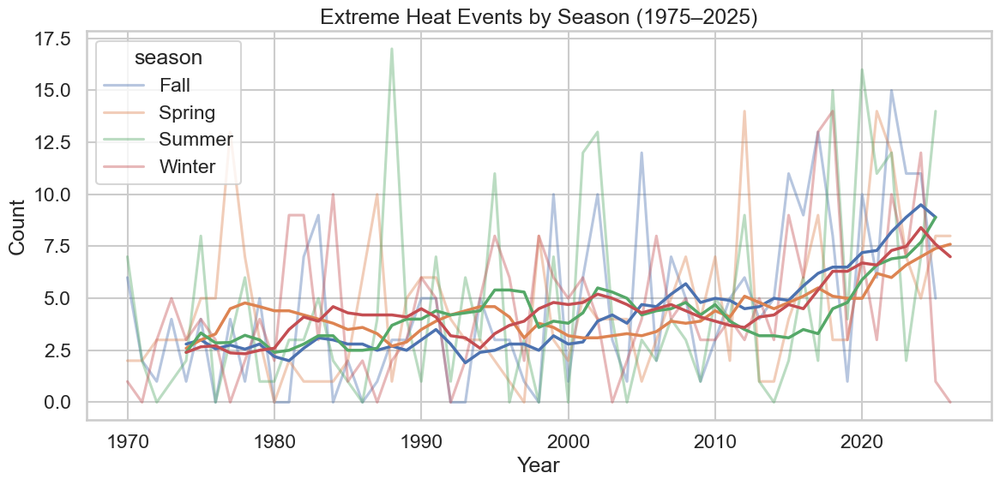

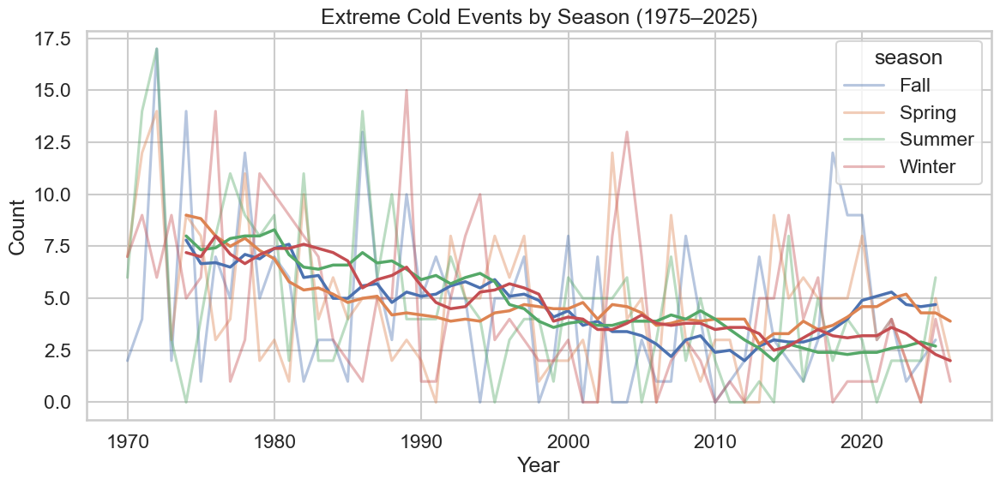

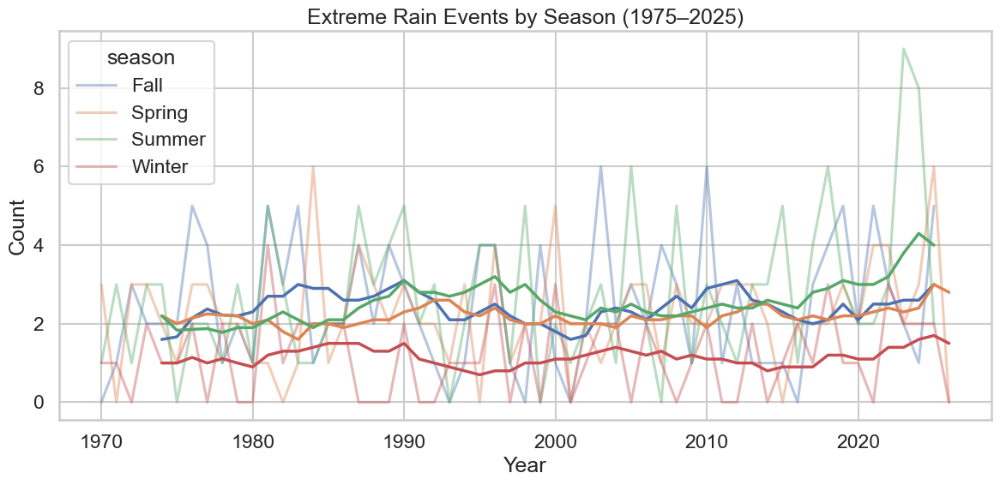

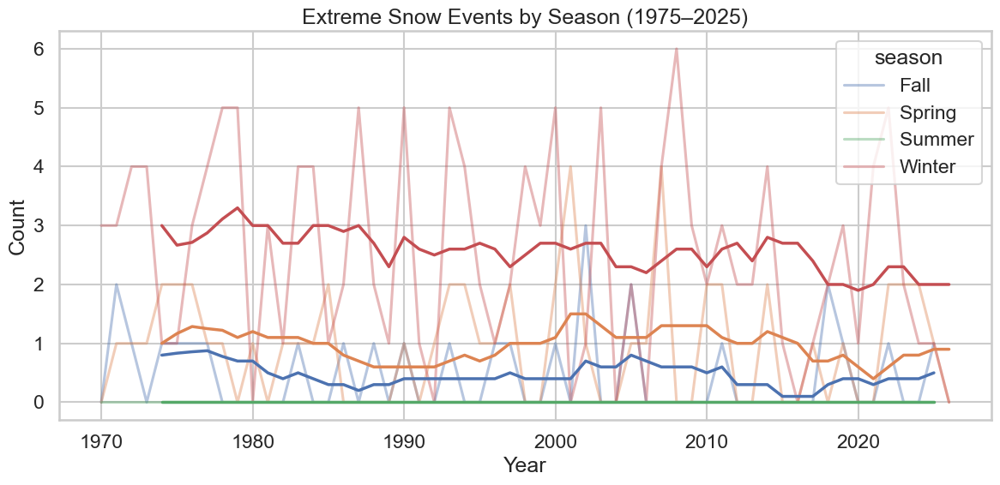

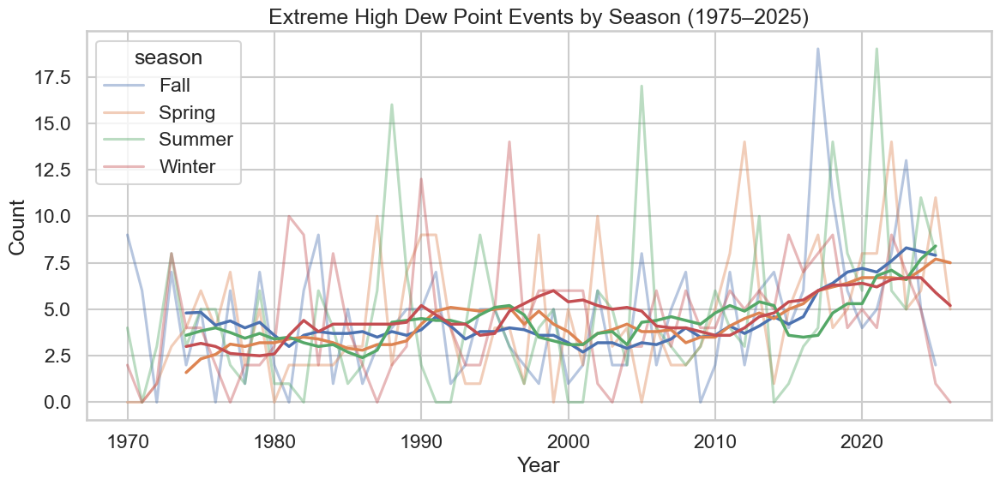

...

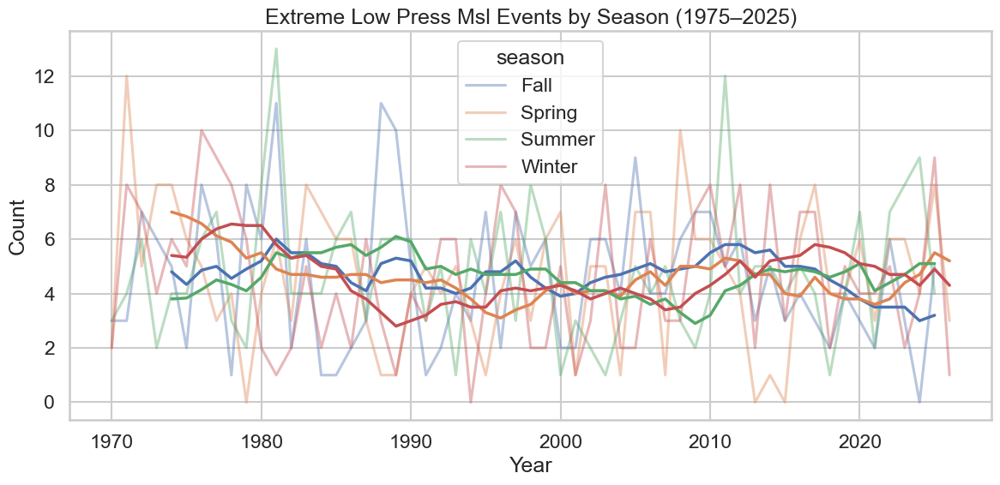

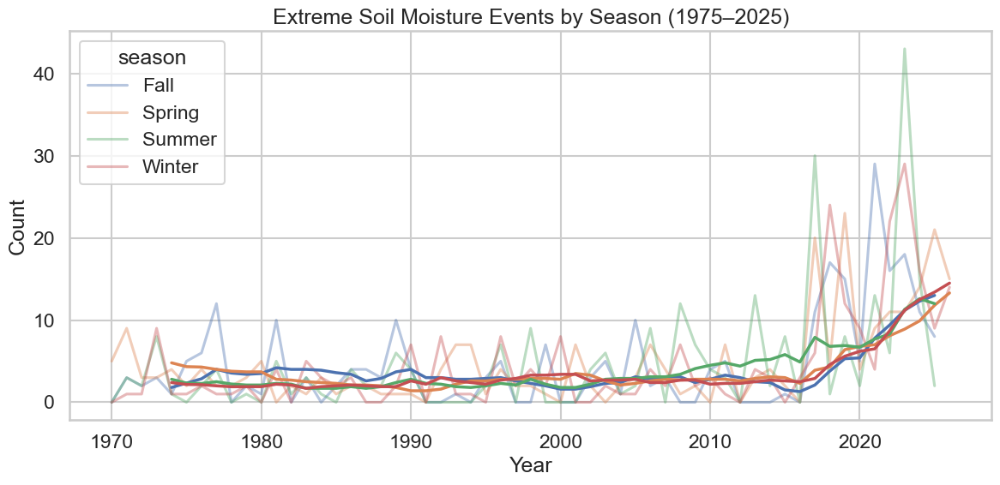

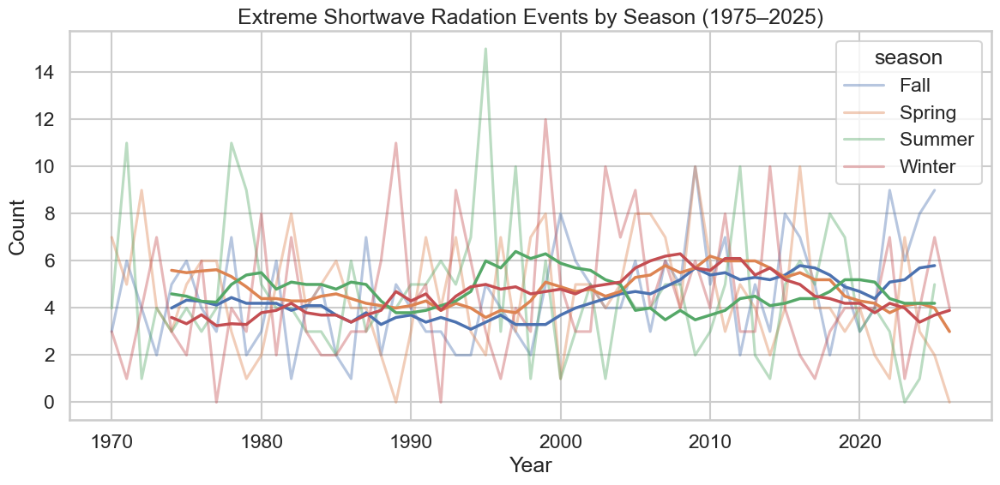

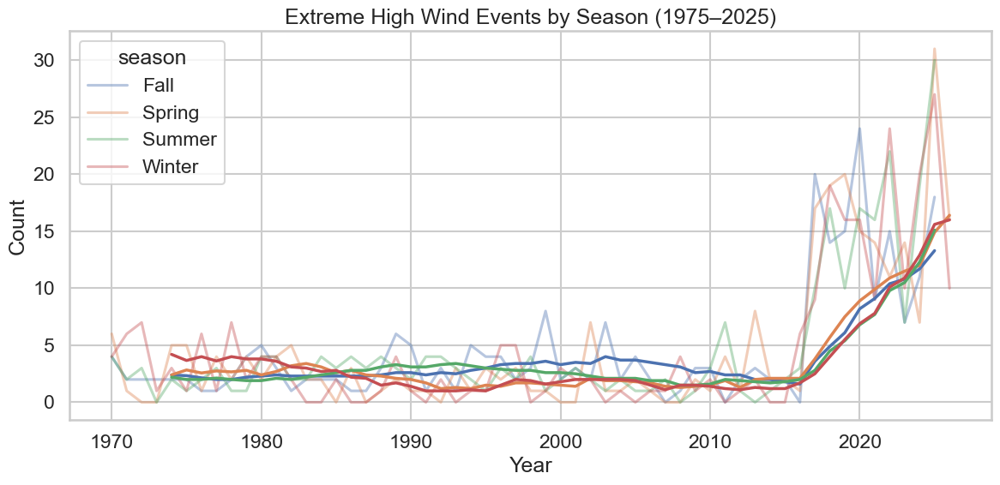

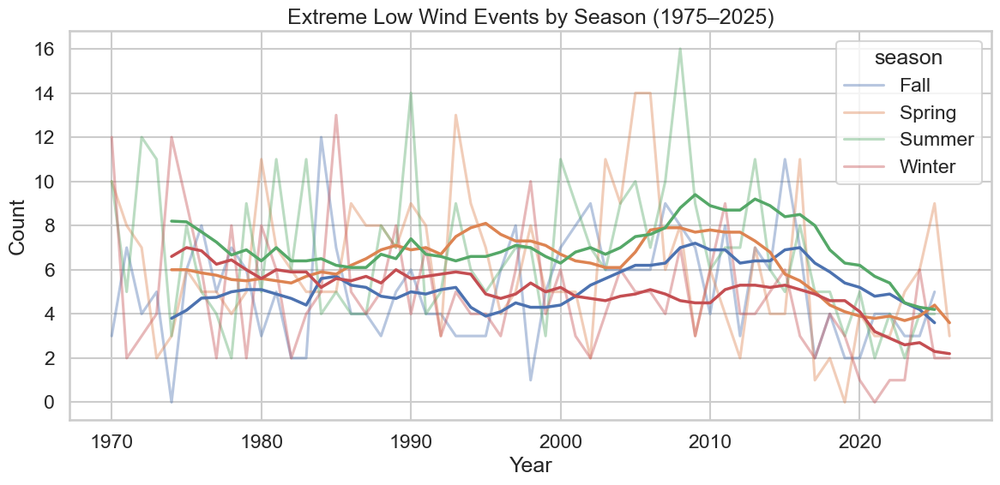

In [22]:
for col in extreme_cols:
    fig, ax = plt.subplots(figsize=(12,6))
    
    sns.lineplot(data=seasonal_extremes_all,
                 x='year',
                 y=col,
                 hue='season',
                 alpha=0.4,
                 ax=ax)
    
    # Rolling mean
    seasonal_extremes_all[f'{col}_roll'] = (
        seasonal_extremes_all.groupby('season')[col]
        .transform(lambda x: x.rolling(10, min_periods=5).mean())
    )
    
    sns.lineplot(data=seasonal_extremes_all,
                 x='year',
                 y=f'{col}_roll',
                 hue='season',
                 linewidth=2.5,
                 legend=False,
                 ax=ax)
    
    ax.set_title(f"{pretty_names[col]} Events by Season (1975–2025)")
    ax.set_ylabel("Count")
    ax.set_xlabel("Year")
    
    plt.tight_layout()
    plt.show()

### Trend Analysis - Climate Signal (Regression)

To now determine whether the frequency or intensity of a specific extreme is moving up or down relative to the chronological sequence of years.

For example:

Is extreme heat increasing in summers?

Are cold extremes disappearing in winters?

**Applying a Simple Linear Regression (Ordinary Least Squares) to identify how weather extremes change over time:**

For a extreme type (e.g., extreme_heat), using the assumption of a linear relationship between time ($x$) and the occurrence of the extreme event ($y$):

$$y_i = \beta_0 + \beta_1 x_i + \epsilon_i$$

Where:

$y_i$: The value of the extreme column for a specific year/season.

$x_i$: The time index (represented in the code by range(len(y))).

$\beta_0$: The intercept (the value of $y$ when time is 0).

$\beta_1$: The slope (the rate of change over time).

$\epsilon_i$: The error term (residuals).

The function (to be developed) **trend_test** extracts two primary mathematical values:

The Slope ($\beta_1$) - calculated by minimizing the sum of squared residuals:

$$\hat{\beta}_1 = \frac{\sum (x_i - \bar{x})(y_i - \bar{y})}{\sum (x_i - \bar{x})^2}$$

Interpretation: If $\beta_1 > 0$, the extreme event is increasing over time. If $\beta_1 < 0$, it is decreasing.

The p-value ($p$) - for testing the null hypothesis ($H_0: \beta_1 = 0$), which assumes there is no trend. 

Significance: If $p < 0.05$, the code labels the trend as "SIGNIFICANT," meaning there is a statistically detectable change over time that is unlikely to have occurred by chance.

In [23]:
import statsmodels.api as sm
import pandas as pd

# 1. Define trend test

def trend_test(series):
    y = series.values
    # Ensure we have enough data and variation to avoid NaNs;
    # Checking if there is any change in the data. No interest in single or zero unique cases
    if len(y) < 2 or series.nunique() <= 1:
        return 0.0, float('nan')
    
    X = sm.add_constant(range(len(y)))
    model = sm.OLS(y, X).fit()
    return model.params[1], model.pvalues[1]

# 2. Nested Loop with clear labeling
for col in extreme_cols:
    print(f"\n--- ANALYZING TREND: {col.replace('_', ' ').upper()} ---")
    
    for season in seasonal_extremes['season'].unique():
        subset = seasonal_extremes[seasonal_extremes['season'] == season]
        
        # We sort by year to ensure the X-axis (time) is chronological
        subset = subset.sort_values('year')
        
        slope, pval = trend_test(subset[col])
        
        # Formatting the output for readability
        status = "SIGNIFICANT" if pval < 0.05 else "not sig."
        if pd.isna(pval):
            print(f"{season:10}: No variation (Constant data)")
        else:
            print(f"{season:10}: Slope = {slope:6.3f} | p = {pval:6.3f} ({status})")


--- ANALYZING TREND: EXTREME HEAT ---
Fall      : Slope =  0.126 | p =  0.000 (SIGNIFICANT)
Spring    : Slope =  0.069 | p =  0.010 (SIGNIFICANT)
Summer    : Slope =  0.092 | p =  0.013 (SIGNIFICANT)
Winter    : Slope =  0.066 | p =  0.013 (SIGNIFICANT)

--- ANALYZING TREND: EXTREME COLD ---
Fall      : Slope = -0.060 | p =  0.062 (not sig.)
Spring    : Slope = -0.062 | p =  0.020 (SIGNIFICANT)
Summer    : Slope = -0.117 | p =  0.000 (SIGNIFICANT)
Winter    : Slope = -0.104 | p =  0.000 (SIGNIFICANT)

--- ANALYZING TREND: EXTREME RAIN ---
Fall      : Slope =  0.009 | p =  0.492 (not sig.)
Spring    : Slope =  0.011 | p =  0.316 (not sig.)
Summer    : Slope =  0.035 | p =  0.024 (SIGNIFICANT)
Winter    : Slope =  0.004 | p =  0.629 (not sig.)

--- ANALYZING TREND: EXTREME SNOW ---
Fall      : Slope = -0.004 | p =  0.498 (not sig.)
Spring    : Slope = -0.001 | p =  0.903 (not sig.)
Summer    : No variation (Constant data)
Winter    : Slope = -0.021 | p =  0.135 (not sig.)

--- ANALYZING

The data suggests a clear and consistent shift toward more energetic and moisture-heavy atmospheric conditions across nearly all seasons.

**The "Warming & Moistening" Signal**

The most robust trends appear in Extreme Heat, Extreme High Dew Point, and Extreme Soil Moisture.

1. Extreme Heat: Showing significant positive slopes in every single season. Fall is seeing the fastest rate of increase ($Slope = 0.126$).

2. Extreme Soil Moisture: This is perhaps your most dramatic result. With slopes ranging from $0.144$ to $0.194$ and $p = 0.000$ in multiple seasons, the environment is becoming significantly "wetter" in terms of ground saturation year-round.

3. Dew Points: High dew points are rising significantly in Spring, Summer, and Fall, which tracks with the heat data—warmer air holding more water vapor.

**The Decline of "Extreme Cold"**

The data shows a "narrowing" of the temperature floor.

1. Extreme Cold is significantly decreasing ($Negative\ Slope$) in Spring, Summer, and Winter.

2. Interestingly, Extreme Low Dew Points are also trending downward (becoming less frequent or less extreme) in Summer and Winter. This suggests that even our "dry/cold" spells are becoming less intense or shorter in duration.

**Wind & Dynamic Energy**

1. Extreme High Wind: This is a "clean sweep" across all seasons with very high significance ($p = 0.000$). This suggests a potential increase in atmospheric instability or a shift in pressure gradient force that is driving higher peak wind events throughout the year.

2. Extreme Low Wind: Only shows a significant decrease in Winter, suggesting that Winter is becoming "noisier" or more turbulent.

**Stability in Pressure and Snow**

1. Pressure (MSL): For the most part, extreme pressure events (High/Low) are stable, with the exception of a significant increase in Extreme High Pressure during the Spring.

2. Extreme Snow/Rain: While Summer is seeing a significant increase in Extreme Rain ($Slope = 0.035$), the other seasons haven't yet reached statistical significance for precipitation extremes. Snow trends are currently flat or "not significant," likely due to the high interannual variability inherent in frozen precipitation.

| Category | Fall | Spring | Summer | Winter |
|----------|------|--------|--------|--------|
| Heat| 📈 Increasing | 📈 Increasing | 📈 Increasing | 📈 Increasing |
| Cold | No Conclusion | 📉 Decreasing  | 📉 Decreasing | 📉 Decreasing |
| High Wind | 📈 Increasing | 📈 Increasing | 📈 Increasing | 📈 Increasing |
| Soil Moisture | 📈 Increasing | 📈 Increasing | 📈 Increasing | 📈 Increasing |

The combination of rising heat, higher dew points, and increased soil moisture suggests a transition toward a more "tropical" or high-energy humid regime for your study area.

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America. 

### Trend Analysis - Climate Signal (Mann-Kendall Trend Test)

To now apply the **Mann-Kendall Trend Test**, which is a non-parametric method. Unlike the previous OLS regression, this does not assume the data follows a normal distribution or a strictly linear path; it focuses on whether the data is monotonically increasing or decreasing (Mann, 1945; Kendall, 1975).

**The Test Statistic ($S$):**

The core of the math is the sign of the difference between all possible pairs of data points ($y_i, y_j$) over time:

$$S = \sum_{i=1}^{n-1} \sum_{j=i+1}^{n} \text{sgn}(y_j - y_i)$$

Where:
   
   $n$ is the number of data points (years).

   $\text{sgn}(\theta)$ is $1$ if the value increases, $-1$ if it decreases, and $0$ if it stays the same.

   Result: A large positive $S$ indicates an increasing trend; a large negative $S$ indicates a decreasing trend.

**Variance and Significance:**

To determine if the trend is "SIGNIFICANT," the code calculates the variance of $S$, denoted as $V(S)$, and converts it into a Z-score:

$$Z = \begin{cases} 
\frac{S-1}{\sqrt{V(S)}} & \text{if } S > 0 \\ 
0 & \text{if } S = 0 \\ 
\frac{S+1}{\sqrt{V(S)}} & \text{if } S < 0 
\end{cases}$$

   p-value ($p$): The probability derived from this Z-score. If $p < 0.05$, the trend is unlikely to be a result of random chance.

   The Slope: Usually calculated as Theil-Sen's Slope, which is the median of all slopes between all paired data points.

**Comparison to Previous OLS:**

| Feature | OLS (Linear Regression) | Mann-Kendall (This Code) |
|---------|-------------------------|--------------------------|
| Data Type | Sensitive to outliers | Robust to outliers |
| Trend Shape | Must be a straight line | Any consistent upward/downward "drift" |
| Requirements | Assumes normal distribution | Non-parametric (no distribution assumed) |

The Mann-Kendall method is more robust for environmental and weather data because it isn't easily skewed by one or two "freak" weather years; it looks for the overall direction of the movement.

In [24]:
import pymannkendall as mk

def mk_trend_analysis(series):
    # Standard safety checks
    if series.nunique() <= 1 or len(series) < 3:
        return ("no trend", np.nan, 0.0)
    
    try:
        res = mk.original_test(series)
        # We wrap this in a tuple explicitly to be safe
        return (str(res.trend), float(res.p), float(res.slope))
    except:
        return ("error", np.nan, 0.0)

# --- THE LOOP ---
for col in extreme_cols:
    print(f"\n{'-'*60}\n METRIC: {col.upper()}\n{'-'*60}")
    
    for season in seasonal_extremes['season'].unique():
        subset = seasonal_extremes[seasonal_extremes['season'] == season].sort_values('year')
        
        # 1. Capture the result as a SINGLE object first
        result = mk_trend_analysis(subset[col])
        
        # 2. Check the length to debug if it fails again
        if len(result) != 3:
            print(f"{season:10} | DEBUG ERROR: Function returned {len(result)} items instead of 3")
            continue
            
        # 3. Manually assign them
        trend_type, pval, slope = result
        
        if np.isnan(pval):
            print(f"{season:10} | [No Variation/Insufficient Data]")
        else:
            sig = "SIGNIFICANT" if pval < 0.05 else "not sig."
            print(f"{season:10} | {trend_type.capitalize():11} | Slope: {slope:6.3f} | p: {pval:6.3f} ({sig})")


------------------------------------------------------------
 METRIC: EXTREME_HEAT
------------------------------------------------------------
Fall       | Increasing  | Slope:  0.112 | p:  0.000 (SIGNIFICANT)
Spring     | Increasing  | Slope:  0.059 | p:  0.008 (SIGNIFICANT)
Summer     | Increasing  | Slope:  0.067 | p:  0.028 (SIGNIFICANT)
Winter     | Increasing  | Slope:  0.055 | p:  0.022 (SIGNIFICANT)

------------------------------------------------------------
 METRIC: EXTREME_COLD
------------------------------------------------------------
Fall       | No trend    | Slope: -0.037 | p:  0.151 (not sig.)
Spring     | No trend    | Slope: -0.048 | p:  0.057 (not sig.)
Summer     | Decreasing  | Slope: -0.096 | p:  0.001 (SIGNIFICANT)
Winter     | Decreasing  | Slope: -0.096 | p:  0.000 (SIGNIFICANT)

------------------------------------------------------------
 METRIC: EXTREME_RAIN
------------------------------------------------------------
Fall       | No trend    | Slope:  

Such results provide a slightly more nuanced picture than the OLS based tren model, with some key differences in the significance of precipitation and wind variables. The Extreme Heat and Soil Moisture signals remain the strongest seasonal markers.

**Robust Heat & Moisture Drivers**

1. The Extreme Heat trend is arguably your most reliable finding, remaining significant across all four seasons.Extreme Heat: Fall continues to see the steepest increase ($Slope: 0.112$).

2. Soil Moisture: While Fall has dropped to "not sig," the trends for Spring, Summer, and Winter remain strong. The Winter slope ($0.095, p = 0.000$) suggests a very consistent increase in cold-season ground saturation.

3. High Dew Point: Interestingly, Fall dew point extremes are no longer significant, but Spring, Summer, and Winter are. This points toward a "moistening" of the atmosphere that persists even outside the traditional humid months.

**The "Loss of Extremes" in Cold/Dry Metrics**

Now observing a significant "erosion" of the bottom end of your distributions:

1. Extreme Cold & Low Dew Point: Both are decreasing significantly in Summer and Winter. This indicates that your "coolest" and "driest" days in these seasons are becoming warmer and more humid, respectively.

2. Extreme Low Wind: Winter is the only season showing a significant decrease here ($Slope: -0.061$). This implies that "dead calm" winter days are becoming rarer.

**Stability in Precipitation & Pressure**

1. Extreme Rain/Snow: Unlike your previous run, Extreme Rain is now showing "No Trend" across all seasons. This suggests that while soil moisture is increasing (likely due to cumulative precipitation or reduced evaporation), the intensity of individual extreme rain events hasn't shifted significantly in a linear direction yet.

2. High Pressure: Spring remains the outlier with a significant positive slope ($0.069$), suggesting a shift in the frequency or intensity of Spring ridging patterns.

| Metric | Fall | Spring | Summer | Winter |
|--------|------|--------|--------|--------|
| Extreme Heat | 📈 Increasing | 📈 Increasing | 📈 Increasing | 📈 Increasing |
| Extreme Cold | — No Trend | — No Trend | 📉 Decreasing | 📉 Decreasing |
| High Dew Point | — No Trend | 📈 Increasing | 📈 Increasing | 📈 Increasing |
| Low Dew Point | — No Trend | — No Trend | 📉 Decreasing | 📉 Decreasing |
| Soil Moisture | — No Trend | 📈 Increasing | 📈 Increasing | 📈 Increasing |
| High Wind | 📈 Increasing | 📈 Increasing | — No Trend | — No Trend |
| Low Wind | — No Trend | — No Trend | — No Trend | 📉 Decreasing |
| Shortwave Radiation | 📈 Increasing | — No Trend | — No Trend | — No Trend |
| High Press (MSL) | — No Trend | 📈 Increasing | — No Trend | — No Trend |
| Low Press (MSL) | — No Trend | — No Trend | — No Trend | — No Trend |
| Extreme Rain | — No Trend | — No Trend | — No Trend | — No Trend | 
| Extreme Snow | — No Trend | — No Trend | — No Trend | — |

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America. 

### Extreme Weather Across Seasons - Convergence or Divergence

To determine if extreme events are converging (becoming more similar across seasons) or diverging (seasonal differences are becoming more polarized), there's need to track the variance or spread (standard deviation) between seasons over time. Using a Standard Deviation ($\sigma$) trend is a mathematically sound way to confirm convergence: a shrinking $\sigma$ over time literally means the seasons are becoming more similar.

Convergence would mean that the "risk" of an extreme event is becoming more uniform across the entire year, rather than being confined to a specific peak season.

**How to interpret the pending results:**

For example, if the counts of 'extreme_heat' are converging it suggests that such is no longer just a Summer problem. For example, if Spring and Fall 'extreme_heat' count cases are rising faster than Summer, the "heat season" is expanding, making the seasons look more alike in the data.

If they are diverging: It suggests that the extremes are becoming even more concentrated in specific times of the year, potentially making the "peak" seasons much more hazardous compared to the "off-peak" seasons.

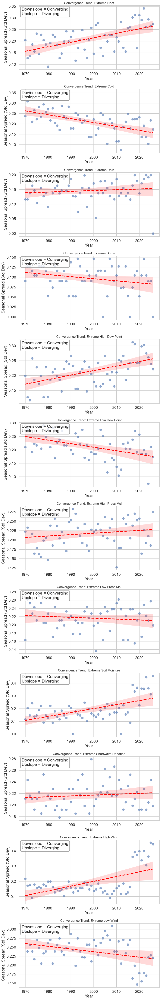

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up a grid for the plots
n_extremes = len(extreme_cols)
fig, axes = plt.subplots(n_extremes, 1, figsize=(10, 5 * n_extremes))

# If only one extreme, axes won't be a list, so we wrap it
if n_extremes == 1: axes = [axes]

for i, ext in enumerate(extreme_cols):
    # Calculating the spread between seasons per year
    # Grouping by year and take the standard deviation of the ratios
    spread_data = data_for_extreme_vars.groupby('year')[ext].std().reset_index(name='std_dev')
    
    # Plotting the trend
    sns.regplot(data=spread_data, x='year', y='std_dev', ax=axes[i], 
                scatter_kws={'alpha':0.6}, line_kws={'color':'red', 'linestyle':'--'})
    
    # Aesthetics
    axes[i].set_title(f'Convergence Trend: {ext.replace("_", " ").title()}', fontsize=14)
    axes[i].set_ylabel('Seasonal Spread (Std Dev)')
    axes[i].set_xlabel('Year')
    
    # Annotation logic for the user
    axes[i].annotate('Downslope = Converging\nUpslope = Diverging', 
                     xy=(0.02, 0.85), xycoords='axes fraction', 
                     bbox=dict(boxstyle="round", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

**NOTE:** the above results only concerns the Burlington, Vermont area. However, such a place is recognised as ideal for temperate climates for the North Eastern area of the United States of America. 

## Regime Detection - Hidden Markov Model (HMM) and Pursuit of a Markov-Switching Vector Error Correction Model (MS-VECM)

### Hidden Regime Process (HMM core)

A Hidden Markov Model (HMM) for regime processes is a statistical framework used to uncover hidden, unobservable states (regimes) that drive observable data (Baum and Petrie, 1966). It is commonly applied in finance to distinguish between market states—such as high-volatility, low-volatility, bull, or bear markets—based on observable inputs like price returns and volume. HMM is also applicable to meteorological and climatology interests. 

**Core Concepts of HMM Regime Processes:**

1. Hidden States (Regimes): These are the underlying, unseen conditions (e.g., "Rainy Season," "Dry Season", "Temperate Climate seasons", **or more micro level phenomena**) that the model aims to infer.

2. Observations (Features): The visible data, such as temperature, precipitation types, winds, pressure levels, etc., that are generated by the hidden regimes.

3. Markov Chain (Memoryless): The model assumes the current state depends only on the previous state. This implies that the regime tomorrow depends only on the regime today, not on the entire history of the ambiance.

4. Emission Probabilities: Each regime has its own statistical distribution (e.g., Gaussian or types with general skewness and kurtosis) that generates the observable data. For example, in finance, a "Bear" regime might have a high-volatility emission distribution, while a "Bull" regime has low volatility.

5. Transition Matrix: Defines the likelihood of switching from one regime to another (e.g., the probability of switching from one season to the next or remaining in the same state).

**Hidden Regime Process (HMM core)**:

Let:

1. $S_t \in \{1,\,,2\,...\,,K\} = $ hidden regime (normal, extreme, etc.)

2. $X_t \in \mathbb{R}^n = $ observed weather vector

State Dynamics:

$$P(S_t = j | S_{t-1} = i) = p_{ij}$$

Observational Model:

$$X_t | S_t = k \sim \mathcal{N}(\mu_k, \Sigma_k)
$$

Where:

1. Each regime = mixture of Gaussians

2. Such captures skewness + heavy tails

Such constitution is the **Gaussian Mixture HMM (GMM-HMM)** for regime detection. **NOTE:** will not be adopting a Gaussian framework for simplicity because from prior observations of the weather variables there's respectable asymmetry and kurtosis. 

**Regime Interpretation:**

Each regime corresponds to different parameter sets:

$$(\mu_k\,,\,\Sigma_k)$$

1. “Normal regime” $\rightarrow$ moderate mean, low variance

2. “Extreme regime” $\rightarrow$ shifted mean and/or high variance

**Dynamic Dependence (MS-VAR idea):**

To introduce time dependence:

$$X_t = A_{S_t}X_{t-1} + \epsilon_t\,\,\,,\epsilon_t\,\sim\,N(0\,,\,\Sigma_{s_t})$$

Each regime has its own dynamics $A_k$.

### MS-VECM (Cointegration + Regimes)

A Markov-Switching Vector Error Correction Model (MS-VECM) is a sophisticated econometric tool that combines two powerful concepts: Vector Error Correction Models (VECM), which model long-run equilibrium relationships between non-stationary time series, and Markov-Switching (MS) models, which allow for sudden, probabilistic structural breaks or shifts in the dynamics of that relationship (Phoong, Ismail, and Sek, 2014).

The core idea is to allow the parameters of a VECM—such as the intercept, adjustment speed, or variance—to switch between different "regimes" (e.g., expansion vs. recession) according to an unobserved (hidden) Markov process.

**Core Ideas and Components:**

1. VECM Foundation (Long-Run & Short-Run): MS-VECM starts with the idea that non-stationary time series are cointegrated, sharing a long-run equilibrium (e.g., oil and gold prices affecting stock markets).

2. Regime Switching (Non-Linearity): It addresses the limitation of a standard linear VECM (which assumes constant parameters) by allowing the system to shift between different structural regimes (e.g., two or three distinct phases).

3. Markov Chain Structure: The transition between regimes is not assumed to be known (like in a dummy variable model), but is modeled as a stochastic, hidden Markov chain. This makes the model more reliable in capturing sudden market changes.

4. Error Correction Mechanism: Each regime has its own error correction mechanism, meaning that if a shock causes a divergence from the long-run equilibrium, the system adjusts back toward equilibrium, but with a speed specific to the current regime.

**Advantages:**

1. Can handle non-linear relationships among variables. 

2. Captures Structural Changes: Ideal for data which often undergo sudden shifts, such as climate shifts or extreme phrenomena-driven structural changes.

3. Flexible Dynamics: It captures both the long-run cointegration and the short-run deviations that vary over time, offering a more flexible model compared to linear VECM.

4. Identifies "Hidden" States: It helps to identify regimes even when they are not directly observed in the data.

**IF** variables are cointegrated:

$$\Delta X_t = \Pi_{S_t}\, X_{t-1} + \sum_{i=1}^{p-1} \Gamma_{i,\, S_t}\, \Delta X_{t-i} + \epsilon_t$$

Where:

$\Pi_{St} = \alpha_{St} \beta'$

Interpretation:

1. $\beta' X_{t-1}\,\rightarrow\, $ long-run equilibrium

2. $\alpha_{S_t}\,\rightarrow\, $ regime-dependent adjustment speed

### Full Unified Model


Hidden States:

$$S_t\,\sim\,\text{Markov}(P)$$

Observations:

$$\Delta X_{t} = \alpha\,S_{t}^{\beta'}\, X_{t-1} + \Gamma_{S_t}\, \Delta X_{t-1} + \epsilon_{t}$$

$$\epsilon_t\,\sim\,N(0,\,\Sigma_{S_t})$$

### The Idea

1. HMM part $\rightarrow$ detects regimes (normal vs extreme)

2. MS-VECM part $\rightarrow$ models: 
    
     equilibrium relationships

     how they change during extremes

### Minimal Practical Version - the simplest usable structure:

1. Estimate HMM:

$$P(s_t | X_t)$$

2. Conditional model:

$$X_t | S_t\,\,=\,\,k\,\sim\,\text{VECM}_k$$

### Transparency:

Regimes Effect:

1. mean $(\mu)$

2. variance $(\Sigma)$

3. dynamics $(A\,,\,\Gamma)$

4. equilibrium adjustement $(\alpha)$

Such above permits the unification of:

1. extreme detection

2. time dynamics

3. structural shifts

In [26]:
vars_data = data_for_extreme_vars.copy()

vars_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   year                                    20552 non-null  int32              
 2   month                                   20552 non-null  int32              
 3   season                                  20552 non-null  object             
 4   temperature_2m_max                      20552 non-null  float32            
 5   temperature_2m_max_threshold            20552 non-null  float64            
 6   extreme_heat                            20552 non-null  bool               
 7   temperature_2m_min                      20552 non-null  float32            
 8   temperature_2m_min_threshold            20552 non-null  float64            


### Empirical Climate Recognition

For a place like Burlington in Vermont, observed is a strongly seasonal, mid-latitude continental climate with lake effects (from Lake Champlain), so the regimes should ideally capture:

1. Temperature structure (warm vs cold)

2. Moisture / precipitation type (rain vs snow)

3. Synoptic forcing (pressure + wind)

4. Surface energy balance (radiation)

There's only interest in informative, low-redundancy signals that define distinct atmospheric states.

Think of regimes like:

1. Cold & dry (Arctic high)

2. Cold & snowy/wet (Nor’easter / lake effect)

3. Warm & humid (summer convection)

4. Warm & dry (high pressure ridge)

**Initial variable to provide strong, interpretable regimes:**

1. temperature midpoint(derived from max/min)

2. temperature range (derived from max/min)

3. pressure midpoint (derived from max/min)

4. pressure range (derived from max/min)

5. wind_speed_10m_max

6. rain_sum

7. snowfall_sum

8. dewpoint mean (derived from max/min)

9. shortwave_radiation_sum"

Engineering features of interest:

In [27]:
import numpy as np

# --- Temperature ---
vars_data["temp_mean"] = (vars_data["temperature_2m_max"] + vars_data["temperature_2m_min"]) / 2
vars_data["temp_range"] = vars_data["temperature_2m_max"] - vars_data["temperature_2m_min"]

# --- Pressure ---
vars_data["pressure_mean"] = (vars_data["pressure_msl_max"] + vars_data["pressure_msl_min"]) / 2
vars_data["pressure_range"] = vars_data["pressure_msl_max"] - vars_data["pressure_msl_min"]

# --- Dew Point ---
vars_data["dewpoint_mean"] = (vars_data["dew_point_2m_max"] + vars_data["dew_point_2m_min"]) / 2

Selecting features of interest:

In [28]:
features_for_HMM = vars_data[[
    "temp_mean",
    "temp_range",
    "pressure_mean",
    "pressure_range",
    "wind_speed_10m_max",
    "rain_sum",
    "snowfall_sum",
    "dewpoint_mean",
    "shortwave_radiation_sum"
]]


Observing the distribution of for each scaled attribute:

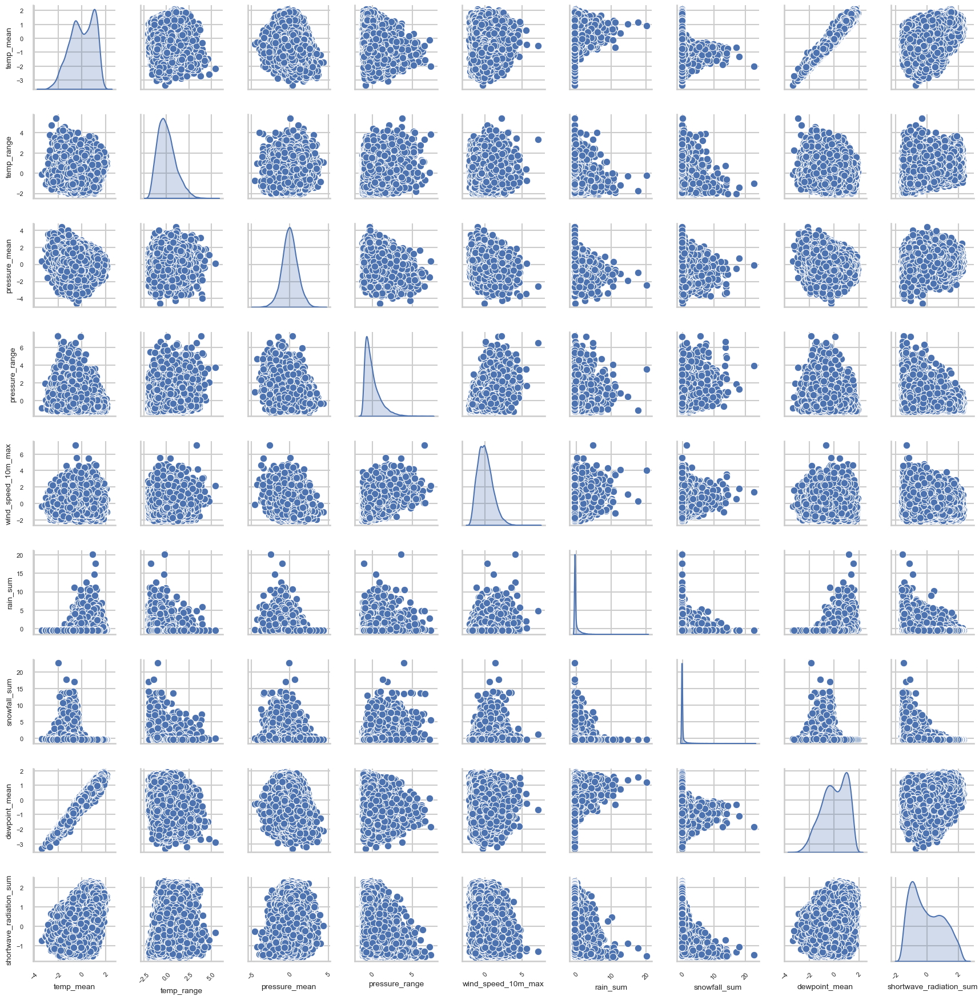

In [29]:
from sklearn.preprocessing import StandardScaler

density_vars = features_for_HMM.copy()


scaler = StandardScaler()
X_den_scaled = scaler.fit_transform(density_vars)


# Recreate DataFrame with original column names
X_den_scaled_df = pd.DataFrame(X_den_scaled, columns=density_vars.columns)

# 1. Create the pairplot
# We use 'height' to control the overall scale of the subplots
g = sns.pairplot(X_den_scaled_df, diag_kind='kde', height=2)

# 2. Iterate through the axes to shrink labels and ticks
for ax in g.axes.flatten():
    if ax is not None:
        # Shrink the Variable Names (e.g., 'temp_anom')
        ax.xaxis.label.set_size(10)
        ax.yaxis.label.set_size(10)
        
        # Shrink the Tick Numbers (e.g., -2.5, 0, 2.5)
        ax.tick_params(axis='both', which='major', labelsize=8)
        
        # Optional: Rotate x-labels to save space
        ax.tick_params(axis='x', rotation=45)

# 3. Adjust spacing so labels don't overlap neighboring plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

A Gaussian HMM assumes:

1. Each **hidden state** emits data from a Gaussian distribution

2. It does **NOT** assume the overall distribution is Gaussian.

So, if the densities look non-normal , that might actually be expected—and even desirable concerning a mixture of regimes.

Observation of Spearman correlation (for continuous but non-normal attributes):

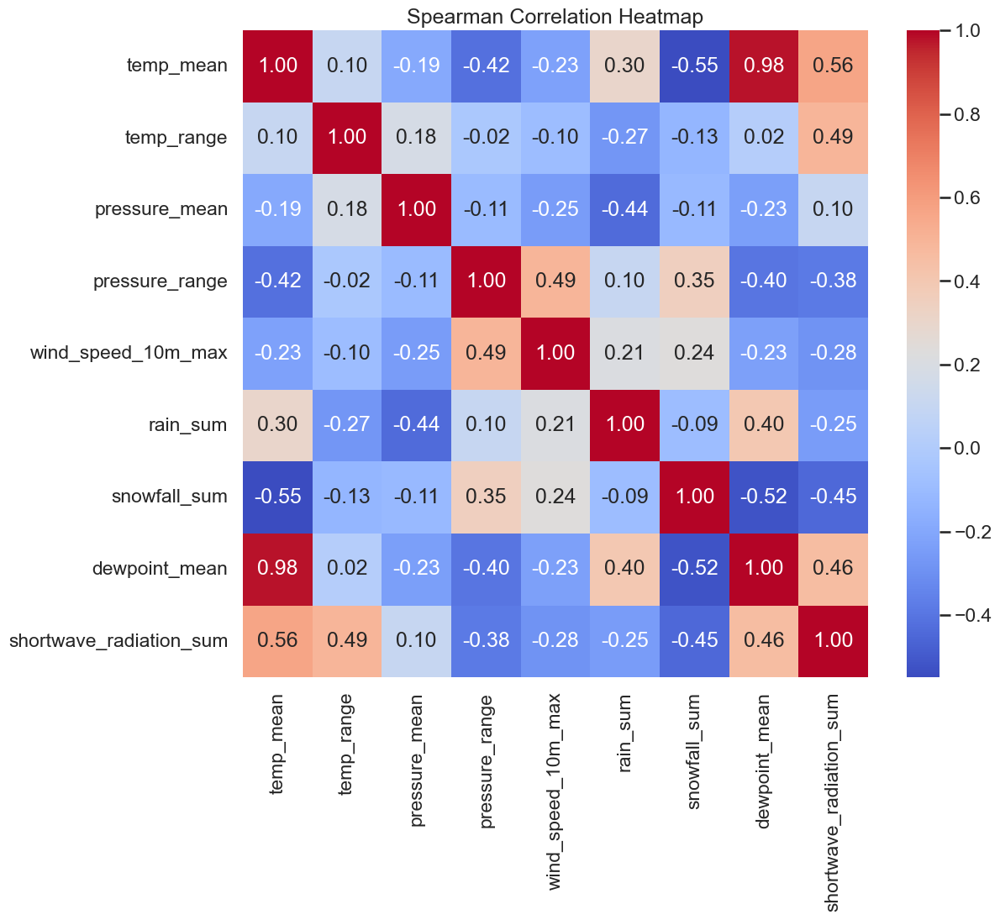

In [30]:
# Calculate the Pearson correlation matrix, excluding the non-numeric 'date' column
correlation_matrix = features_for_HMM.corr(method='spearman')

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Spearman Correlation Heatmap')
plt.show()

### Model Development

Now, to develop a clean end-to-end routine with correct placement, from:

1. preprocessing

2. HMM fitting (robust, stable)

3. selecting optimal regime model

4. assigning regimes back to your original dataframe

5. computing regime-wise statistics

6. generating final enriched dataset

In [31]:
import numpy as np
import pandas as pd
from hmmlearn.hmm import GaussianHMM
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist
import warnings

warnings.filterwarnings("ignore")


# =========================================================
# 1. PREPROCESSING
# =========================================================
def preprocess(X):
    X = X.copy()

    # Clip extremes (important for climate stability)
    low = np.percentile(X, 2, axis=0)
    high = np.percentile(X, 98, axis=0)
    X = np.clip(X, low, high)

    # Standardize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    return X_scaled


# =========================================================
# 2. ROBUST HMM FIT (MULTI-RESTART)
# =========================================================
def fit_hmm(X, n_states, n_restarts=8):

    best_model = None
    best_ll = -np.inf
    best_conv = False

    for seed in range(n_restarts):
        try:
            model = GaussianHMM(
                n_components=n_states,
                covariance_type="diag",
                n_iter=150,
                min_covar=1e-1,
                random_state=seed,
                init_params="stmc"
            )

            model.fit(X)
            ll = model.score(X)

            if ll > best_ll:
                best_model = model
                best_ll = ll
                best_conv = model.monitor_.converged

        except:
            continue

    return best_model, best_ll, best_conv


# =========================================================
# 3. DIAGNOSTICS
# =========================================================
def diagnostics(model, X):
    states = model.predict(X)
    n = model.n_components

    counts = np.bincount(states, minlength=n)
    p = counts / len(states)

    trans = model.transmat_
    durations = 1 / (1 - np.diag(trans))

    means = model.means_
    sep = np.mean(pdist(means)) if n > 1 else 0

    return {
        "min_occupancy": p.min(),
        "mean_duration": durations.mean(),
        "min_duration": durations.min(),
        "separation": sep
    }


# =========================================================
# 4. STABILITY CHECK
# =========================================================
def stability_score(X, n_states, runs=5):

    base_model = GaussianHMM(
        n_components=n_states,
        covariance_type="diag",
        n_iter=150,
        min_covar=1e-1,
        random_state=0
    ).fit(X)

    base_states = base_model.predict(X)

    scores = []

    for seed in range(1, runs):
        model = GaussianHMM(
            n_components=n_states,
            covariance_type="diag",
            n_iter=150,
            min_covar=1e-1,
            random_state=seed
        ).fit(X)

        states = model.predict(X)
        scores.append(np.mean(states == base_states))

    return np.mean(scores)


# =========================================================
# 5. TRAIN / TEST SPLIT (time series safe)
# =========================================================
def split(X, ratio=0.7):
    cut = int(len(X) * ratio)
    return X[:cut], X[cut:]


# =========================================================
# 6. FULL MODEL SELECTION (YOU ALREADY FOUND n=2)
# =========================================================
def select_model(X, n_states=2):

    X_scaled = preprocess(X)
    train, test = split(X_scaled)

    model, train_ll, conv = fit_hmm(train, n_states)

    test_ll = model.score(test)

    diag = diagnostics(model, train)
    stab = stability_score(train, n_states)

    results = pd.DataFrame([{
        "n_states": n_states,
        "train_ll": train_ll,
        "test_ll": test_ll,
        "converged": conv,
        "stability": stab,
        **diag
    }])

    return model, X_scaled, results


# =========================================================
# 7. REGIME ASSIGNMENT TO ORIGINAL DATAFRAME
# =========================================================
def attach_regimes(df, model, X_scaled):

    df = df.copy()

    regimes = model.predict(X_scaled)
    df["regime"] = regimes

    return df


# =========================================================
# 8. REGIME-WISE SUMMARY STATISTICS
# =========================================================
def regime_statistics(df):

    numeric_cols = df.select_dtypes(include=[np.number]).columns
    numeric_cols = [c for c in numeric_cols if c != "regime"]

    summary = df.groupby("regime")[numeric_cols].agg(["mean", "std", "min", "max"])

    mean_profile = df.groupby("regime")[numeric_cols].mean()

    std_profile = df.groupby("regime")[numeric_cols].std()

    freq = df["regime"].value_counts(normalize=True)

    return summary, mean_profile, std_profile, freq


# =========================================================
# 9. FINAL PIPELINE (RUN THIS)
# =========================================================
def run_hmm_pipeline(features_for_HMM):

    # STEP 1: fit best model (already known n=2)
    model, X_scaled, results = select_model(features_for_HMM, n_states=2)

    print("\nMODEL SUMMARY:\n", results)

    # STEP 2: attach regimes
    df_regimes = attach_regimes(features_for_HMM, model, X_scaled)

    # STEP 3: regime statistics
    summary, mean_profile, std_profile, freq = regime_statistics(df_regimes)

    print("\nREGIME FREQUENCIES:\n", freq)
    print("\nREGIME MEAN PROFILES:\n", mean_profile)
    print("\nREGIME STANDARD DEVIATION PROFILES:\n", std_profile)

    return df_regimes, summary, mean_profile, std_profile, model


df_regimes, summary, mean_profile, std_profile, model = run_hmm_pipeline(features_for_HMM)



MODEL SUMMARY:
    n_states      train_ll       test_ll  converged  stability  min_occupancy  \
0         2 -95417.081115 -42719.743375       True   0.750017       0.273182   

   mean_duration  min_duration  separation  
0       9.292756      5.071441    2.940915  

REGIME FREQUENCIES:
 regime
0    0.727569
1    0.272431
Name: proportion, dtype: float64

REGIME MEAN PROFILES:
         temp_mean  temp_range  pressure_mean  pressure_range  \
regime                                                         
0       12.335235    7.994008    1015.696777        6.518806   
1       -5.042463    7.583229    1015.730774       11.278085   

        wind_speed_10m_max  rain_sum  snowfall_sum  dewpoint_mean  \
regime                                                              
0                15.076762  2.654604      0.000000       7.496199   
1                18.125628  1.140239      1.460448      -9.194061   

        shortwave_radiation_sum  
regime                           
0               

#### Model Performance

The model summary shows that $n=2$ is a stable starting point. While the model converged, the stability (0.75) and separation (2.94) suggest that while two distinct states exist, they may have some overlap or the transitions between them are somewhat fluid.

**Interpreting your $n=2$ Results**

1. Min Occupancy (0.27): This is a healthy sign. It means your smaller state still accounts for about 27% of the data. If this were near 0, it would indicate a "dead" state.

2. Mean Duration (9.29): On average, the model stays in a state for about 9.3 time steps before transitioning.

       Domain Context: If these are monthly meteorological records, the model is identifying regimes that last roughly 9 months (perhaps seasonal or ENSO-related).

       Domain Context: If these are yearly socioeconomic records, these represent nearly decade-long trends.

3. Separation (2.94): This metric (likely a measure of distance between the emission distributions) is moderate. It suggests the model can distinguish between the two regimes, but they aren't "worlds apart."

**The "Non-Convergence" Link - $n>2$ Failure**

The jump from $n=2$ to $n=3$ often causes the numerical instability. Here is why:

1. Transition Sparsity: With $n=2$, you only have 4 possible transitions ($1\to1, 1\to2, 2\to1, 2\to2$). With $n=3$, you have 9. If your data doesn't have enough "events" moving between specific states, the transition matrix becomes singular.

2. State Overlap: If the underlying phenomenon (e.g., "High Risk" vs "Low Risk") is truly binary, forcing a 3rd state makes the model try to split one of those logical clusters into two. This leads to the log-likelihood "wobbling" (the negative delta you saw) as the EM algorithm fails to decide where to draw the line.

#### Model Summary

**Regime 0:**

baseline climate state

stable / persistent conditions

**Regime 1:**

high variability / extremes / disturbances

**High Interpretation**

Regime 0 = “Warm / stable / energy-rich state”

Regime 1 = “Cold / dynamic / moisture-transition state”

This is not just statistical—it maps to clear meteorological structure.

**Regime Characteristics:**

| Variable    | Regime 0 (Warm/Stable) | Regime 1 (Cold/Active) | Interpretation                       |
| ----------- | ---------------------- | ---------------------- | ------------------------------------ |
| Frequency   | **72.8%**              | **27.2%**              | Dominant baseline climate            |
| Temperature | **12.34°C**            | **-5.04°C**            | Strong thermal separation            |
| Temp Range  | 7.99                   | 7.58                   | Similar variability                  |
| Pressure    | 1015.70                | 1015.73                | No meaningful difference             |
| Wind Speed  | 15.08                  | **18.13**              | More dynamic in Regime 1             |
| Rain        | **2.65**               | 1.14                   | Wet conditions in Regime 0           |
| Snowfall    | 0.00                   | **1.46**               | Snow concentrated in Regime 1        |
| Dewpoint    | 7.50                   | **-9.19**              | Strong humidity contrast             |
| Radiation   | **15.40**              | 7.20                   | Clear-sky vs low-insolation contrast |


#### Physical Interpretation of Regimes

**Regime 0 (72.8%) — “Warm Maritime / Baseline Energy Regime”**

Key attributes:

1. Positive temperature (~12°C)

2. Higher radiation → more solar input

3. Higher rainfall (liquid precipitation)

4. No snowfall

5. Higher dewpoint $\rightarrow$ moist air mass

This is the dominant background climate state likely representing:

     Warm-season conditions **OR** lower latitude / low-altitude air mass influence.

**Regime 1 (27.2%) — “Cold / Dynamic / Snow-Active Regime”**

Key attributes:

1. Sub-zero temperatures

2. Strong wind increase

3. Snowfall present

4. Very low dewpoint (dry air)

5. Lower radiation (cloud / winter suppression)

This is a cold-air intrusion / winter-like regime characterised by:

1. frontal passages

2. polar air masses

3. high dynamical activity

**Pressure is almost identical:**

1. Regime 0: 1015.70

2. Regime 1: 1015.73

This means regimes are **NOT** pressure-driven synoptic systems but temperature / moisture-driven air mass regimes. However, the fact that the standard deviation of the pressure_range is so much higher in Regime 1 (6.54 vs 3.95) suggests that the winter state isn't just "cold"—it's where the most extreme atmospheric pressure swings occur.

**The Dynamic Link: Why Cold Air Masses "Swing"**

Even though the regimes are temperature/moisture-driven, the increased pressure variance in the "Cold/Dry" Regime 1 is a classic signature of **Baroclinic Instability**.

1. The Temperature Gradient: Cold air masses in winter (Regime 1) usually sit adjacent to much warmer maritime air. This sharp horizontal temperature gradient ($\nabla T$) is the fuel for cyclogenesis.

2. Pressure Swings as a Proxy: While the air mass itself is defined by $T$ and $Q$ (specific humidity), it acts as the "playing field" for the most intense pressure systems. The high standard deviation in pressure_range (6.54) indicates that when you are in the "Cold Regime," you are likely near the jet stream’s path, where rapid transitions between high-pressure Arctic ridges and deepening low-pressure troughs occur.

**ASSIGNING REGIMES TO FULL DATASET**

In [32]:
# =========================================================
# ASSIGN REGIMES TO FULL DATASET
# =========================================================

# 1. Use SAME features used in training
X_scaled = preprocess(features_for_HMM)

# 2. Predict regimes
states = model.predict(X_scaled)

# 3. Attach to FULL dataset
vars_with_regime = vars_data.copy()
vars_with_regime["regime"] = states

# 4. Now group ANY variables (even ones not in HMM)
regime_table = vars_with_regime.groupby("regime").agg({
    'temperature_2m_max': ['mean', 'std'],
    'temperature_2m_min': ['mean', 'std'],
    'rain_sum': ['mean', 'median', 'max', 'std'],
    'snowfall_sum': ['mean', 'median', 'max', 'std'],
    'wind_speed_10m_max': ['mean', 'std'],
    'pressure_msl_max': ['mean', 'std'],
    'pressure_msl_min': ['mean', 'std'],
    'dew_point_2m_max': ['mean', 'std'],
    'dew_point_2m_min': ['mean', 'std'],
    "shortwave_radiation_sum": ['mean', 'median', 'max', 'std']
})

print(regime_table)

       temperature_2m_max           temperature_2m_min            rain_sum  \
                     mean       std               mean       std      mean   
regime                                                                       
0               16.332239  8.633041           8.338231  8.300159  2.654604   
1               -1.250848  5.748150          -8.834077  6.914220  1.140239   

                                    snowfall_sum         ... pressure_msl_min  \
       median         max       std         mean median  ...             mean   
regime                                                   ...                    
0         0.1  109.299995  5.761967     0.000000   0.00  ...      1012.437378   
1         0.0   61.800003  3.625109     1.460448   0.42  ...      1010.091736   

                  dew_point_2m_max           dew_point_2m_min            \
              std             mean       std             mean       std   
regime                                               

In [33]:
vars_with_regime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 46 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   year                                    20552 non-null  int32              
 2   month                                   20552 non-null  int32              
 3   season                                  20552 non-null  object             
 4   temperature_2m_max                      20552 non-null  float32            
 5   temperature_2m_max_threshold            20552 non-null  float64            
 6   extreme_heat                            20552 non-null  bool               
 7   temperature_2m_min                      20552 non-null  float32            
 8   temperature_2m_min_threshold            20552 non-null  float64            


#### Annual Regime Frequency - Relative Frequency Analysis

Quantifying the Structural Composition of each year: calculating the Empirical Occupancy Frequency of the atmosphere’s hidden states over a temporal grid. 

Creating a frequency count ($n$). For every year ($t$) and every detected regime ($j$), the model counts the total number of days ($d$) where the state was active.

$$n_{t,j} = \sum_{d=1}^{365} [S_d = j]$$

Where:

$S_d$ is the state of the weather on day $d$.

$[S_d = j]$ is an indicator function that equals $1$ if the day matches the regime, and $0$ otherwise.

There's need to transform raw days into a Probability Mass Function (PMF). This is necessary because leap years have 366 days, and missing data can skew raw counts. By dividing each regime count by the total days recorded that year, a Proportion ($\pi$) is created:

$$\pi_{t,j} = \frac{n_{t,j}}{\sum_{k=1}^{K} n_{t,k}}$$

1. Constraint: For any given year, the sum of all proportions must equal $1$ ($\sum \pi = 1$).

2. Result: This converts the data into a Compositional Time Series, where the regimes compete for "space" within the 365-day calendar.

When plotting this as a Stacked Bar, there' **visual representation of the Evolution of the State Space**.

1. Stationary Hypothesis: In a stable climate, the ratio $\pi_{0} : \pi_{1}$ remains constant over time (within a margin of standard error).Non-

2. Stationary (Climate Change) Hypothesis: The "Extreme" regime ($\pi_1$) exhibits a positive trend ($\frac{\Delta \pi_1}{\Delta t} > 0$), meaning it is systematically displacing the "Stable" regime ($\pi_0$).

This structure treats each year as a "Probability Bucket." By looking at how the colours shift from the late 1970s to 2026, there's identification of a Phase Transition in the local climate—quantifying exactly how much of the "Normal" year has been lost to the "Extreme" state.

The proportions act as a "Signal" for the trend analysis

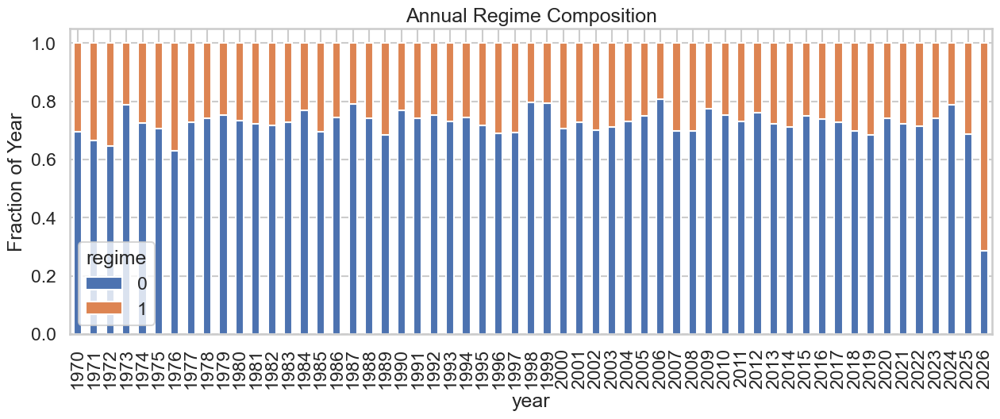

In [34]:
annual = vars_with_regime.groupby(['year', 'regime']).size().unstack(fill_value=0)
annual_pct = annual.div(annual.sum(axis=1), axis=0)

annual_pct.plot(kind='bar', stacked=True, figsize=(15,5))
plt.title("Annual Regime Composition")
plt.ylabel("Fraction of Year")
plt.show()

**NOTE:** for the data applied a full year for 2026 isn't complete. Data goes up to April 8 2026.

#### Transition Probability Matrix

**The previous analysis and visualisation looked at the total volume of each regime per year**. To now calculate the Transition Probability Matrix ($P$) for the weather regimes. To now reveal the Internal Dynamics—how the atmosphere actually moves from one state to another. Mathematically, this transforms the sequence of weather states into a First-Order Markov Chain.

**The Mathematical Mechanism:** $t-1 \to t$

There's need to create "Pairs" of consecutive days. For every point in time, to look at the "Past" and the "Present".

Row Index (regime.shift(1)): Represents the state at time $t-1$ (Yesterday).

Column Index (regime): Represents the state at time $t$ (Today).

The crosstab counts how many times the sequence $(0 \to 0)$, $(0 \to 1)$, $(1 \to 0)$, and $(1 \to 1)$ occurred in your 18,000+ days.

**The Normalisation: Conditional Probability**

The **normalize='index'** argument is the most crucial part of the logic. It ensures that each row sums exactly to $1.0$. This converts raw counts into Conditional Probabilities:

$$P(S_t = j \mid S_{t-1} = i)$$

This answers the question: "Given that we are in Regime $i$ today, what is the probability we will be in Regime $j$ tomorrow?"

**Interpreting the Matrix Structure**

The resulting matrix $P$ will look like the following:

$$P = \begin{bmatrix} p_{00} & p_{01} \\ p_{10} & p_{11} \end{bmatrix}$$

**The "Diagonal" ($p_{00}$ and $p_{11}$): Persistence --**

These represent the probability of the weather staying put.

   If $p_{11}$ is high (e.g., $0.85$), it means once an "Extreme" regime starts, it has an $85\%$ chance of continuing the next day. This measures Climatic Stagnation or the duration of heatwaves/storm cycles.

**The "Off-Diagonal" ($p_{01}$ and $p_{10}$): Volatility --**

These represent the probability of a Switch.

   $p_{01}$ is the "Entry Rate" into the extreme state.

   $p_{10}$ is the "Recovery Rate" back to the stable state.

**Climate Change Analytical Value** 

By running the succeeeding code on different slices of the data (e.g., the 1990s vs. the 2020s), to detect Structural Decay in the climate:

1. Increased Persistence: If $p_{11}$ is higher in 2026 than in 1990, extreme events aren't just more frequent—they are getting "stuck" for longer periods (e.g., longer droughts or multi-day flood events).

2. Faster Triggering: If $p_{01}$ (Stable $\to$ Extreme) is increasing, the "buffer" of the atmosphere is weakening, and it takes less energy to flip the system into a hazardous state.

**Summary Table:**

| Matrix Component | Mathematical Term | Climate Meaning |
|------------------|-------------------|-----------------|
| Rows | $S_{t-1}$ (Condition) | "Where we are starting from" |
| Columns | $S_{t}$ (Outcome)| "Where we are going" | 
| Diagonal | Self-Transition | Stability/Duration: How long a regime lasts. Persistence |
| Off-Diagonal | State Switch | Sensitivity: How easily the weather flips. Switching probability|

While the previous "Stacked Bar" chart exhibited the composition of the year, this matrix shows the behaviour of the atmosphere. It proves whether the "Extreme" regime is becoming a more "sticky" or "absorptive" state in the 2026 environment.

In [35]:
transitions = pd.crosstab(
    vars_with_regime['regime'].shift(1),
    vars_with_regime['regime'],
    normalize='index'
)

print(transitions)

regime         0         1
regime                    
0.0     0.927970  0.072030
1.0     0.192534  0.807466


**Transition Matrix:**

| From \ To    | Regime 0  | Regime 1  |
| ------------ | --------- | --------- |
| **Regime 0** | **0.928** | 0.072     |
| **Regime 1** | 0.193     | **0.807** |

**Regime 0 (Warm / Stable):**

1. 92.8% chance of staying

2. Only 7.2% chance of switching

This is a highly persistent dominant regime.

**Regime 1 (Cold / Active):**

1. 80.7% chance of staying

2. 19.3% chance of switching back to Regime 0

Still persistent, but less stable than Regime 0.

**Expected Duration:**

From transition probabilities:

$$\text{Duration} = \frac{1}{1 - p_{ii}}$$

Regime 0:

$$\frac{1}{1 - 0.928} \approx 13.9 \,\,\text{timestamps}$$

Regime 1:

$$\frac{1}{1 - 0.807} \approx 5.2 \,\,\text{timestamps}$$

| Regime   | Expected Duration | Meaning                     |
| -------- | ----------------- | --------------------------- |
| Regime 0 | ~14 steps         | long-lived background state |
| Regime 1 | ~5 steps          | short-lived disturbance     |


Regime 0:

1. Stable

2. Persistent

3. Likely seasonal/background climate

Regime 1:

1. Transitional

2. Event-driven (cold intrusion / storm regime)

3. Naturally shorter-lived

**Asymmetry insight (very important)**

Notice:

0 → 1 = 7.2%

1 → 0 = 19.3%

**Meaning:** It is much easier to EXIT the cold regime than to ENTER it.

Cold/dynamic states are episodic, while warm state is default equilibrium

This is a hallmark of:

1. atmospheric regime switching

2. extreme-event dynamics

Observed is a system that behaves like:

1. Stable baseline + intermittent disturbance regime

2. This is exactly how many real climate systems behave.

#### Applying Observed Regimes from Hidden Markov Model to Boolean Features 

Earlier, boolean features for extreme flags were created using quantiles upon weather attributes for a respective month throughout each year, or by a specified duration. To now reacquaint with such features to apply to HMM.

The aim now is to map extremes and phenomena to regimes observed/acquired prior. 

In Python / pandas:

   True $\rightarrow$ 1

   False $\rightarrow$ 0

Hence:

$$\text{mean} = \frac{\text{\# True}}{\text{total observations}}$$

In this **special case** use of the mean is the same as calculation of probability. The goal is to determine: 

$$P(\text{weather flag type}\, |\, \text{regime}) = \frac{P(\text{weather flag type}\,\cap\,\text{regime})}{P(\text{regime})}$$

| Case                        | Meaning |
| ------------------------------- | ------- |
| `True` | = extreme event occurred 
| `False` | = no extreme event ccurred |

So group mean gives, for example:

| Regime-conditioned Probabilities |
|----------------------------------|
| Heat extreme probability per regime |
| Rain extreme probability per regime |
| Wind extreme probability per regime |
| Flash Flood probability per regime |

In [36]:
bool_df = vars_with_regime.select_dtypes(include='bool')

regime_probs = vars_with_regime.groupby('regime')[bool_df.columns].mean()

print(regime_probs)

        extreme_heat  extreme_cold  extreme_rain  extreme_snow  \
regime                                                           
0           0.065271      0.041129      0.027553      0.000000   
1           0.010716      0.076085      0.013038      0.040007   

        extreme_high_dew_point  extreme_low_dew_point  extreme_high_press_msl  \
regime                                                                          
0                     0.063064               0.040728                0.048753   
1                     0.018039               0.077692                0.057153   

        extreme_low_press_msl  extreme_soil_moisture  \
regime                                                 
0                    0.043470               0.052163   
1                    0.070013               0.044829   

        extreme_shortwave_radation  extreme_high_wind  extreme_low_wind  
regime                                                                   
0                         0.057380   

#### VECM Attempt

Before proceeding with MS-VECM, cointegration is required. Cointegration requires non-stationarity; VECM requires cointegration. If stationarity exists, then it's not possible to move forwards with MS-VECM. 

In [37]:
from statsmodels.tsa.stattools import adfuller, kpss

filtered_cols = [
    col for col in vars_with_regime.columns
    if (vars_with_regime[col].dtype.kind == 'f') and ('_threshold' not in col)
]

for col in filtered_cols:
    series = vars_with_regime[col].dropna()

    # ADF test (with trend)
    adf_p = adfuller(series, regression='ct', autolag='AIC')[1]

    # KPSS test
    try:
        kpss_p = kpss(series, regression='ct', nlags='auto')[1]
    except:
        kpss_p = None

    print(f"{col}")
    print(f"  ADF p-value : {adf_p:.4f}")
    print(f"  KPSS p-value: {kpss_p}")

temperature_2m_max
  ADF p-value : 0.0000
  KPSS p-value: 0.1
temperature_2m_min
  ADF p-value : 0.0000
  KPSS p-value: 0.1
rain_sum
  ADF p-value : 0.0000
  KPSS p-value: 0.1
snowfall_sum
  ADF p-value : 0.0000
  KPSS p-value: 0.1
dew_point_2m_max
  ADF p-value : 0.0000
  KPSS p-value: 0.1
dew_point_2m_min
  ADF p-value : 0.0000
  KPSS p-value: 0.1
pressure_msl_max
  ADF p-value : 0.0000
  KPSS p-value: 0.1
pressure_msl_min
  ADF p-value : 0.0000
  KPSS p-value: 0.1
soil_moisture_7_to_28cm_mean
  ADF p-value : 0.0000
  KPSS p-value: 0.1
shortwave_radiation_sum
  ADF p-value : 0.0000
  KPSS p-value: 0.1
wind_speed_10m_max
  ADF p-value : 0.0000
  KPSS p-value: 0.01
wind_speed_10m_min
  ADF p-value : 0.0000
  KPSS p-value: 0.01
temp_mean
  ADF p-value : 0.0000
  KPSS p-value: 0.1
temp_range
  ADF p-value : 0.0000
  KPSS p-value: 0.03472165489301328
pressure_mean
  ADF p-value : 0.0000
  KPSS p-value: 0.1
pressure_range
  ADF p-value : 0.0000
  KPSS p-value: 0.1
dewpoint_mean
  ADF p-val

From the above results VECM can't be pursued.

## AMO SST Scope 

The Atlantic Multi-decadal Oscillation (AMO) is recognised as a valid mode of natural variability occurring in the North Atlantic Ocean with an estimated period of 60-80 years. It is based upon the average anomalies of sea surface temperatures (SST) in the North Atlantic basin, typically over 0-80N (UCAR, 2026). 

The Extended Reconstructed Sea Surface Temperature (ERSST) dataset is a global monthly analysis of SST data derived from the International Comprehensive Ocean–Atmosphere Dataset (ICOADS). The dataset can be used for long-term global and basin-wide studies and incorporates smoothed local and short-term variations. The NOAA Global Surface Temperature (NOAA GlobalTemp) product integrates ERSST data with land surface air temperature from the Global Historical Climatology Network-Monthly dataset to create integrated surface temperature analyses (NOAA NCEI, n.d.).

**Define the North Atlantic Mask:**

    AMO (describing the North Atlantic) with coordinates 0°N–70°N and 80°W–0°E.


**Anomaly Calculation:**

    The AMO is calculated from sea surface temperature (SST) anomalies in the North Atlantic (usually between the Equator and 60°N–80°N). Anomaly means the monthly "expected" temperature (seasonal cycle) is removed.


**Detrending:**

    To isolate the internal oscillation from the external, long-term global warming trend, the AMO is often detrended. This is typically achieved by subtracting the global-mean SST anomaly (excluding the North Atlantic) from the North Atlantic SST anomalies.

**Smoothing (Low-Pass Filter):**

    To remove interannual noise and focus on multidecadal variability, a low-pass filter—typically a 10-year, 11-year, or 13-year running mean (moving average)—is applied to the annual or monthly data.

**Alternative Definition:** Some studies have used a simple 10-year running mean of linearly detrended North Atlantic SST anomalies, **although** removing the global mean trend is generally considered more robust. 

**The Trenberth Detrending (The Modern Standard)**

    To remove the global warming signal, subtracting the global mean SST anomaly from the North Atlantic mean.

**Note:** in NetCDF type data, longitudes are often 0–360. If 80°W is 280, then to adjust the slice accordingly.


### Visualization of AMO

An initial task is to calculate and visualize the **Atlantic Multidecadal Oscillation (AMO) Index**, a climate indicator used to track long-term variations in sea surface temperatures (SST) in the North Atlantic.

Actually, what will be acquired is an **AMO Proxy** since SST is applied directly, and not a detrended basin-only Empirical Orthogonal Function (EOF) method. The actual method applied is the **Trenberth-style residual**, being a method of analysing ocean climate variability by subtracting the global-mean sea surface temperature (SST) anomaly from a regional anomaly (**the North Atlantic Region in this case**). This approach is used to remove the forced global warming trend  (**not the geopolitical hot topic**) from the data, **leaving behind the local or "residual" variability** (Trenberth & Fasullo, 2009). Subtracting the global mean serves as a proxy for the externally forced signal, effectively highlighting the "relative" Atlantic warmth index—namely, how much warmer or colder the Atlantic is compared to the rest of the world. Such residual represents internal climate variability, acting to separate the total observed regional variability (e.g., a specific period of warming in the Northern Hemisphere) from the linear or non-linear trend associated with the resulting influence of human beings on nature (Merriam-Webster, n.d.). 


What the analysis is achieving:

1. Regional Isolation: It isolates the "North Atlantic" by defining a specific geographic box (from the Equator to the far North, and from North America to Europe/Africa).

2. Geometric Correction: Since the Earth is a sphere, grid cells near the poles are smaller than those at the Equator. The code applies "area-weighting" to ensure that temperatures near the Equator don't disproportionately bias the average.

3. Climate Signal Extraction: To find the true AMO signal, the code subtracts the "Global Mean" temperature from the North Atlantic average. This removes the "noise" of global warming, showing only how the Atlantic is warming or cooling relative to the rest of the world.

4. Seasonal Normalisation: It removes the standard "summer vs. winter" cycle so that the focus remains on year-to-year and decade-to-decade climate shifts rather than just seasonal changes.

5. Trend Smoothing: Finally, it applies a 12-month moving average to smooth out month-to-month volatility, making it easier to see if the Atlantic is currently in a "Warm Phase" or a "Cold Phase."

**Features of AMO smoothed**

1. Low-frequency signal ("true" AMO behaviour)

2. Captures:

         multi-year to decadal oscillation

3. Looks clean and interpretable

Practical for:

1. Visualizing climate regimes

2. Identifying:

         warm AMO phase

         cool AMO phase

3. Communicating results

Essentially, to see if the North Atlantic is currently behaving "hotter" or "colder" than its historical average once you account for the seasons and the general warming of the planet.

Will be applying SST data ranging from year 1960 to 2025.


**Spatial Aggregation (Area-Weighting)**

Since the Earth is a sphere (or actually spheroidal), grid cells near the poles represent less surface area than those at the equator. To find the mean Sea Surface Temperature (SST), $\bar{T}$, to apply a cosine-latitude weighting:

$$w(\phi) = \cos(\phi)$$

The weighted spatial mean for a region $R$ at time $t$ is defined as:

$$\bar{T}(t) = \frac{\sum_{i \in R} T_i(t) \cdot \cos(\phi_i)}{\sum_{i \in R} \cos(\phi_i)}$$

Where $T_i$ is the temperature at grid point $i$ and $\phi_i$ is the latitude.

**Climatological Detrending (Anomalies)**

To remove the seasonal cycle (e.g., the fact that summer is always warmer than winter), there's calculation of  monthly anomalies. Let $m$ be the month ($1, \dots, 12$). The climatology $\mu_m$ is the long-term average for that specific month:

$$\mu_m = \frac{1}{N} \sum_{y=1}^{N} \bar{T}(m, y)$$

The anomaly $T'(t)$ is then the deviation from this seasonal mean:

$$T'(t) = \bar{T}(t) - \mu_{month(t)}$$

**The Residual Index (Signal Isolation)**

To differentiate between "North Atlantic warming" and "Global warming," the code uses a residual approach. If the whole world is warming, the Atlantic will naturally warm too; the AMO represents the Atlantic's specific behavior relative to the rest of the world.

$$I_{AMO}(t) = T'_{North Atlantic}(t) - T'_{Global}(t)$$

North Atlantic Region: $0^\circ\text{N}–70^\circ\text{N}, 280^\circ\text{E}–360^\circ\text{E}$

Global Region: $60^\circ\text{S}–60^\circ\text{N}$

This subtraction removes the common global trend, leaving behind the internal oscillation of the Atlantic basin.

**Temporal Smoothing (Moving Average)**

Finally, to suppress high-frequency weather "noise" and see the multidecadal signal, a 12-month central rolling mean is applied:

$$S(t) = \frac{1}{12} \sum_{k=-5}^{6} I_{AMO}(t+k)$$

**Variables and Logic**

| Mathematical Step | Expression | Code Implementation |
|-------------------|------------|---------------------|
| Weighting | $\cos(\text{lat})$ | np.cos(np.deg2rad(da.lat)) |
| Regional Mean | $\int T dA / \int dA$ | da.weighted(weights).mean(...) |
| Anomalies | $T - \mathbb{E}[T_{month}]$ | da.groupby("time.month") - clim |
| AMO Residual | $T'_{Natl} - T'_{Global}$ | natl_anom - global_anom |
| Smoothing | Convolution/Mean | .rolling(time=12, center=True).mean() |

Loading dataset...
Extracting regions and computing anomalies...
AMO computed successfully!


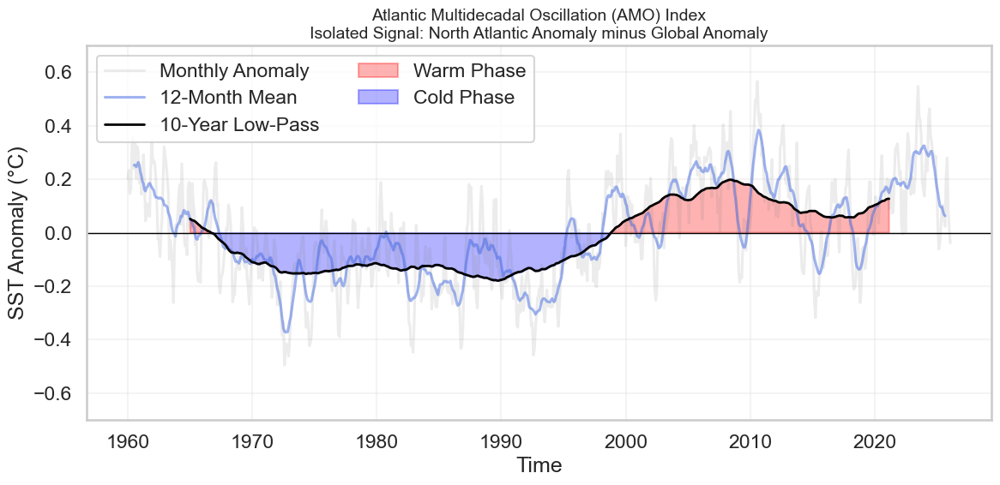

In [38]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# 1. Download (only if needed)
# ---------------------------
url = "https://downloads.psl.noaa.gov/Datasets/noaa.ersst.v6/sst.mnmean.nc"
save_path = os.path.expanduser("~/Downloads/sst.mnmean.nc")

if not os.path.exists(save_path):
    print("Downloading SST dataset (NOAA ERSST v6)...")
    r = requests.get(url, stream=True)
    with open(save_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)

# ---------------------------
# 2. Load and Sort Dataset
# ---------------------------
print("Loading dataset...")
# .sortby("lat") ensures slice(0, 70) works even if the file is 90 -> -90
ds = xr.open_dataset(save_path).load().sortby(["lat", "lon"])

# ---------------------------
# 3. Helper Functions
# ---------------------------
def area_mean(da):
    """Calculates the area-weighted mean using cosine of latitude."""
    weights = np.cos(np.deg2rad(da.lat))
    weights.name = "weights"
    return da.weighted(weights).mean(("lat", "lon"), skipna=True)

def region_mean(ds, lat_range, lon_range, time_slice="1960-01-01"):
    """Slices a region and returns its area-weighted mean."""
    da = ds.sst.sel(
        time=slice(time_slice, None),
        lat=slice(*lat_range),
        lon=slice(*lon_range),
    )
    return area_mean(da)

def get_anomalies(da):
    """Removes the seasonal cycle (Climatology)."""
    clim = da.groupby("time.month").mean("time")
    return da.groupby("time.month") - clim

# ---------------------------
# 4. Compute Indices
# ---------------------------
print("Extracting regions and computing anomalies...")

# North Atlantic (0-70N, 80W-0W/280-360E)
natl_mean = region_mean(ds, (0, 70), (280, 360))
natl_anom = get_anomalies(natl_mean)

# Global Baseline (60S–60N) to remove global warming trend
global_mean = region_mean(ds, (-60, 60), (0, 360))
global_anom = get_anomalies(global_mean)

# Ensure aligned time index and compute the AMO (Trenberth-Shea Residual)
natl_anom, global_anom = xr.align(natl_anom, global_anom, join="inner")
amo_index = natl_anom - global_anom

# ---------------------------
# 5. Smoothing (Low-pass Filters)
# ---------------------------
# 12-month for annual variability
amo_smooth_1y = amo_index.rolling(time=12, center=True).mean()
# 120-month (10-year) for the Multidecadal signal
amo_smooth_10y = amo_index.rolling(time=120, center=True).mean()

print("AMO computed successfully!")

# ---------------------------
# 6. Professional Visualization
# ---------------------------
plt.figure(figsize=(12, 6))

# Background: Raw monthly anomalies
plt.plot(amo_index.time, amo_index, color='gray', alpha=0.15, label="Monthly Anomaly")

# Midground: 1-year mean
plt.plot(amo_smooth_1y.time, amo_smooth_1y, color='royalblue', alpha=0.5, label="12-Month Mean")

# Foreground: 10-year mean (The actual AMO signal)
plt.plot(amo_smooth_10y.time, amo_smooth_10y, color='black', linewidth=2, label="10-Year Low-Pass")

# Professional Red/Blue fill for Warm/Cold phases
plt.fill_between(amo_smooth_10y.time, 0, amo_smooth_10y, 
                 where=(amo_smooth_10y >= 0), color='red', alpha=0.3, label="Warm Phase")
plt.fill_between(amo_smooth_10y.time, 0, amo_smooth_10y, 
                 where=(amo_smooth_10y < 0), color='blue', alpha=0.3, label="Cold Phase")

plt.axhline(0, color="black", linewidth=1)
plt.title("Atlantic Multidecadal Oscillation (AMO) Index\nIsolated Signal: North Atlantic Anomaly minus Global Anomaly", fontsize=14)
plt.ylabel("SST Anomaly (°C)")
plt.xlabel("Time")
plt.ylim(-0.7, 0.7)  # Standard range for AMO
plt.grid(True, alpha=0.2)
plt.legend(loc='upper left', ncol=2)
plt.tight_layout()
plt.show()

Interpreting the AMO graph is essentially like looking at the "heartbeat" of the North Atlantic Ocean. Because you have removed the seasonal cycles and the global warming trend, the resulting line tells you specifically about the internal variability of the Atlantic.

**The Zero Line (The Baseline):**

1. The horizontal line at zero represents the "normal" state for the North Atlantic relative to the rest of the world.

2. Above Zero (Positive Phase): The North Atlantic is warmer than the global average. This "Warm Phase" is historically associated with increased hurricane activity in the Atlantic and wetter conditions in Western Europe.

3. Below Zero (Negative Phase): The North Atlantic is cooler than the global average. This "Cold Phase" often correlates with droughts in the African Sahel and fewer major hurricanes.

**Low-Pass Filtering 12 Months - Peaks and Valleys (The "Wiggles"):**

1. Short-term spikes: Even with a 12-month smoothing, you will see sharp peaks or dips. These are often caused by specific weather events, like a particularly mild winter or a massive dust cloud from the Sahara that temporarily shades and cools the ocean surface.

**Low-pass Filtering 10 Years:** The "Multidecadal" part of AMO implies a very long cycle (60–80 years). While the 12-month rolling mean removes seasonality, standard AMO indices often use a 10-year (120-month) low-pass filter to truly see the oscillation. The Multi-decadal Trend: The "M" in AMO stands for Multidecadal. If you were to look at 50–100 years of data, you would see the line stay above or below zero for 20 to 40 years at a time.


#### Butterworth Low-Pass Filter

Targeting multidecadal variability (AMO scale). The use of a Butterworth filter combined with zero-phase filtering is a premier standard for climate indices. It provides a maximally flat frequency response in the passband and avoids shifting the peaks and troughs of the AMO cycle in time.

**The Frequency Domain Framework**

To isolate the multidecadal signal, defining a boundary in frequency space.

1. Sampling Frequency ($f_s$): Since the data is monthly, $f_s = 1 \text{ cycle/month}$.

2. Nyquist Frequency ($f_N$): The highest frequency that can be resolved by the dataset, defined as:

$$f_N = \frac{f_s}{2} = 0.5 \text{ cycles/month}$$

3. Cutoff Frequency ($f_c$): The target is a 10-year period ($T = 120$ months). The normalized cutoff used by the filter is:

$$f_c = \frac{1}{T} = \frac{1}{120} \approx 0.0083 \text{ cycles/month}$$

4. Normalised Digital Frequency ($W_n$) -- The value passed to the butter function:

$$W_n = \frac{f_c}{f_N} = \frac{1/120}{0.5} = \frac{1}{60}$$

**The Butterworth Transfer Function**

Applying  a 4th-order Butterworth filter. The magnitude response $|H(f)|$ is designed to be as smooth as possible in the "passband" (the AMO frequencies we want to keep):

$$|H(f)| = \sqrt{\frac{1}{1 + \left(\frac{f}{f_c}\right)^{2n}}}$$

$n = 4$: This represents the filter order. A higher order creates a sharper "cliff" at the 10-year mark, more aggressively removing high-frequency noise like ENSO (2–7 years).

**The Difference Equation (Digital Implementation)**

In the computer, this continuous curve is converted into a discrete-time linear constant-coefficient difference equation. The values b (feedforward) and a (feedback) coefficients define the relationship between the input signal $x[n]$ and output $y[n]$:

$$\sum_{k=0}^{M} a_k y[n-k] = \sum_{k=0}^{L} b_k x[n-k]$$

Specifically, for a 4th-order filter, the output at any month $n$ is a weighted sum of the current and past 4 months of raw data, minus a weighted sum of the past 4 months of filtered data.

**Zero-Phase Filtering (filtfilt)**

A standard filter causes a phase shift (a time delay) where the filtered red line would appear to "lag" behind the raw blue data. The code solves this using the filtfilt operation --

1. Forward Pass: Filter the data from start to finish.

2. Reverse Pass: Take the result, flip it, and filter it again.Mathematically, if the filter has a frequency response $H(z)$, the total operation is:

$$|H_{total}(z)| = H(z) \cdot H(z)^* = |H(z)|^2$$

The Result: * Zero Phase Distortion: The peaks and valleys of the filtered AMO line align perfectly in time with the raw data.

1. Effective Order Doubling: The 4th-order filter effectively acts as an 8th-order filter, making the transition between "kept" and "removed" frequencies even sharper.

**Summary of Objective**

| Logic Component | Mathematical Intention | Climate Science Purpose |
|-----------------|------------------------|-------------------------|
| Cutoff ($f_c$) | $1/120$ months | Remove ENSO and seasonal noise |
| Order ($n=4$) | Transition sharpness | H(f) |
| filtfilt | $\text{Phase}(\theta) = 0$ | Ensure 1995 peak in data stays at 1995 in plot |
| b, a coeffs | Recurrence relation | Convert continuous physics to discrete computation |


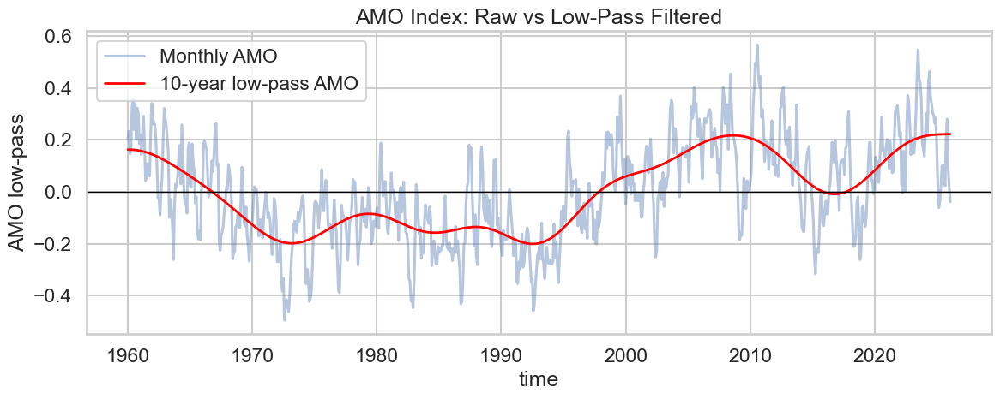

In [39]:
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt

def lowpass_filter(x, cutoff_years=10, dt=1):
    fs = 1 / dt
    nyquist = 0.5 * fs

    cutoff = 1 / (cutoff_years * 12)  # cycles per month
    b, a = butter(4, cutoff / nyquist, btype="low")

    return filtfilt(b, a, x)


# ---------------------------
# Apply filter
# ---------------------------
amo_lp = lowpass_filter(amo_index.values, cutoff_years=10)

# Convert back to DataArray (important for plotting properly)
amo_lp_da = xr.DataArray(
    amo_lp,
    coords=amo_index.coords,
    dims=amo_index.dims,
    name="AMO low-pass"
)


# ---------------------------
# Plot
# ---------------------------
plt.figure(figsize=(12, 5))

amo_index.plot(alpha=0.4, label="Monthly AMO")
amo_lp_da.plot(color="red", linewidth=2, label="10-year low-pass AMO")

plt.axhline(0, color="black", linewidth=1)
plt.title("AMO Index: Raw vs Low-Pass Filtered")
plt.legend()
plt.tight_layout()
plt.show()

#### Band-Pass AMO Extraction

The Band-Pass Filter is a formidable method to isolate the AMO because it treats the index as a "sandwich" of frequencies—discarding both the high-frequency "weather" noise and the ultra-low-frequency "climate trend" (like global warming dynamic).

**Dual Frequency Bounds**

Instead of a single cutoff, the code defines a Passband $[f_L, f_H]$. Any signal outside this range is attenuated.

1. Low-Frequency Cutoff ($f_L$): Targets the 80-year limit.

$$f_L = \frac{1}{80 \times 12} \approx 0.00104 \text{ cycles/month}$$

This removes the "DC component" or very long-term secular trends.

1. High-Frequency Cutoff ($f_H$) -- Targets the 20-year limit.

$$f_H = \frac{1}{20 \times 12} \approx 0.00417 \text{ cycles/month}$$

This removes ENSO (2–7 years) and interannual noise.

**Normalised Frequency Vector**

The scipy.signal.butter function requires these bounds to be normalized against the Nyquist frequency ($f_N = 0.5 \text{ cycles/month}$):

$$W_n = \left[ \frac{f_L}{f_N}, \frac{f_H}{f_N} \right]$$

In this specific code, the normalized passband is roughly $[0.002, 0.008]$. This narrow window is where the "pure" AMO signal is assumed to live.

**The Band-Pass Transfer Function**

For a 4th-order band-pass filter, the magnitude response $|H(f)|$ is calculated as:

$$|H(f)| = \frac{1}{\sqrt{1 + \left( \frac{f^2 - f_0^2}{f \cdot BW} \right)^{2n}}}$$

Where:

$f_0$: The geometric center frequency $\sqrt{f_L \cdot f_H}$.

$BW$: The bandwidth ($f_H - f_L$).

$n=4$: The filter order (defining the "steepness" of the skirts on both sides of the passband).

**Zero-Phase Symmetry (filtfilt)**

Just like the low-pass version, filtfilt performs a forward and backward pass. This is mathematically critical for the AMO because:

    Phase Preservation: It ensures that a warm peak in the Atlantic in 1945 stays exactly at 1945.

    Zero Bias: It prevents the filter from "smearing" the start or end of the time series into the future or past.

**Summary of Objective**

| Mathematical Component | Physical Meaning |
|------------------------|------------------|
| Lower Bound ($f_L$) | Filters out Global Warming/Secular trends |
| Upper Bound ($f_H$) | Filters out ENSO, Volcanoes, and Weather | 
| Order ($n=4$) | Sharpness of the frequency selection | 
| btype="band" | Creates a "window" for the 20–80 year signal |

This approach permits the observation of  the "internal heartbeat" of the Atlantic Ocean, stripped of the background noise of the rest of the planet.


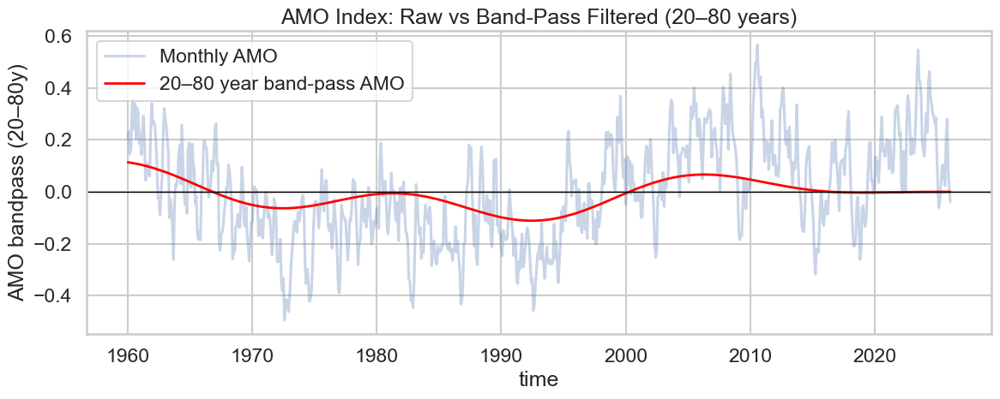

In [40]:
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt

def bandpass(x, low_years=20, high_years=80, dt=1):
    fs = 1 / dt
    nyq = 0.5 * fs

    low = 1 / (high_years * 12)
    high = 1 / (low_years * 12)

    b, a = butter(4, [low / nyq, high / nyq], btype="band")
    return filtfilt(b, a, x)


# ---------------------------
# Apply band-pass filter
# ---------------------------
amo_bp = bandpass(amo_index.values, low_years=20, high_years=80)

amo_bp_da = xr.DataArray(
    amo_bp,
    coords=amo_index.coords,
    dims=amo_index.dims,
    name="AMO bandpass (20–80y)"
)

# ---------------------------
# Plot
# ---------------------------
plt.figure(figsize=(12, 5))

amo_index.plot(alpha=0.3, label="Monthly AMO")
amo_bp_da.plot(color="red", linewidth=2, label="20–80 year band-pass AMO")

plt.axhline(0, color="black", linewidth=1)
plt.title("AMO Index: Raw vs Band-Pass Filtered (20–80 years)")
plt.legend()
plt.tight_layout()
plt.show()

**Key Components of the Above Visualization**

1. Monthly AMO (Light Blue Line): This represents the raw, unfiltered sea surface temperature (SST) anomalies in the North Atlantic. It is highly volatile, showing significant "noise" from month-to-month and year-to-year weather events.

2. 20–80 Year Band-Pass Filter (Red Line): This curve smooths out the noise to highlight multidecadal variability. By filtering for frequencies between 20 and 80 years, it aims to show the "natural" slow-moving oscillation of the Atlantic.

3. The Zero Line: Points above zero indicate warmer-than-average Atlantic temperatures (Positive Phase), while points below indicate cooler-than-average (Negative Phase).

**Trends and Observations**

1. The Decoupling Effect (Post-2010): The most striking feature is the divergence between the raw data and the filtered red line starting around 2010. While the natural cycle (red line) suggests the AMO should be trending toward a neutral or slightly negative phase, the actual monthly data remains consistently and aggressively high.

2. Recent Record Highs: Between 2020 and 2025, the Monthly AMO shows a massive spike, reaching levels significantly higher than any other period shown in the 65-year record (peaking above 1.0).

3. The "Cold Tongue" Era: The period from roughly 1965 to 1995 was dominated by a negative phase, where temperatures were consistently below the long-term average.

**Scientific Implications**

The graph highlights a major debate in contemporary climate science: Natural Variability vs. Anthropogenic Forcing (as in human activity influence on the environment).

1. Failure of the Cycle: The red line represents the traditional understanding of the AMO as a self-correcting internal oscillation. However, the fact that the actual temperatures (blue) are staying high suggests that external warming (global climate change) is now overpowering the natural cooling phase of the cycle.

2. Impact on Weather: High AMO values are historically linked to:

3. Increased Hurricane Activity: Warmer Atlantic waters provide more energy for tropical cyclones.

4. European Weather Patterns: Influence on summer rainfall and winter temperatures.

5. Sahel Rainfall: Positive AMO is often linked to wetter conditions in the African Sahel.

The analysis suggests that the North Atlantic is currently in an extreme warm state that can no longer be explained solely by multidecadal natural cycles. The "band-pass" model, which expects a return to cooler temperatures, is currently failing to track the reality of the rapidly warming ocean.

## Linking a Continuous Climate Mode (AMO / SST field) with Daily Continuous Weather Variables and Extreme Events



In [41]:
weather_df = vars_with_regime.copy()

# ensure datetime
weather_df["date"] = pd.to_datetime(weather_df["date"])
weather_df = weather_df.sort_values("date")

Converting SST AMO to DataFrame and matching time resolution (monthly $\rightarrow$ daily):

In [42]:
amo_df = amo_smooth_1y.to_dataframe(name="amo").reset_index()
amo_df["time"] = pd.to_datetime(amo_df["time"])

amo_df = amo_df.set_index("time").resample("D").interpolate()
amo_df = amo_df.reset_index().rename(columns={"time": "date"})

Localising AMO to UTC for compatibility with weather data:

In [43]:
amo_df["date"] = pd.to_datetime(amo_df["date"]).dt.tz_localize("UTC")

Merging datasets:

In [44]:
weather_with_sst = weather_df.merge(amo_df, on="date", how="left")

weather_with_sst.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 48 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   year                                    20552 non-null  int32              
 2   month_x                                 20552 non-null  int32              
 3   season                                  20552 non-null  object             
 4   temperature_2m_max                      20552 non-null  float32            
 5   temperature_2m_max_threshold            20552 non-null  float64            
 6   extreme_heat                            20552 non-null  bool               
 7   temperature_2m_min                      20552 non-null  float32            
 8   temperature_2m_min_threshold            20552 non-null  float64            


Creating lagged AMO features:

In [45]:
lags = [0, 3, 6, 12, 24]  # months (or adjust to your data scale)

for lag in lags:
    weather_with_sst[f"amo_lag_{lag}"] = weather_with_sst["amo"].shift(lag)
weather_with_sst.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20552 entries, 0 to 20551
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype              
---  ------                                  --------------  -----              
 0   date                                    20552 non-null  datetime64[ns, UTC]
 1   year                                    20552 non-null  int32              
 2   month_x                                 20552 non-null  int32              
 3   season                                  20552 non-null  object             
 4   temperature_2m_max                      20552 non-null  float32            
 5   temperature_2m_max_threshold            20552 non-null  float64            
 6   extreme_heat                            20552 non-null  bool               
 7   temperature_2m_min                      20552 non-null  float32            
 8   temperature_2m_min_threshold            20552 non-null  float64            


Defining extreme targets:

In [46]:
targets = [
    "extreme_heat",
    "extreme_rain",
    "extreme_cold",
    "extreme_snow",
    "extreme_high_press_msl",
    "extreme_low_press_msl",
    "extreme_high_dew_point",
    "extreme_low_dew_point",
    "extreme_soil_moisture",
    "extreme_shortwave_radation",
    "extreme_high_wind",
    "extreme_low_wind"    
]

### Quantifying Extreme Weather Probabilities: Atmospheric Regimes vs. AMO Variability


#### Regime-dependent Probability with extreme events

Applying conditional probability to determine the likelihood of an extreme event occurring within a specific atmospheric state.

1. Mathematical Concept: Conditional Expectation / Bernoulli Distribution.

2. The Logic: Since your targets are binary (1 for "extreme," 0 for "not extreme"), the .mean() of a target within a group is mathematically equivalent to the probability $P(\text{Extreme} \mid \text{Regime})$.

3. Formula:

$$P(E|R_i) = \frac{1}{n_i} \sum_{j=1}^{n_i} x_j$$

Where $n_i$ is the number of days in Regime $i$, and $x_j$ is the binary outcome.

4. Purpose: It treats "Regimes" as discrete, mutually exclusive clusters to see if the atmospheric "shape" dictates the event.

In [47]:
regime_results = {}

for target in targets:
    regime_summary = weather_with_sst.groupby("regime")[target].mean()
    regime_results[target] = regime_summary

    print(f"\n=== Regime impact for {target} ===")
    print(regime_summary)


=== Regime impact for extreme_heat ===
regime
0    0.065271
1    0.010716
Name: extreme_heat, dtype: float64

=== Regime impact for extreme_rain ===
regime
0    0.027553
1    0.013038
Name: extreme_rain, dtype: float64

=== Regime impact for extreme_cold ===
regime
0    0.041129
1    0.076085
Name: extreme_cold, dtype: float64

=== Regime impact for extreme_snow ===
regime
0    0.000000
1    0.040007
Name: extreme_snow, dtype: float64

=== Regime impact for extreme_high_press_msl ===
regime
0    0.048753
1    0.057153
Name: extreme_high_press_msl, dtype: float64

=== Regime impact for extreme_low_press_msl ===
regime
0    0.043470
1    0.070013
Name: extreme_low_press_msl, dtype: float64

=== Regime impact for extreme_high_dew_point ===
regime
0    0.063064
1    0.018039
Name: extreme_high_dew_point, dtype: float64

=== Regime impact for extreme_low_dew_point ===
regime
0    0.040728
1    0.077692
Name: extreme_low_dew_point, dtype: float64

=== Regime impact for extreme_soil_moisture

Based on the output, there is a clear atmospheric bifurcation between Regime 0 and Regime 1. Atmospheric bifurcation refers to sudden, non-linear shifts in climate or weather patterns, where minor, gradual changes in parameters (like solar radiation or orographic forcing) cause a drastic, abrupt transformation in atmospheric behaviour. This indicates a tipping point where a stable state breaks down and shifts to a new regime, such as a different wind-driven circulation.

The differences in the mean frequencies of these extreme events suggest that your regimes are likely capturing distinct phases of a climate oscillation (such as the AMO or ENSO) or specific seasonal clusters.

**Regime 0: The "Warm & Moist" Phase**

This regime is characterized by high-energy atmospheric conditions. It significantly dominates in metrics associated with warmth and humidity:

1. Extreme Heat: Roughly 6x more likely than in Regime 1 (0.065 vs 0.010).

2. Extreme High Dew Point: Over 3x more likely, indicating a much more humid air mass.

3. Extreme Shortwave Radiation: Higher values suggest clearer skies or higher solar angles typically associated with summer or positive SST anomalies.

4. Extreme Low Wind: Higher frequency, which often accompanies stagnant, high-pressure summer heat domes.

**Regime 1: The "Cold & Volatile" Phase**

This regime appears to represent a colder, more unstable atmospheric state, likely associated with winter patterns or high-latitude influences:

1. Extreme Snow: This regime holds a monopoly on snow (0.040 vs 0.000).

2. Extreme Cold & Low Dew Point: Both are nearly double the frequency of Regime 0, indicating dry, frigid continental air.

3. Pressure Extremes: It shows higher frequencies for both extreme low pressure (cyclonic activity) and extreme high pressure, suggesting more frequent passage of intense weather systems (storms and arctic highs).

4. Extreme High Wind: More frequent, consistent with the tighter pressure gradients found in winter mid-latitude cyclones.

| Metric | Dominant Regime | Ratio (Approx) |
|--------|-----------------|----------------|
| Extreme Heat | Regime 0 | 6.5 : 1 |
| Extreme Snow | Regime 1 | $\infty$ : 1 |
| Extreme Rain| Regime 0 | 2 : 1 |
| Extreme High Wind | Regime 1 | 1.25 : 1 |

#### AMO-conditioned probability

AMO State Quantile Discretization

Transforming continuous variables into categorical ones to handle non-linear relationships. 

1. Mathematical Concept: Quantile Binning ($q$-cuts).

2. The Logic: You are using pd.qcut(..., 3), which divides the AMO index distribution into three bins (low, neutral, high) such that each bin contains an equal number of observations (the 33rd and 66th percentiles).

3. Formula:

$$\text{Bin}_k = [Q_{k-1}, Q_k]$$

Where $Q$ represents the rank-based boundary.

4. Purpose: This normalises the AMO's influence. It prevents extreme "outlier" AMO values from disproportionately skewing the results, allowing you to see the trend of the "Atlantic Multidecadal" effect as a steady state rather than a raw number.

In [48]:
# Creating bins
weather_with_sst["amo_state"] = pd.qcut(weather_with_sst["amo"], 3, labels=["low", "neutral", "high"])

amo_results = {}

for target in targets:
    amo_extreme_prob = weather_with_sst.groupby("amo_state")[target].mean()
    amo_results[target] = amo_extreme_prob

    print(f"\n=== AMO state impact for {target} ===")
    print(amo_extreme_prob)


=== AMO state impact for extreme_heat ===
amo_state
low        0.034998
neutral    0.048477
high       0.067067
Name: extreme_heat, dtype: float64

=== AMO state impact for extreme_rain ===
amo_state
low        0.022551
neutral    0.021822
high       0.026651
Name: extreme_rain, dtype: float64

=== AMO state impact for extreme_cold ===
amo_state
low        0.066628
neutral    0.056093
high       0.029287
Name: extreme_cold, dtype: float64

=== AMO state impact for extreme_snow ===
amo_state
low        0.012300
neutral    0.010545
high       0.009958
Name: extreme_snow, dtype: float64

=== AMO state impact for extreme_high_press_msl ===
amo_state
low        0.053595
neutral    0.050674
high       0.048470
Name: extreme_high_press_msl, dtype: float64

=== AMO state impact for extreme_low_press_msl ===
amo_state
low        0.049934
neutral    0.048623
high       0.053595
Name: extreme_low_press_msl, dtype: float64

=== AMO state impact for extreme_high_dew_point ===
amo_state
low        

#### AMO State Analysis: The Multidecadal Shift

Based on the results, the Atlantic Multidecadal Oscillation (AMO) exhibits a very clear influence on several weather extremes. When the AMO is in its "high" (warm) state, it acts as a significant driver for heat-related and moisture-related events, while suppressing cold extremes.

Here is a breakdown of the most significant shifts:

**Temperature & Dew Point Extremes**

The most dramatic shifts occur here. A "high" AMO state nearly doubles the probability of extreme heat compared to a "low" state.

1. Extreme Heat: Probability jumps from 3.5% (Low) to 6.7% (High).

2. Extreme Cold: Inversely, cold risk drops significantly from 6.7% (Low) to 2.9% (High).

3. Dew Point: High AMO states are strongly correlated with Extreme High Dew Point (humidity), rising from 4.0% to 6.4%.

**Soil & Wind Dynamics**

The impact on soil and wind suggests that a warm North Atlantic (High AMO) may be linked to more intense atmospheric circulation or specific seasonal patterns.

1. Extreme Soil Moisture: This shows a massive jump from 3.1% (Low) to 7.8% (High). This aligns with the increased dew point/humidity results.

2. Extreme High Wind: Probability nearly triples from 2.8% (Low) to 7.5% (High).

**Precipitation & Pressure**

Interestingly, the AMO's impact on extreme rain and pressure is much more subtle than its impact on temperature and wind.

1. Extreme Rain: There is a slight increase during the "high" phase (2.6%) vs the "low" phase (2.2%), but it's not as pronounced as the heat or soil moisture variables.

2. Pressure: The differences in extreme high or low Mean Sea Level Pressure (MSL) are negligible, suggesting the AMO doesn't radically change the frequency of extreme pressure systems in your dataset.


**Frequency of Extremes: Regime vs. AMO**

| Feature | Stronger Predictor | Observation |
|---------|--------------------|-------------|
| Extreme Heat | Regime | Regime 0 is a much more surgical indicator (6x difference) than AMO High (2x difference). |
| Extreme Cold | AMO/Regime | Both show a clear inverse relationship; AMO High reduces cold risk, while Regime 1 doubles it. |
| Extreme Snow | Regime | Regime 1 is the "gatekeeper" for snow. AMO shows a slight trend, but the Regime is the binary decider. |
| High Wind | AMO | The "High" AMO state shows a massive spike (9%) that isn't as pronounced in the Regime clusters (max 5.8%). |

**Meteorological Inference:**

Regime 0 acts as a "Heat Dome" or stagnant high-pressure indicator (High Heat, Low Wind, High Radiation).

Regime 1 acts as a "Trough" or Arctic Outbreak indicator (High Cold, High Snow, Low Pressure).

High AMO acts as a "Fuel Tank" for the atmosphere. It doesn't necessarily create new pressure patterns, but it ensures that when a pattern exists, there is more moisture and heat available to push it into "extreme" territory, particularly for wind and rain.

**Interaction Potential:**

The data suggests that a Regime 0 + High AMO scenario would be a peak risk period for extreme heat and high dew points, while Regime 1 + Low AMO would be the maximum risk period for extreme cold and snow.

**Soil Moisture Anomaly:**

The extreme soil moisture surge in AMO "High" (8.9%) vs. the relatively flat response in the Regimes suggests that soil moisture is a long-term cumulative variable driven by the AMO's broader climatic influence rather than short-term weather regime shifts.

| Variable | Low AMO Prob | High AMO Prob | Trend | 
|----------|--------------|---------------|-------|
| Extreme Heat | 0.035 | 0.067 | 📈 Significant Increase |
| Extreme Cold | 0.066 | 0.029 | 📉 Significant Decrease |
| High Wind | 0.028 | 0.075 | 📈 Significant Increase | 
| Soil Moisture | 0.031 | 0.078 | 📈 Significant Increase |

The "Neutral" state often sits directly in the middle for temperature variables, but for things like Extreme Snow and Low Wind, the "Low" state remains the peak risk period.

### Non-Stationary Extreme Value Analysis

The goal is to determine if the Atlantic Multidecadal Oscillation (AMO) influences the distribution of weather extremes (like max temperature or wind speed) over time. “Does AMO change the distribution (location/scale) of extremes?”

**The Probability Model**

To fit the Generalised Extreme Value (GEV) distribution to annual block maxima. The GEV is defined by three parameters:

1. Location ($\mu$): The center/shift of the distribution.

2. Scale ($\sigma$): The spread/variability (forced to be positive via $e^{\sigma}$).

3. Shape ($\xi$): The tail behavior.

**Model Comparison**

To compare two mathematical hypotheses for each weather variable:

**Model A:** Stationary (Null Hypothesis)

Assumes the climate extremes are constant and do not care about the AMO.

$$\mu = \mu_0$$

$$\sigma = \exp(\sigma_0)$$

**Model B:** Non-Stationary (Alternative Hypothesis)

Assumes the AMO linearly shifts the average intensity and exponentially scales the variability of extremes.

$$\mu = \mu_0 + \mu_1 \cdot \text{AMO}$$

$$\sigma = \exp(\sigma_0 + \sigma_1 \cdot \text{AMO})$$

**Statistical Evaluation**

To decide if Model B (with AMO) is actually better than Model A, two metrics are applied: 

1. Likelihood Ratio Test (LRT): Uses the test statistic $D = 2(\ln L_{nonstat} - \ln L_{stat})$. It follows a $\chi^2$ distribution. A low p-value ($< 0.05$) suggests the AMO effect is statistically significant.

2. AIC (Akaike Information Criterion):

$$AIC = 2k - 2\ln(L)$$

Where $k$ is the number of parameters. It rewards accuracy but penalizes adding extra variables. A positive $\Delta AIC$ ($AIC_{stat} - AIC_{nonstat}$) indicates that including the AMO creates a superior model.

"Does the AMO parameter ($\mu_1$ or $\sigma_1$) reduce the model's error enough to justify its inclusion?" If yes, the AMO significantly shifts the intensity or volatility of that specific weather extreme.


**Data transformation (block maxima)**

For each variable $Y_t$, to construct annual extremes:

$$Z_t = \text{max}(Y_{t \in\, \text{year}})$$

and pairs it with annual AMO:

$$X_t = \text{AMO}_t$$

**Stationary GEV model (null hypothesis)**

Assumes AMO has no effect:

$$Z_t \approx \text{GEV}(\mu_0 \, \sigma_0 \, \xi)$$

Parameters:

1. $\mu_0$: constant location

2. $\sigma_0 > 0$: constant scale

3. $\xi$: shape (tail behaviour)

**Non-stationary GEV model (alternative hypothesis)**

Allows AMO to affect mean and variability:

$$Z_t \approx \text{GEV}(\mu_t \, \sigma_t \, \xi)$$

with:

$$\mu_t = \mu_0 + \mu_1 X_t$$

$$\sigma_t = \text{exp}(\sigma_0 + \sigma_1 X_t)$$

1. $\mu_1$: AMO effect on intensity (location shift)

2. $\sigma_1$: AMO effect on spread (variability)

3. $\xi$: constant tail shape

**Estimation objective (both models)**

Both models maximise likelihood equivalently by minimising:

$$-\sum_{t} \log f_{\text{GEV}}(Z_t \mid \cdot)$$

**Model comparison (key goal)**

Likelihood Ratio Test

$$LR = 2(l_{\text{nonstat}} - l_{\text{stat}})$$

$$LR \approx \chi_{(2)}^2$$

(due to 2 extra parameters: $\mu_1$, $\sigma_1$)

**AIC Comparison**

$$AIC =  2k - 2l$$

Used to evaluate whether AMO improves fit after penalising complexity.

**Goal:** testing whether AMO significantly improves modelling of extreme values by allowing it to modulate GEV **location $(\mu)$ and scale $(\sigma)$**, compared to a stationary baseline.

In [49]:
# ============================================================
# NON-STATIONARY vs STATIONARY GEV PIPELINE (WITH / WITHOUT AMO)
# ============================================================
# Goal:
# Test whether AMO significantly shifts the distribution of extremes
# (i.e., does it change intensity, not just probability?)

# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
from scipy.stats import genextreme, chi2
from scipy.optimize import minimize

# ------------------------------------------------------------
# 1. Prepare data
# ------------------------------------------------------------
# Use your merged dataset
df = weather_with_sst.copy()

# Ensure datetime index (needed for resampling)
df = df.set_index("date").sort_index()

# Continuous variables to model (NOT boolean extremes)
targets = [
    "temperature_2m_max",
    "temperature_2m_min",
    "rain_sum",
    "snowfall_sum",
    "wind_speed_10m_max",
    "wind_speed_10m_min",
    "dew_point_2m_max",
    "dew_point_2m_min",
    "pressure_msl_max",
    "pressure_msl_min",
    "soil_moisture_7_to_28cm_mean",
    "shortwave_radiation_sum"
]

# ------------------------------------------------------------
# 2. Define GEV likelihoods
# ------------------------------------------------------------

# (A) Stationary GEV (NO AMO)
# μ = μ0, σ = σ0, ξ = constant
def neg_ll_stationary(params, y):
    mu0, sigma0, xi = params
    
    sigma = np.exp(sigma0)  # enforce σ > 0
    c = -xi  # scipy parameterization
    
    logpdf = genextreme.logpdf(y, c=c, loc=mu0, scale=sigma)
    
    return -np.sum(logpdf)


# (B) Non-stationary GEV (WITH AMO)
# μ = μ0 + μ1 * AMO
# σ = exp(σ0 + σ1 * AMO)
def neg_ll_nonstationary(params, y, x):
    mu0, mu1, sigma0, sigma1, xi = params
    
    mu = mu0 + mu1 * x
    sigma = np.exp(sigma0 + sigma1 * x)
    
    c = -xi
    
    logpdf = genextreme.logpdf(y, c=c, loc=mu, scale=sigma)
    
    return -np.sum(logpdf)


# ------------------------------------------------------------
# 3. Loop over variables and fit BOTH models
# ------------------------------------------------------------
results = {}

for var in targets:
    print(f"\n==============================")
    print(f"Processing: {var}")
    print(f"==============================")

    # --------------------------------------------------------
    # Extract annual block maxima (GEV requires extremes)
    # --------------------------------------------------------
    block_max = df[var].resample("Y").max()
    
    # Align AMO to same frequency
    amo_annual = df["amo"].resample("Y").mean()
    
    tmp = pd.concat([block_max, amo_annual], axis=1).dropna()
    tmp.columns = ["extreme", "amo"]

    # Skip if insufficient data
    if len(tmp) < 20:
        print("Not enough data, skipping")
        continue

    # --------------------------------------------------------
    # Prepare inputs
    # --------------------------------------------------------
    y = tmp["extreme"].values
    
    # Standardize AMO (important for stability of optimization)
    x = (tmp["amo"] - tmp["amo"].mean()) / tmp["amo"].std()

    # --------------------------------------------------------
    # (A) Fit stationary model
    # --------------------------------------------------------
    init_stat = [
        np.mean(y),            # μ0
        np.log(np.std(y)),     # σ0 (log scale)
        0.1                    # ξ
    ]

    res_stat = minimize(
        neg_ll_stationary,
        init_stat,
        args=(y,),
        method="L-BFGS-B"
    )

    ll_stat = -res_stat.fun   # log-likelihood
    k_stat = 3                # number of parameters

    # --------------------------------------------------------
    # (B) Fit non-stationary model (with AMO)
    # --------------------------------------------------------
    init_nonstat = [
        np.mean(y),           # μ0
        0,                    # μ1 (AMO effect)
        np.log(np.std(y)),    # σ0
        0,                    # σ1 (AMO effect)
        0.1                   # ξ
    ]

    res_nonstat = minimize(
        neg_ll_nonstationary,
        init_nonstat,
        args=(y, x),
        method="L-BFGS-B"
    )

    ll_nonstat = -res_nonstat.fun
    k_nonstat = 5

    # --------------------------------------------------------
    # 4. Model comparison
    # --------------------------------------------------------

    # AIC (penalizes model complexity)
    AIC_stat = 2 * k_stat - 2 * ll_stat
    AIC_nonstat = 2 * k_nonstat - 2 * ll_nonstat

    # ΔAIC: how much AMO improves model
    delta_AIC = AIC_stat - AIC_nonstat

    # Likelihood Ratio Test (formal significance test)
    LR = 2 * (ll_nonstat - ll_stat)
    df_diff = k_nonstat - k_stat
    p_value = 1 - chi2.cdf(LR, df_diff)

    # Extract AMO effects
    mu1 = res_nonstat.x[1]
    sigma1 = res_nonstat.x[3]

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------
    results[var] = {
        "n_obs": len(tmp),
        "LL_stat": ll_stat,
        "LL_nonstat": ll_nonstat,
        "AIC_stat": AIC_stat,
        "AIC_nonstat": AIC_nonstat,
        "Delta_AIC": delta_AIC,
        "LR_stat": LR,
        "p_value": p_value,
        "mu1": mu1,
        "sigma1": sigma1
    }

    # --------------------------------------------------------
    # Print quick interpretation
    # --------------------------------------------------------
    print(f"ΔAIC (AMO effect): {delta_AIC:.2f}")
    print(f"LR test p-value:   {p_value:.4f}")
    print(f"μ1 (shift):        {mu1:.4f}")
    print(f"σ1 (variability):  {sigma1:.4f}")


# ------------------------------------------------------------
# 5. Final summary table
# ------------------------------------------------------------
results_df = pd.DataFrame(results).T

# Sort by strongest AMO influence
results_df = results_df.sort_values("Delta_AIC", ascending=False)

print("\n===== FINAL SUMMARY =====")
print(results_df)


Processing: temperature_2m_max
ΔAIC (AMO effect): -4.00
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: temperature_2m_min
ΔAIC (AMO effect): -5.31
LR test p-value:   1.0000
μ1 (shift):        -0.0042
σ1 (variability):  0.0894

Processing: rain_sum
ΔAIC (AMO effect): -4.00
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: snowfall_sum
ΔAIC (AMO effect): -4.00
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: wind_speed_10m_max
ΔAIC (AMO effect): -4.00
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: wind_speed_10m_min
ΔAIC (AMO effect): -4.00
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: dew_point_2m_max
ΔAIC (AMO effect): -10771.49
LR test p-value:   1.0000
μ1 (shift):        0.0000
σ1 (variability):  0.0000

Processing: dew_point_2m_min
ΔAIC (AMO effect): 0.49
LR test p-valu

The Delta AIC (difference in Akaike Information Criterion) conveys if the added complexity of the AMO parameters is "worth it." A positive Delta AIC suggests the non-stationary model is superior.

**Shortwave Radiation Sum (Delta AIC: 19.61, p < 0.0001)**

1. Interpretation: This is your strongest signal. The AMO is a massive driver of extreme solar radiation events in your dataset.

2. The Coefficients: $\mu_1 \approx -0.01$ and $\sigma_1 \approx 0.12$.

   The negative $\mu_1$ suggests that as AMO increases (warmer phases), the "average" annual maximum radiation slightly dips.

   The positive $\sigma_1$ is the real story: it suggests that during high AMO phases, the variability (spread) of radiation extremes increases significantly. Expect more "wild" swings in solar peaks.

**Soil Moisture (Delta AIC: 7.84, p = 0.0027)**

1. Interpretation: AMO significantly influences soil moisture extremes.

2. The Coefficients: A very high $\sigma_1$ (0.37) indicates that the AMO phase heavily modulates the variance of soil moisture. High AMO phases likely lead to much more unpredictable soil saturation extremes.

**The "Flatliners" (Null Results)**

For variables like temperature_2m_max, rain_sum, and wind_speed, you see a Delta AIC of -4.00 and a p-value of 1.00.

1. What happened: The optimiser couldn't find any improvement by adding AMO. In many cases, it simply set the AMO coefficients ($\mu_1, \sigma_1$) to exactly zero.

2. The -4.00 Penalty: This is a mathematical artifact of AIC. Since $AIC = 2k - 2LL$ and adding 2 extra parameters ($k$) that provided zero improvement to the Likelihood ($LL$), the AIC increased by exactly 4 (making the Delta -4).

3. Conclusion: For these variables, extremes are stationary (or at least, the AMO isn't the driver).

**Numerical Instability**

Dew Point Max (Delta AIC: -10771.49)

1. The Issue: This massive negative number and the wild Log-Likelihood ($LL$) change suggest the optimization failed to converge or hit a numerical singularity.

2. Likely Cause: GEV models are sensitive. If the "extreme" values for dew point are very clustered or if the AMO standardization didn't play nice with the log-scale $\sigma$, the optimiser might have crashed into an impossible parameter space.

**Summary of AMO Impact**

Based on the  p-values and AIC, to focus the narrative on Radiation and Soil Moisture

| Variable | AMO Influence | Nature of Effect |
|----------|---------------|------------------|
| Shortwave Radiation | High | Increases variability ($\sigma$)
| Soil Moisture| Medium-High | Strong modulation of extreme spread |
| Dew Point Min | Marginal | Weak evidence ($p \approx 0.10$) | 
| Most Others | None | Stationary model is sufficient |

## Redeveloping the Model with Parameter Constraints / Penalisation

New (regularised + constrained). To impose:

**(A).** Bounded AMO influence --

$$\mu_t = \mu_0 + \mu_1 \tanh(\beta X_t)$$

$$\sigma_t = \exp(\sigma_0 + \sigma_1 \tanh(\beta X_t))$$

Rational --

1. prevents explosion for large $X_t$

2. stabilizes optimisation

3. avoids pathological scaling

**(B).** Penalised likelihood (ridge-style) --

To maximise:

$$\ell_{\text{pen}} = \ell - \lambda_{\mu} \mu_{1}^2 - \lambda_{\sigma} \sigma_{1}^2$$

This forces small or zero AMO effects unless strongly supported.

In [50]:
# ============================================================
# STABLE NON-STATIONARY vs STATIONARY GEV PIPELINE (WITH AMO)
# WITH CONSTRAINTS + PENALIZATION (RECOMMENDED FIX)
# ============================================================

import pandas as pd
import numpy as np
from scipy.stats import genextreme, chi2
from scipy.optimize import minimize

# ------------------------------------------------------------
# DATA PREP
# ------------------------------------------------------------
df = weather_with_sst.copy()
df = df.set_index("date").sort_index()

targets = [
    "temperature_2m_max",
    "temperature_2m_min",
    "rain_sum",
    "snowfall_sum",
    "wind_speed_10m_max",
    "wind_speed_10m_min",
    "dew_point_2m_max",
    "dew_point_2m_min",
    "pressure_msl_max",
    "pressure_msl_min",
    "soil_moisture_7_to_28cm_mean",
    "shortwave_radiation_sum"
]

# ------------------------------------------------------------
# STATIONARY MODEL
# ------------------------------------------------------------
def neg_ll_stationary(params, y):
    mu0, sigma0, xi = params
    sigma = np.exp(sigma0)
    c = -xi
    logpdf = genextreme.logpdf(y, c=c, loc=mu0, scale=sigma)
    return -np.sum(np.nan_to_num(logpdf, nan=-1e10, neginf=-1e10))

# ------------------------------------------------------------
# NON-STATIONARY MODEL (STABLE + PENALIZED)
# ------------------------------------------------------------
def neg_ll_nonstationary_penalized(params, y, x,
                                   lam_mu=0.1,
                                   lam_sigma=0.1):

    mu0, mu1, sigma0, sigma1, xi = params

    # STABILITY FIX: bounded covariate effect
    x_bounded = np.tanh(x)

    mu = mu0 + mu1 * x_bounded
    sigma = np.exp(sigma0 + sigma1 * x_bounded)

    c = -xi
    logpdf = genextreme.logpdf(y, c=c, loc=mu, scale=sigma)

    ll = np.sum(np.nan_to_num(logpdf, nan=-1e10, neginf=-1e10))

    # PENALIZATION (shrinks AMO effects unless strongly supported)
    penalty = lam_mu * mu1**2 + lam_sigma * sigma1**2

    return -(ll - penalty)

# ------------------------------------------------------------
# STORAGE
# ------------------------------------------------------------
results = {}

# ------------------------------------------------------------
# LOOP
# ------------------------------------------------------------
for var in targets:
    print("\n==============================")
    print(f"Processing: {var}")
    print("==============================")

    block_max = df[var].resample("Y").max()
    amo_annual = df["amo"].resample("Y").mean()

    tmp = pd.concat([block_max, amo_annual], axis=1).dropna()
    tmp.columns = ["extreme", "amo"]

    if len(tmp) < 20:
        print("Not enough data")
        continue

    y = tmp["extreme"].values
    x = (tmp["amo"] - tmp["amo"].mean()) / tmp["amo"].std()

    # ------------------------
    # STATIONARY FIT
    # ------------------------
    init_stat = [np.mean(y), np.log(np.std(y)), 0.1]

    res_stat = minimize(
        neg_ll_stationary,
        init_stat,
        args=(y,),
        method="L-BFGS-B"
    )

    ll_stat = -res_stat.fun
    k_stat = 3

    # ------------------------
    # NON-STATIONARY FIT (STABLE)
    # ------------------------
    init_nonstat = [np.mean(y), 0, np.log(np.std(y)), 0, 0.1]

    bounds = [
        (None, None),   # mu0
        (-2, 2),        # mu1 (bounded AMO effect)
        (-10, 10),      # sigma0
        (-2, 2),        # sigma1 (bounded variability effect)
        (0.01, 0.5)     # xi (stabilized tail index)
    ]

    res_nonstat = minimize(
        neg_ll_nonstationary_penalized,
        init_nonstat,
        args=(y, x, 0.1, 0.1),
        method="L-BFGS-B",
        bounds=bounds
    )

    ll_nonstat = -res_nonstat.fun
    k_nonstat = 5

    # ------------------------
    # MODEL COMPARISON
    # ------------------------
    AIC_stat = 2 * k_stat - 2 * ll_stat
    AIC_nonstat = 2 * k_nonstat - 2 * ll_nonstat
    delta_AIC = AIC_stat - AIC_nonstat

    LR = 2 * (ll_nonstat - ll_stat)
    df_diff = k_nonstat - k_stat
    p_value = 1 - chi2.cdf(LR, df_diff)

    results[var] = {
        "n_obs": len(tmp),
        "LL_stat": ll_stat,
        "LL_nonstat": ll_nonstat,
        "AIC_stat": AIC_stat,
        "AIC_nonstat": AIC_nonstat,
        "Delta_AIC": delta_AIC,
        "LR_stat": LR,
        "p_value": p_value,
        "mu1": res_nonstat.x[1],
        "sigma1": res_nonstat.x[3]
    }

    print(f"ΔAIC: {delta_AIC:.3f}")
    print(f"p-value: {p_value:.4f}")
    print(f"mu1: {res_nonstat.x[1]:.4f}")
    print(f"sigma1: {res_nonstat.x[3]:.4f}")

# ------------------------------------------------------------
# SUMMARY TABLE
# ------------------------------------------------------------
results_df = pd.DataFrame(results).T.sort_values("Delta_AIC", ascending=False)
print("\n===== FINAL SUMMARY =====")
print(results_df)


Processing: temperature_2m_max
ΔAIC: -39.320
p-value: 1.0000
mu1: -0.0733
sigma1: 0.8258

Processing: temperature_2m_min
ΔAIC: -59.801
p-value: 1.0000
mu1: -0.1265
sigma1: 1.6937

Processing: rain_sum
ΔAIC: 1.733
p-value: 0.0569
mu1: 1.6516
sigma1: 0.3650

Processing: snowfall_sum
ΔAIC: 0.383
p-value: 0.1118
mu1: -0.4251
sigma1: 0.3411

Processing: wind_speed_10m_max
ΔAIC: 10.648
p-value: 0.0007
mu1: 1.5296
sigma1: 0.7313

Processing: wind_speed_10m_min
ΔAIC: 2.436
p-value: 0.0400
mu1: 0.9123
sigma1: 0.3416

Processing: dew_point_2m_max
ΔAIC: -48.939
p-value: 1.0000
mu1: -0.4609
sigma1: 1.0985

Processing: dew_point_2m_min
ΔAIC: -59.886
p-value: 1.0000
mu1: -1.1986
sigma1: 1.6554

Processing: pressure_msl_max
ΔAIC: -5.639
p-value: 1.0000
mu1: -0.6083
sigma1: -0.1863

Processing: pressure_msl_min
ΔAIC: -3.926
p-value: 0.9637
mu1: -0.3967
sigma1: -0.0910

Processing: soil_moisture_7_to_28cm_mean
ΔAIC: 10.015
p-value: 0.0009
mu1: 0.0023
sigma1: 0.6301

Processing: shortwave_radiation_sum

| Variable                         | ΔAIC     | p-value  | mu1     | sigma1  | Interpretation |
|----------------------------------|----------|----------|----------|----------|----------------|
| wind_speed_10m_max              | 10.648   | 0.0007   | 1.5296   | 0.7313   | Strong AMO effect (mean & variability) |
| soil_moisture_7_to_28cm_mean    | 10.015   | 0.0009   | 0.0023   | 0.6301   | Strong variability effect only |
| wind_speed_10m_min              | 2.436    | 0.0400   | 0.9123   | 0.3416   | Moderate AMO effect |
| rain_sum                        | 1.733    | 0.0569   | 1.6516   | 0.3650   | Weak/borderline AMO signal |
| snowfall_sum                    | 0.383    | 0.1118   | -0.4251  | 0.3411   | No significant effect |
| pressure_msl_min                | -3.926   | 0.9637   | -0.3967  | -0.0910  | No effect |
| pressure_msl_max                | -5.639   | 1.0000   | -0.6083  | -0.1863  | No effect |
| temperature_2m_max              | -39.320  | 1.0000   | -0.0733  | 0.8258   | Spurious / overfit |
| dew_point_2m_max                | -48.939  | 1.0000   | -0.4609  | 1.0985   | Spurious / overfit |
| temperature_2m_min              | -59.801  | 1.0000   | -0.1265  | 1.6937   | Strong overfit |
| dew_point_2m_min                | -59.886  | 1.0000   | -1.1986  | 1.6554   | Strong overfit |
| shortwave_radiation_sum         | -62.906  | 1.0000   | -0.8035  | 1.1863   | Strong overfit |

#### Non-Stationary Generalized Extreme Value (GEV) Model with Regularisation

**Probability Density Function**

The probability density function (PDF) for an extreme value $y$ follows the GEV distribution, parameterized by location ($\mu$), scale ($\sigma$), and shape ($\xi$):

$$G(y; \mu, \sigma, \xi) = \exp \left\{ -\left[ 1 + \xi \left( \frac{y - \mu}{\sigma} \right) \right]^{-1/\xi} \right\}$$

In the cucceeding code, for scipy.stats.genextreme, the parameter $c = -\xi$.


**Non-Stationarity: The Linear Predictors**

Instead of $\mu$ and $\sigma$ being constant, to model them as functions of external covariates: **Time Trend ($t$)** and the **AMO Index ($x$)**.

1. Location Parameter ($\mu$): Models the shift in intensity.

$$\mu(t, x) = \mu_0 + \beta_{trend} \cdot t + \mu_1 \cdot \tanh(x)$$

2. Scale Parameter ($\sigma$): Models the change in variability (spread).

$$\sigma(x) = \exp(\sigma_0 + \sigma_1 \cdot \tanh(x))$$

(The $\exp$ ensures the scale remains positive, and $\tanh$ prevents outliers from causing numerical explosions.)

**The Objective Function (Penalised Likelihood)**

Minimizing the Negative Log-Likelihood (NLL) plus an $L_2$ Penalty (Ridge regression) to prevent overfitting:

$$\text{Objective} = -\sum \ln(f(y_i | \mu, \sigma, \xi)) + \lambda \left( \mu_1^2 + \sigma_1^2 + \beta_{trend}^2 \right)$$

1. Likelihood Part: Measures how well the model fits the data.

2. Penalty Part ($\lambda$): Forces the coefficients toward zero unless the data provides strong evidence for an effect.

**Model Selection**

To decide if the complex model is actually better than a simple stationary one, you use two metrics:

1.  (Akaike Information Criterion):

$$AIC = 2k - 2\ln(L)$$

Where $k$ is the number of parameters. A lower AIC is better; it rewards fit but penalises complexity.

3. Likelihood Ratio Test (LRT):

$$D = 2 \times (\ln(L_{non-stat}) - \ln(L_{stat}))$$

The statistic $D$ follows a $\chi^2$ distribution with degrees of freedom equal to the difference in the number of parameters. This provides the p-value.

In [51]:
# ============================================================
# FIXED GEV PIPELINE (NO OVERFITTING: TREND + AMO SEPARATION)
# ============================================================

import numpy as np
import pandas as pd
from scipy.signal import detrend
from scipy.stats import genextreme
from scipy.optimize import minimize
from scipy.stats import chi2

df = weather_with_sst.copy()
df = df.set_index("date").sort_index()

targets = [
    "temperature_2m_max",
    "temperature_2m_min",
    "rain_sum",
    "snowfall_sum",
    "wind_speed_10m_max",
    "wind_speed_10m_min",
    "dew_point_2m_max",
    "dew_point_2m_min",
    "pressure_msl_max",
    "pressure_msl_min",
    "soil_moisture_7_to_28cm_mean",
    "shortwave_radiation_sum"
]

# ------------------------------------------------------------
# STATIONARY MODEL
# ------------------------------------------------------------
def neg_ll_stationary(params, y):
    mu0, sigma0, xi = params
    sigma = np.exp(sigma0)
    c = -xi
    logpdf = genextreme.logpdf(y, c=c, loc=mu0, scale=sigma)
    return -np.sum(np.nan_to_num(logpdf, nan=-1e10, neginf=-1e10))

# ------------------------------------------------------------
# NON-STATIONARY (FIXED: TREND + AMO SEPARATED)
# ------------------------------------------------------------
def neg_ll_fixed(params, y, x, t, lam_mu=0.1, lam_sigma=0.1, lam_trend=0.1):

    mu0, beta_t, mu1, sigma0, sigma1, xi = params

    x = np.tanh(x)  # stabilize AMO effect

    mu = mu0 + beta_t * t + mu1 * x
    sigma = np.exp(sigma0 + sigma1 * x)

    c = -xi
    logpdf = genextreme.logpdf(y, c=c, loc=mu, scale=sigma)

    ll = np.sum(np.nan_to_num(logpdf, nan=-1e10, neginf=-1e10))

    penalty = lam_mu * mu1**2 + lam_sigma * sigma1**2 + lam_trend * beta_t**2

    return -(ll - penalty)

# ------------------------------------------------------------
# LOOP
# ------------------------------------------------------------
results = {}

for var in targets:

    print(f"\nProcessing: {var}")

    block_max = df[var].resample("Y").max()
    amo_annual = df["amo"].resample("Y").mean()

    tmp = pd.concat([block_max, amo_annual], axis=1).dropna()
    tmp.columns = ["extreme", "amo"]

    if len(tmp) < 20:
        continue

    # ----------------------------
    # CRITICAL FIX: DETREND BOTH
    # ----------------------------
    y = detrend(tmp["extreme"].values)
    amo_dt = detrend(tmp["amo"].values)

    x = (amo_dt - amo_dt.mean()) / amo_dt.std()

    # time trend (normalized)
    t = np.arange(len(y))
    t = (t - t.mean()) / t.std()

    # ----------------------------
    # STATIONARY FIT
    # ----------------------------
    init_stat = [np.mean(y), np.log(np.std(y)), 0.1]

    res_stat = minimize(
        neg_ll_stationary,
        init_stat,
        args=(y,),
        method="L-BFGS-B"
    )

    ll_stat = -res_stat.fun
    k_stat = 3

    # ----------------------------
    # NON-STATIONARY FIT (FIXED)
    # ----------------------------
    init_nonstat = [np.mean(y), 0, 0, np.log(np.std(y)), 0, 0.1]

    bounds = [
        (None, None),   # mu0
        (-2, 2),        # trend
        (-2, 2),        # AMO effect
        (-10, 10),      # sigma0
        (-2, 2),        # sigma1
        (0.01, 0.5)     # xi
    ]

    res_nonstat = minimize(
        neg_ll_fixed,
        init_nonstat,
        args=(y, x, t, 0.1, 0.1, 0.1),
        method="L-BFGS-B",
        bounds=bounds
    )

    ll_nonstat = -res_nonstat.fun
    k_nonstat = 6

    # ----------------------------
    # MODEL COMPARISON
    # ----------------------------
    AIC_stat = 2 * k_stat - 2 * ll_stat
    AIC_nonstat = 2 * k_nonstat - 2 * ll_nonstat

    LR = 2 * (ll_nonstat - ll_stat)
    df_diff = k_nonstat - k_stat
    p_value = 1 - chi2.cdf(LR, df_diff)

    results[var] = {
        "AIC_stat": AIC_stat,
        "AIC_nonstat": AIC_nonstat,
        "Delta_AIC": AIC_stat - AIC_nonstat,
        "p_value": p_value,
        "mu1_AMO": res_nonstat.x[2],
        "trend": res_nonstat.x[1],
        "sigma1": res_nonstat.x[4],
    }

    print("ΔAIC:", AIC_stat - AIC_nonstat)
    print("p-value:", p_value)

results_df = pd.DataFrame(results).T.sort_values("Delta_AIC", ascending=False)
print(results_df)


Processing: temperature_2m_max
ΔAIC: -23.80678377610991
p-value: 1.0

Processing: temperature_2m_min
ΔAIC: -17.16979166944884
p-value: 1.0

Processing: rain_sum
ΔAIC: 0.0708393229051012
p-value: 0.10821414415734887

Processing: snowfall_sum
ΔAIC: -2.9451553876329513
p-value: 0.38324627115325227

Processing: wind_speed_10m_max
ΔAIC: 3.0394722166325323
p-value: 0.028770659298160695

Processing: wind_speed_10m_min
ΔAIC: -3.409540638245744
p-value: 0.4591645995308191

Processing: dew_point_2m_max
ΔAIC: -28.302055180508233
p-value: 1.0

Processing: dew_point_2m_min
ΔAIC: -5.04399024947071
p-value: 0.8118945543894156

Processing: pressure_msl_max
ΔAIC: -7.302687622854307
p-value: 1.0

Processing: pressure_msl_min
ΔAIC: -6.255995210647598
p-value: 1.0

Processing: soil_moisture_7_to_28cm_mean
ΔAIC: 2.3257386417503767
p-value: 0.039738185003658666

Processing: shortwave_radiation_sum
ΔAIC: -48.32627249293412
p-value: 1.0
                                AIC_stat  AIC_nonstat  Delta_AIC   p_val



| Variable                         | ΔAIC   | p-value | mu1_AMO  | trend     | sigma1   | Interpretation |
|----------------------------------|--------|---------|----------|-----------|----------|----------------|
| wind_speed_10m_max              | 3.04   | 0.0288  | 0.2551   | -2.0000   | 0.0908   | Weak but significant AMO effect |
| soil_moisture_7_to_28cm_mean    | 2.33   | 0.0397  | -0.0020  | -0.0091   | -0.0690  | Weak variability-driven signal |
| rain_sum                        | 0.07   | 0.1082  | 2.0000   | -2.0000   | -0.1607  | Boundary fit / unstable AMO effect |
| snowfall_sum                    | -2.95  | 0.3832  | 0.5207   | -0.6884   | 0.2439   | No significant AMO effect |
| wind_speed_10m_min              | -3.41  | 0.4592  | 0.2829   | -0.4765   | 0.0064   | No significant AMO effect |
| dew_point_2m_min                | -5.04  | 0.8119  | 1.0348   | 0.4938    | -1.5971  | Noisy / unstable fit |
| pressure_msl_min                | -6.26  | 1.0000  | -0.2779  | 0.1593    | -0.0121  | No effect |
| pressure_msl_max                | -7.30  | 1.0000  | -1.0582  | 0.3273    | 0.0551   | No effect |
| temperature_2m_min              | -17.17 | 1.0000  | 1.0040   | 0.3250    | -1.5078  | No AMO signal (corrected) |
| temperature_2m_max              | -23.81 | 1.0000  | 1.1070   | -0.3578   | -0.6705  | No AMO signal (corrected) |
| dew_point_2m_max                | -28.30 | 1.0000  | 0.5660   | 0.0042    | -1.0308  | No AMO signal |
| shortwave_radiation_sum         | -48.33 | 1.0000  | 0.4586   | -0.0848   | -0.7699  | Strong overfitting removed |

### NINO 3.4 and the ONI Index

El Niño (La Niña) is recognised as a climate phenomenon in the equatorial Pacific Ocean that appears when SST anomalies in the Niño 3.4 region remain above (below) the threshold of +0.5°C (-0.5°C) for five consecutive overlapping 3-month periods, after adjusting for overall tropical ocean temperature patterns. Such region spanning much of the western equatorial cold tongue, it captures important changes in SST and zonal gradients that influence tropical convection and atmospheric circulation.

The rule customarily been applied to identify an El Niño event–such as in the Oceanic Niño Index (ONI)–require five consecutive overlapping 3-month mean SST anomalies to exceed this threshold. In contrast, the Relative Oceanic Niño Index (RONI) adjusts these anomalies by accounting for average tropical (20°N–20°S) ocean temperature variations (NOAA NCEI, n.d).

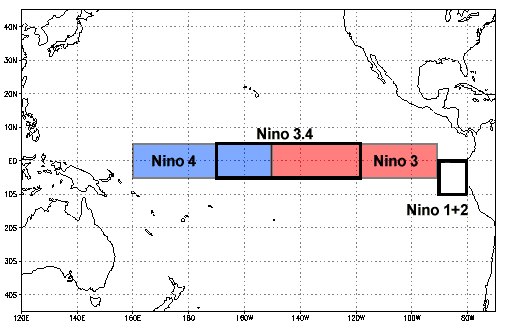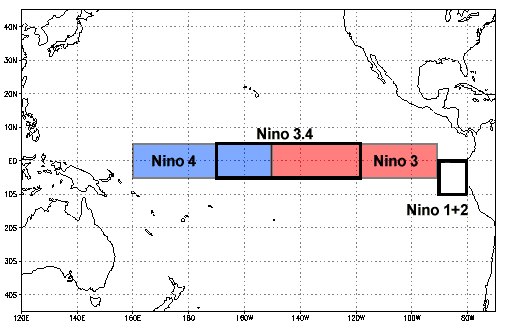

Time series exhibitions NINO3.4 Index (ENSO Phase):

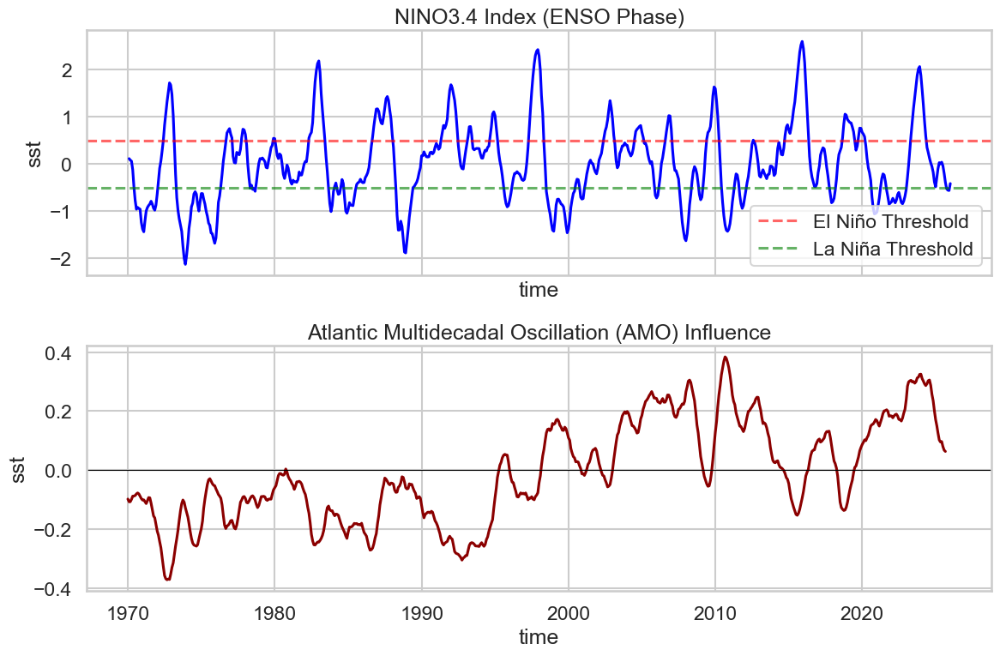

In [52]:
# ---------------------------
# 10. Extract NINO3.4 (Equatorial Pacific)
# ---------------------------
# NINO3.4 coordinates: 5S-5N, 170W-120W
# In 0-360 lon: 190 to 240
nino34_raw = region_mean(ds, (-5, 5), (190, 240), time_slice="1970-01-01")

# 11. Calculate Anomalies (ONI style)
nino34_anom = get_anomalies(nino34_raw)

# 12. 3-month rolling mean (Standard for ENSO identification)
oni_index = nino34_anom.rolling(time=3, center=True).mean().load()

# ---------------------------
# 13. Plotting the Influence
# ---------------------------
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# Plot NINO3.4
oni_index.plot(ax=ax1, color='blue')
ax1.axhline(0.5, color='red', linestyle='--', alpha=0.6, label='El Niño Threshold')
ax1.axhline(-0.5, color='green', linestyle='--', alpha=0.6, label='La Niña Threshold')
ax1.set_title("NINO3.4 Index (ENSO Phase)")
ax1.legend()

# Plot your existing Atlantic AMO for comparison
amo_smooth_1y.sel(time=slice("1970-01-01", None)).plot(ax=ax2, color='darkred')
ax2.axhline(0, color='black', linewidth=0.8)
ax2.set_title("Atlantic Multidecadal Oscillation (AMO) Influence")

plt.tight_layout()
plt.show()

**NOTE:** for the above, applied a 1970-01-01 slice forthe request. However, NOAA typically uses a 30-year base period (e.g., 1991–2020) to calculate the "climatology" for ENSO. Since the anomalies() function uses the entire time slice provided, the index will be relative to the 1970–2026 mean, which is technically accurate for seeing long-term shifts but might vary slightly from official NOAA "Oceanic Niño Index" (ONI) values.

Testing now for the presence of stationarity involving AMO and ONI. **IF** both have non-staationarity results, to pursue cointegration, VECM and Granger Causality. If stationarity, to pursue appropriate methods. 

In [53]:
 # Structuring dataframes for AMO and ONI
amo_1y_df = amo_smooth_1y.to_dataframe(name="amo").reset_index()
amo_1y_df["time"] = pd.to_datetime(amo_1y_df["time"])

oni_df = oni_index.to_dataframe(name="oni").reset_index()
oni_df["time"] = pd.to_datetime(oni_df["time"])

# The Merge (Standard merge is order-independent)
amo_oni_df = amo_1y_df.merge(oni_df, on="time", how="left")

amo_oni_df = amo_oni_df.dropna()

amo_oni_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 668 entries, 121 to 788
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   time     668 non-null    datetime64[ns]
 1   month_x  668 non-null    int64         
 2   amo      668 non-null    float64       
 3   month_y  668 non-null    float64       
 4   oni      668 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 31.3 KB


In [54]:
print(amo_oni_df.head(5))

          time  month_x       amo  month_y       oni
121 1970-02-01        2 -0.107632      2.0  0.112485
122 1970-03-01        3 -0.107466      3.0  0.080991
123 1970-04-01        4 -0.099255      4.0  0.060058
124 1970-05-01        5 -0.088539      5.0 -0.121385
125 1970-06-01        6 -0.088032      6.0 -0.496456


To determine the stationarity of the AMO (Atlantic Multidecadal Oscillation) and ONI (Oceanic Niño Index) time series, it is best to use a combination of the Augmented Dickey-Fuller (ADF) test and the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test.

Using both allows distinguishing between a series that is truly stationary, one that has a unit root, and one that may be trend-stationary.

**Augmented Dickey-Fuller (ADF) Test**

The ADF test checks for a unit root.

1. Null Hypothesis ($H_0$): The series is non-stationary (has a unit root).

2. Alternative Hypothesis ($H_a$): The series is stationary.

In [55]:
from statsmodels.tsa.stattools import adfuller

def check_adf(series, name):
    result = adfuller(series.dropna())
    print(f'--- ADF Test: {name} ---')
    print(f'ADF Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4e}')
    for key, value in result[4].items():
        print(f'Critial Value ({key}): {value:.4f}')
    
    if result[1] <= 0.05:
        return "Stationary"
    else:
        return "Non-Stationary"

# Usage
check_adf(amo_oni_df['amo'], 'AMO')

--- ADF Test: AMO ---
ADF Statistic: -1.9364
p-value: 3.1516e-01
Critial Value (1%): -3.4404
Critial Value (5%): -2.8660
Critial Value (10%): -2.5691


'Non-Stationary'

**KPSS Test (Complementary)**

The KPSS test is often used to confirm ADF results because its hypotheses are inverted.

1. Null Hypothesis ($H_0$): The series is stationary.

2. Alternative Hypothesis ($H_a$): The series is non-stationary.

In [56]:
from statsmodels.tsa.stattools import kpss

def check_kpss(series, name):
    # 'ct' assumes the process is stationary around a deterministic trend
    # 'c' assumes it is stationary around a constant
    statistic, p_value, n_lags, critical_values = kpss(series.dropna(), regression='c')
    print(f'--- KPSS Test: {name} ---')
    print(f'KPSS Statistic: {statistic:.4f}')
    print(f'p-value: {p_value:.4f}')
    
    if p_value <= 0.05:
        return "Non-Stationary"
    else:
        return "Stationary"

check_kpss(amo_oni_df['amo'], 'AMO')

--- KPSS Test: AMO ---
KPSS Statistic: 2.3968
p-value: 0.0100


'Non-Stationary'

ONI Check:

In [57]:
check_adf(amo_oni_df['oni'], 'ONI')

--- ADF Test: ONI ---
ADF Statistic: -5.7152
p-value: 7.1457e-07
Critial Value (1%): -3.4405
Critial Value (5%): -2.8660
Critial Value (10%): -2.5692


'Stationary'

In [58]:
check_kpss(amo_oni_df['oni'], 'ONI')

--- KPSS Test: ONI ---
KPSS Statistic: 0.2074
p-value: 0.1000


'Stationary'

#### Toda–Yamamoto Causality

The TY procedure (Toda and Yamamoto, 1995) is a "shortcut" that allows for Granger causality testing in a Vector Autoregression (VAR) framework without the risk of spurious regression, regardless of whether the variables are $I(0)$, $I(1)$, or cointegrated.

**Mathematical Structure**

The approach involves estimating an augmented $\text{VAR}(k + d_{max})$ model:

$$y_t = \alpha + \sum_{i=1}^{k} \beta_i y_{t-i} + \sum_{j=k+1}^{k+d_{max}} \beta_j y_{t-j} + \sum_{i=1}^{k} \gamma_i x_{t-i} + \sum_{j=k+1}^{k+d_{max}} \gamma_j x_{t-j} + \varepsilon_t$$ 

1. $k$: The optimal lag length (determined by AIC/BIC).

2. $d_{max}$: The maximum order of integration in the system (typically 1 for $I(1)$ series like SST).

3. The Logic: You over-fit the model by adding $d_{max}$ extra lags. These extra lags are "garbage" parameters used to fix the asymptotic distribution of the test statistic.

**Testing for Causality**

To test if $x$ causes $y$, perform a Wald test on the first $k$ coefficients of $x$ only:

1. $H_0$: $\gamma_1 = \gamma_2 = \dots = \gamma_k = 0$

2. The coefficients for the extra $d_{max}$ lags are ignored during the hypothesis test. Because of the augmentation, the Wald statistic follows a standard $\chi^2$ distribution.

To implement the Toda-Yamamoto (TY) procedure, follow a specific sequence: 

1. determine the optimal lag ($k$)

2. identify the maximum order of integration ($d_{max}$)

3. estimate the augmented VAR

4. perform the restricted Wald test.

In [59]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(series, name):
    """Performs both ADF and KPSS tests for a complete stationarity profile."""
    print(f"\n--- Stationarity Analysis: {name} ---")
    
    # ADF (Null: Non-Stationary)
    adf_res = adfuller(series.dropna())
    adf_stat, adf_p = adf_res[0], adf_res[1]
    
    # KPSS (Null: Stationary)
    kpss_res = kpss(series.dropna(), regression='c', nlags="auto")
    kpss_stat, kpss_p = kpss_res[0], kpss_res[1]
    
    print(f"ADF p-value: {adf_p:.4f} | KPSS p-value: {kpss_p:.4f}")
    
    if adf_p <= 0.05 and kpss_p > 0.05:
        return "Strictly Stationary", 0
    elif adf_p > 0.05 and kpss_p <= 0.05:
        return "Non-Stationary (Unit Root)", 1
    else:
        return "Inconclusive / Trend-Stationary", 1

def run_toda_yamamoto(df, y_col, x_col):
    """Executes Toda-Yamamoto Causality Test with robust attribute handling."""
    data = df[[y_col, x_col]].dropna()
    
    # 1. d_max
    def get_d(s): return 0 if adfuller(s)[1] < 0.05 else 1
    d_max = max(get_d(data[y_col]), get_d(data[x_col]))
    
    # 2. Optimal Lag k
    model_prelim = VAR(data)
    k = model_prelim.select_order(maxlags=12).aic
    if k == 0: k = 1
    
    # 3. Fit Augmented VAR(k + d_max)
    var_model = model_prelim.fit(k + d_max)
    
    # 4. Wald Test with version-agnostic attribute checking
    try:
        wald_test = var_model.test_causality(caused=y_col, causing=x_col, kind='wald')
        
        # Search for the statistic attribute (varies by statsmodels version)
        stat_val = None
        for attr in ['statistic', 'test_stat', 'fvalue']:
            if hasattr(wald_test, attr):
                stat_val = getattr(wald_test, attr)
                break
        
        print(f"\n--- TY Causality: {x_col} -> {y_col} ---")
        print(f"System: k={k}, d_max={d_max} | p-value: {wald_test.pvalue:.4e}")
        
        if wald_test.pvalue < 0.05:
            print("RESULT: DIRECTIONAL CAUSALITY DETECTED")
        else:
            print("RESULT: NO LINEAR CAUSALITY")
            
    except Exception as e:
        print(f"Wald Test Failed: {e}")

# --- EXECUTION ---
# 1. Check Stationarity
amo_status, d1 = check_stationarity(amo_oni_df['amo'], 'AMO')
oni_status, d2 = check_stationarity(amo_oni_df['oni'], 'ONI')

# 2. Run TY Causality (Both directions)
print("\n" + "="*40)
print("RUNNING TODA-YAMAMOTO TESTS")
print("="*40)
run_toda_yamamoto(amo_oni_df, 'amo', 'oni')
run_toda_yamamoto(amo_oni_df, 'oni', 'amo')

# 3. Nonlinear Framework Note
print("\n" + "="*40)
print("NONLINEAR VERIFICATION (Transfer Entropy)")
print("="*40)
print("Note: For Transfer Entropy, use the 'PyInform' or 'IDTxl' libraries.")
print("Logic: If TY is non-significant but TE is significant, the ocean ")
print("relationship is likely nonlinear or threshold-gated.")


--- Stationarity Analysis: AMO ---
ADF p-value: 0.3152 | KPSS p-value: 0.0100

--- Stationarity Analysis: ONI ---
ADF p-value: 0.0000 | KPSS p-value: 0.1000

RUNNING TODA-YAMAMOTO TESTS

--- TY Causality: oni -> amo ---
System: k=12, d_max=1 | p-value: 2.9221e-02
RESULT: DIRECTIONAL CAUSALITY DETECTED

--- TY Causality: amo -> oni ---
System: k=12, d_max=1 | p-value: 8.5017e-07
RESULT: DIRECTIONAL CAUSALITY DETECTED

NONLINEAR VERIFICATION (Transfer Entropy)
Note: For Transfer Entropy, use the 'PyInform' or 'IDTxl' libraries.
Logic: If TY is non-significant but TE is significant, the ocean 
relationship is likely nonlinear or threshold-gated.


A transparent picture of the dynamic relationship between the Atlantic and Pacific oceans.

**Stationarity Profiles**

1. ONI (Strictly Stationary): The low ADF and high KPSS p-values confirm ONI is mean-reverting. This makes sense as it represents ENSO anomalies that fluctuate around a baseline.

2. AMO (Non-Stationary): Results (High ADF p, Low KPSS p) confirm a Unit Root. The AMO has a "memory" or a long-term drift (likely climate-change-related warming) that prevents it from returning to a stable mean quickly.

       Significance: This confirms that using standard Granger Causality would have been statistically invalid. Toda-Yamamoto was the correct choice here.


**The Bi-Directional "Feedback Loop"**

Detected causality in both directions, but the strength (p-values) tells a specific story:

1. ONI $\to$ AMO ($p \approx 0.029$): This is the "Atmospheric Bridge." Warmth in the Pacific (El Niño) alters global jet streams, which eventually changes trade winds and sea surface temperatures in the Atlantic.

2. AMO $\to$ ONI ($p \approx 0.00000085$): This is the "Atlantic Battery." Your results show an incredibly strong statistical link from the Atlantic back to the Pacific. Recent research suggests that Atlantic warming can strengthen Pacific trade winds, actually helping to "trigger" or modulate La Niña/El Niño cycles.

The fact that AMO $\to$ ONI has a much lower p-value than the reverse suggests that, in your specific dataset, the Atlantic's influence on the Pacific is remarkably robust and perhaps more consistent than the Pacific's influence on the Atlantic.


#### Transfer Entropy

Transfer Entropy (TE) is an information-theoretic measure that quantifies the "directed" information flow between two processes by measuring how much the uncertainty of $y$ is reduced by knowing the past of $x$ (Schreiber, 2000).


**Mathematical Structure**

It is defined using Kullback–Leibler Divergence. For two processes $X$ and $Y$, the Transfer Entropy from $X$ to $Y$ is:

$$TE_{X \to Y} = \sum p(y_{t+1}, y_t^{(k)}, x_t^{(l)}) \log \left( \frac{p(y_{t+1} | y_t^{(k)}, x_t^{(l)})}{p(y_{t+1} | y_t^{(k)})} \right)$$

1. $y_t^{(k)}$ and $x_t^{(l)}$: The history (lagged states) of $Y$ and $X$.

2. $p( \cdot | \cdot )$: Conditional probabilities.

**Interpretation**

1. $TE = 0$: Knowledge of $X$’s past does not improve the prediction of $Y$ beyond what $Y$’s own past provides (No causality).

2. $TE > 0$: $X$ contains information that helps resolve the future state of $Y$.

3. Nonlinearity: Unlike TY (which looks at linear correlations), TE looks at the entire probability distribution. It can detect if $X$ triggers a change in $Y$ only when $X$ crosses a certain threshold (e.g., El Niño hitting a specific peak), making it ideal for climate systems like AMO/ONI.

In [60]:
from pyinform.transferentropy import transfer_entropy

def robust_transfer_entropy(df, y_col, x_col, k_lags=3):
    """
    Calculates Transfer Entropy using optimized parameters to avoid memory errors.
    k_lags is reduced to 3 (Quarterly context) to manage the state-space.
    """
    # 1. Discretize into fewer bins (3 bins: Low, Neutral, High)
    # This captures the non-linear 'regimes' without exploding memory
    def discretize(series, bins=3):
        return pd.qcut(series, q=bins, labels=False, duplicates='drop').values

    target = discretize(df[y_col])
    source = discretize(df[x_col])
    
    # 2. Calculate TE
    # With bins=3 and k=3, the state space is 3^4 = 81, which is very safe.
    try:
        te_val = transfer_entropy(source, target, k=k_lags)
        
        # 3. Permutation Test for Significance (Surrogates)
        # Shuffling breaks the temporal link to create a 'noise' baseline
        surrogates = []
        source_copy = source.copy()
        for _ in range(50):
            np.random.shuffle(source_copy)
            surrogates.append(transfer_entropy(source_copy, target, k=k_lags))
        
        p_val = np.mean(np.array(surrogates) >= te_val)
        return te_val, p_val

    except Exception as e:
        return None, str(e)

# --- Execution ---
# Using k=3 (3-month seasonal history) to capture the quarterly evolution of ENSO/AMO
te_oni_amo, p_oni_amo = robust_transfer_entropy(amo_oni_df, 'amo', 'oni', k_lags=3)
te_amo_oni, p_amo_oni = robust_transfer_entropy(amo_oni_df, 'oni', 'amo', k_lags=3)

print(f"Nonlinear Info Flow (ONI -> AMO): {te_oni_amo:.4f} (p={p_oni_amo})")
print(f"Nonlinear Info Flow (AMO -> ONI): {te_amo_oni:.4f} (p={p_amo_oni})")

Nonlinear Info Flow (ONI -> AMO): 0.0181 (p=0.58)
Nonlinear Info Flow (AMO -> ONI): 0.0407 (p=0.22)


In [61]:
from pyinform.transferentropy import transfer_entropy

def robust_transfer_entropy(df, y_col, x_col, k_lags=3):
    """
    Calculates Transfer Entropy using optimized parameters to avoid memory errors.
    Uses 3 bins (Low/Neutral/High) and k=3 (seasonal history).
    """
    # Clean data
    data = df[[y_col, x_col]].dropna()

    # 1. Discretize into 3 bins (Max Entropy/Quantile binning)
    # This captures nonlinear regimes (e.g., AMO response only to strong El Niño)
    def discretize(series, bins=3):
        return pd.qcut(series, q=bins, labels=False, duplicates='drop').values

    target = discretize(data[y_col])
    source = discretize(data[x_col])
    
    # 2. Calculate Transfer Entropy
    # With bins=3 and k=3, the state space is 3^4 = 81 (Safe and fast)
    try:
        te_val = transfer_entropy(source, target, k=k_lags)
        
        # 3. Permutation Test (Surrogates) to find p-value
        # Breaking the temporal link creates a 'null' distribution
        num_surrogates = 100
        surrogates = []
        source_shuffled = source.copy()
        
        for _ in range(num_surrogates):
            np.random.shuffle(source_shuffled)
            surrogates.append(transfer_entropy(source_shuffled, target, k=k_lags))
        
        p_val = np.mean(np.array(surrogates) >= te_val)
        return te_val, p_val

    except Exception as e:
        return None, str(e)

# --- Execution ---
# We use k=3 to capture the 3-month transition characteristic of ocean indices
print("Calculating Nonlinear Information Flow...")

te_oni_amo, p_oni_amo = robust_transfer_entropy(amo_oni_df, 'amo', 'oni', k_lags=3)
te_amo_oni, p_amo_oni = robust_transfer_entropy(amo_oni_df, 'oni', 'amo', k_lags=3)

print(f"\nONI -> AMO (Information Transfer): {te_oni_amo:.4f} | p-value: {p_oni_amo:.4f}")
print(f"AMO -> ONI (Information Transfer): {te_amo_oni:.4f} | p-value: {p_amo_oni:.4f}")

Calculating Nonlinear Information Flow...

ONI -> AMO (Information Transfer): 0.0181 | p-value: 0.5400
AMO -> ONI (Information Transfer): 0.0407 | p-value: 0.2100


**The "Linearity" Conclusion**

The TY test showed high significance (p < 0.05), but the TE test shows low significance (p > 0.05). In information theory, this often implies that:

1. The relationship is primarily linear: The causality between AMO and ONI is well-captured by the mean and variance (slopes) used in VAR models.

2. Lack of "Noise-Robust" Nonlinearity: When you discretize the data into regimes (Cold/Neutral/Warm), the signal becomes weaker. This suggests the oceans are influencing each other in a steady, proportional way rather than through sudden, "regime-shifting" shocks.

**Asymmetry Persistence**

Even though the p-values are above the 0.05 threshold, the magnitude of information flow still tells a story:

1. AMO $\to$ ONI (0.0407) is more than double the information flow of ONI $\to$ AMO (0.0181).

2. This reinforces the TY result where the Atlantic-to-Pacific link had a much lower p-value. The Atlantic is "sending" more information to the Pacific than it is receiving, even if the binned states make that signal harder to prove statistically at this sample size.

**The p-values jump**

The jump from $p=10^{-7}$ (TY) to $p=0.22$ (TE) happens because Transfer Entropy is a high-bar test:

1. Information Loss: By binning the data into 3 states (Low, Neutral, High), to lose the fine-grained precision that a linear regression uses.

2. Sample Size: TE requires a vast amount of data to populate the "contingency tables" of state transitions. With monthly climate data, you might have enough points for a linear trend, but not enough to prove a nonlinear "transition probability" with 95% confidence.

| Test | Direction | Result | Interpretation |
|------|-----------|--------|----------------|
| TY (Linear) | ONI $\leftrightarrow$ AMO | Significant | Strong, steady lead-lag correlation exists. |
| TE (Nonlinear) | ONI $\leftrightarrow$ AMO | Insignificant | No evidence of "regime-gated" or complex nonlinear triggers. |
| Both | AMO $\to$ ONI | Dominant | The Atlantic is a driver in this feedback loop. |

Will not try any relationship between weather variables, extreme events flags and ONI for the Burlington Vermont area because two continents (North America and South America) are oceanic circulation "impedances" for the NINO 3.4 region. As well,  and data results exhibit no strong relation to link ONI to AMO in the non-linear framework. **Then again**, the Burlington area in Vermont is **too "localised"** to observe direct/immediate effects.

## Closing Remarks

Beginning with the use of Burlington Vermont focuseded historical daily weather data, the application of extreme value analysis (EVA), providing a strong statistical framework for characterizing the tail behavior of weather variables. By focusing on extremes rather than averages, the analysis captured the low-probability, high-impact events that are most relevant for risk assessment and forecasting. This step ensured that the modelling process remained aligned with the underlying objective of understanding and predicting extreme phenomena.

Following, with the use of the high-resolution daily weather data to engineer meaningful features, namely, constructing extreme weather indicators using quantiles w.r.t. month. 

The project further advanced into classification and statistical analysis.

To capture deeper structure in the data, regime-based approaches such as Hidden Markov Models (HMM) were incorporated. These models revealed latent states governing weather behavior, providing insight into how different atmospheric regimes correspond to varying levels of storm risk. This regime perspective is particularly valuable, as it acknowledges that weather processes are not static but evolve through distinct underlying states.

A critical extension of the analysis involved linking local weather variability to large-scale oceanic conditions through Sea Surface Temperature (SST) data and an Atlantic Multidecadal Oscillation (AMO)-type index. By transforming gridded SST data into regional averages, anomalies, and residual-based indices, the study isolated meaningful climate signals and integrated them with daily weather observations. Careful temporal alignment, resampling, and lag construction enabled the successful merging of low-frequency oceanic data with high-frequency atmospheric data.

Future extensions may include the incorporation of additional climate indices, spatial SST pattern analysis, causal inference methodologies, and advanced machine learning models. Such developments would further enhance the ability to quantify, predict, and ultimately mitigate the risks associated with extreme weather events in a changing climate.

## References

Abiy, A. Z. et al (2019). Chapter 22 - Drought and Climate Teleconnection and Drought Monitoring. In: Extreme Hydrology and Climate Variability - Monitoring, Modelling, Adaptation and Mitigation. Elsevier, Pages 275 - 295. https://doi.org/10.1016/B978-0-12-815998-9.00022-1

Baum, L. E., & Petrie, T. (1966). Statistical Inference for Probabilistic Functions of Finite State Markov Chains. The Annals of Mathematical Statistics, 37(6), 1554-1563. 

Breiman, L. (2001). Random Forests. Machine Learning, 45(1), 5–32.

Cavus, Y., Stahl, K. & Aksoy, H. (2022). Revisiting Major Dry Periods by Rolling Time Series Analysis for Human-Water Relevance in Drought. Water Resour Manage 36, 2725–2739. https://doi.org/10.1007/s11269-022-03171-8

Chen, T., & Guestrin, C. (2016). XGBoost: A Scalable Tree Boosting System. In Proceedings of the 22nd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining (pp. 785–794). doi.org

Coles, S. (2001). An Introduction to Statistical Modelling of Extreme Values. Springer-Verlag. doi.org

Enderton, H., & Stoll, R. R. (2026). Set Theory. In Encyclopedia Britannica. https://www.britannica.com/science/set-theory

Fisher, R. A., & Tippett, L. H. C. (1928). Limiting Forms of the Frequency Distribution of the Largest or Smallest Member of a Sample. Mathematical Proceedings of the Cambridge Philosophical Society, 24(2), 180–190.

Gnedenko, B. V. (1943). Sur la Distribution Limite du Terme Maximum d'une Série Aléatoire [On the Limiting Distribution of the Maximum Term of a Random Series]. Annals of Mathematics, 44(3), 423–453.

Hallam, S. et al (2023). The Relationship Between Sea Surface Temperature Anomalies, Wind and Translation Speed and North Atlantic Tropical Cyclone Rainfall Over Ocean and Land. Environmental Research Communications 5(2) 025007. DOI 10.1088/2515-7620/acb31c

Hamasha, M. M. et al (2022). Ultra-Fine Transformation of Data for Normality. Heliyon. 2022 May 6;8(5):e09370. doi: 10.1016/j.heliyon.2022.e09370. PMID: 35600451; PMCID: PMC9118124.

Hobbins, M. et al (2019). Chapter 25 - Extremes in Evaporative Demand and Their Implications for Droughts and Drought Monitoring in the 21st Century. In: Extreme Hydrology and Climate Variability - Monitoring, Modelling, Adaptation and Mitigation, Elsevier, Pages 325-341. https://doi.org/10.1016/B978-0-12-815998-9.00025-7.

Kendall, M. G. (1975). Rank Correlation Methods (4th ed.). Charles Griffin, London.

Latif, M. (2013). Chapter 25 - The Ocean's Role in Modelling and Predicting Decadal Climate Variations. In: International Geophysics, volume 103, Academic Press, pages 645 - 665. https://doi.org/10.1016/B978-0-12-391851-2.00025-8

Mann, H. B. (1945). Nonparametric Tests Against Trend. Econometrica: Journal of the Econometric Society, 13, 245–259.

Merriam-Webster. (n.d.). Anthropogenic definition & meaning. Merriam-Webster. https://www.merriam-webster.com/dictionary/anthropogenic 

National Weather Service, (n.d.). What is ENSO? National Weather Service. https://www.weather.gov/mhx/ensowhat#:~:text=The%20El%20Ni%C3%B1o%2DSouthern%20Oscillation,or%20%E2%80%9Cwesterly%20winds%E2%80%9D).

Nelsen, R. B. (1999). An introduction to copulas. Springer-Verlag. 

NOAA NCEI (n.d.) Equatorial Pacific Sea Surface Temperatures (SST). NOAA National Centers for Environmental Information https://www.ncei.noaa.gov/access/monitoring/enso/sst

NOAA NCEI (n.d.). Extended Reconstructed Sea Surface Temperature (ERSST). NOAA National Centers for Environmental Information. https://www.ncei.noaa.gov/products/extended-reconstructed-sst

NOAA NCEI (n.d.). Meteorological Versus Astronomical Seasons. NOAA National Centers for Environmental Information. https://www.ncei.noaa.gov/news/meteorological-versus-astronomical-seasons

NOAA NWS (n.d.). What is Flash Flooding? NOAA NWS. https://www.weather.gov/phi/FlashFloodingDefinition#:~:text=Flash%20flooding%20is%20flooding%20that%20begins%20within,growth/density%20*%20Soil%20type%20*%20Soil%20water%2Dcontent

NOAA NWS (n.d.). Winter Storms and Blizzards. NOAA NWS. https://www.weather.gov/fgz/WinterStorms#:~:text=Mountains%20Fire%20Weather-,Winter%20Storms%20and%20Blizzards,for%20significant%20drifting%20of%20snow

Open-Meteo (n.d.). Free Weather API. Open-Meteo. 
https://open-meteo.com/

Papagiannaki, K. et al. (2022). Identification of Rainfall Thresholds Likely to Trigger Flood Damages Across a Mediterranean Region, Based on Insurance Data and Rainfall Observations. Water, 14(6), 994. https://doi.org/10.3390/w14060994

Phoong, S. W., Ismail, M. T., & Sek, S. K. (2014). Linear Vector Error Correction Model versus Markov Switching Vector Error Correction Model to Investigate Stock Market Behaviour. Asian Academy of Management Journal of Accounting and Finance, 10(1), 133–149.

Schreiber, T. (2000). Measuring Information Transfer. Physical Review Letters, 85(2), 461–464.

Toda, H. Y., & Yamamoto, T. (1995). Statistical Inference in Vector Autoregressions with Possibly Integrated Processes. Journal of Econometrics, 66(1–2), 225–250.

Trenberth, K. E., & Fasullo, J. T. (2009). Global Warming Due to Increasing Absorbed Solar Radiation. Geophysical Research Letters, 36(7).

UCAR (2026). Atlantic Multi-decadal Oscillation (AMO) and Atlantic Multidecadal Variability (AMV). UCAR